<h1><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">AUTOMATIC TICKETASSIGNMENT CAPSTONE PROJECT </span></strong></li>
</ul></h1>

In [ ]:
# imports

import warnings

warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)

import email
import math
import os
import random
import re
import string
import unicodedata
from collections import Counter, defaultdict
from pathlib import Path
from pprint import pprint
from time import time

import contractions
import hjson
import jenkspy
import mailparser
import matplotlib.pyplot as plt
import nltk
import numpy as np
import pandas as pd
import scipy.stats as stats
import seaborn as sns
import spacy
import tensorflow
import xlrd
import yake
from bs4 import BeautifulSoup
from charset_normalizer import from_bytes
from ftfy import fix_text
from langdetect import DetectorFactory, detect_langs
from langdetect.lang_detect_exception import LangDetectException
from nltk.corpus import words
from nltk.stem.snowball import SnowballStemmer
from nltk.tokenize import sent_tokenize, word_tokenize
from pandas.core.common import flatten
from sklearn.preprocessing import LabelEncoder
from tqdm import tqdm

from utils.date_handler import DateHandler
from utils.email_handler import EmailHandler, email_regex
from utils.link_handler import LinkHandler
from utils.tel_handler import TelHandler
from utils.utils import clean_text, is_blank, is_not_blank, load_hjson
from wordcloud import STOPWORDS, WordCloud

tqdm.pandas()
%matplotlib inline
!python -m spacy download en_core_web_sm
nlp = spacy.load('en_core_web_sm', disable=['parser'])

In [ ]:
CONFIG_DIR = 'config'
config = load_hjson(Path("config\\config.hjson"))

In [ ]:
# reproducibility
seed = config['seed']
random.seed(seed)
tensorflow.random.set_seed(seed)

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Import & Analyse the data.</span></strong></li>
</ul></h3>

In [ ]:
dataset = pd.read_excel('input_data automated ticket dataset-12.xlsx')

In [ ]:
dataset.shape  # very small dataset with only 8500 rows

(8500, 4)

In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  8492 non-null   object
 1   Description        8499 non-null   object
 2   Caller             8500 non-null   object
 3   Assignment group   8500 non-null   object
dtypes: object(4)
memory usage: 265.8+ KB


In [ ]:
# rename column names
dataset = dataset.rename(columns={
    "Short description": "short_description",
    "Description": "description",
    "Caller": "caller",
    "Assignment group": "group"
    })

In [ ]:
np.unique(dataset.group), len(np.unique(dataset.group))  # 74 different functional groups

(array(['GRP_0', 'GRP_1', 'GRP_10', 'GRP_11', 'GRP_12', 'GRP_13', 'GRP_14',
        'GRP_15', 'GRP_16', 'GRP_17', 'GRP_18', 'GRP_19', 'GRP_2',
        'GRP_20', 'GRP_21', 'GRP_22', 'GRP_23', 'GRP_24', 'GRP_25',
        'GRP_26', 'GRP_27', 'GRP_28', 'GRP_29', 'GRP_3', 'GRP_30',
        'GRP_31', 'GRP_32', 'GRP_33', 'GRP_34', 'GRP_35', 'GRP_36',
        'GRP_37', 'GRP_38', 'GRP_39', 'GRP_4', 'GRP_40', 'GRP_41',
        'GRP_42', 'GRP_43', 'GRP_44', 'GRP_45', 'GRP_46', 'GRP_47',
        'GRP_48', 'GRP_49', 'GRP_5', 'GRP_50', 'GRP_51', 'GRP_52',
        'GRP_53', 'GRP_54', 'GRP_55', 'GRP_56', 'GRP_57', 'GRP_58',
        'GRP_59', 'GRP_6', 'GRP_60', 'GRP_61', 'GRP_62', 'GRP_63',
        'GRP_64', 'GRP_65', 'GRP_66', 'GRP_67', 'GRP_68', 'GRP_69',
        'GRP_7', 'GRP_70', 'GRP_71', 'GRP_72', 'GRP_73', 'GRP_8', 'GRP_9'],
       dtype=object),
 74)

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Check for Incomplete Information</span></strong></li>
</ul></h3>

In [ ]:
dataset.isna().sum()  # Few missing values

short_description    8
description          1
caller               0
group                0
dtype: int64

In [ ]:
dataset[dataset.isna().any(axis=1)]  # check rows with missing values

,short_description,description,caller,group
2604,NaN,_x000D_\n_x000D_\nreceived from: ohdrnswl.rezu...,ohdrnswl rezuibdt,GRP_34
3383,NaN,_x000D_\n-connected to the user system using t...,qftpazns fxpnytmk,GRP_0
3906,NaN,-user unable tologin to vpn._x000D_\n-connect...,awpcmsey ctdiuqwe,GRP_0
3910,NaN,-user unable tologin to vpn._x000D_\n-connect...,rhwsmefo tvphyura,GRP_0
3915,NaN,-user unable tologin to vpn._x000D_\n-connect...,hxripljo efzounig,GRP_0
3921,NaN,-user unable tologin to vpn._x000D_\n-connect...,cziadygo veiosxby,GRP_0
3924,NaN,name:wvqgbdhm fwchqjor\nlanguage:\nbrowser:mic...,wvqgbdhm fwchqjor,GRP_0
4341,NaN,_x000D_\n_x000D_\nreceived from: eqmuniov.ehxk...,eqmuniov ehxkcbgj,GRP_0
4395,i am locked out of skype,NaN,viyglzfo ajtfzpkb,GRP_0


In [ ]:
dataset.loc[dataset['description'].isna()]

,short_description,description,caller,group
4395,i am locked out of skype,NaN,viyglzfo ajtfzpkb,GRP_0


In [ ]:
dataset.iloc[4395]

short_description    i am locked out of skype
description                               NaN
caller                      viyglzfo ajtfzpkb
group                                   GRP_0
Name: 4395, dtype: object

In [ ]:
# imputing the short description by value in description and vice-versa
# However, If both columns were missing, we would have to drop the row
dataset.loc[dataset['description'].isna(), 'description']  = dataset.loc[dataset['description'].isna()].short_description

In [ ]:
dataset.loc[dataset['short_description'].isna()]

,short_description,description,caller,group
2604,NaN,_x000D_\n_x000D_\nreceived from: ohdrnswl.rezu...,ohdrnswl rezuibdt,GRP_34
3383,NaN,_x000D_\n-connected to the user system using t...,qftpazns fxpnytmk,GRP_0
3906,NaN,-user unable tologin to vpn._x000D_\n-connect...,awpcmsey ctdiuqwe,GRP_0
3910,NaN,-user unable tologin to vpn._x000D_\n-connect...,rhwsmefo tvphyura,GRP_0
3915,NaN,-user unable tologin to vpn._x000D_\n-connect...,hxripljo efzounig,GRP_0
3921,NaN,-user unable tologin to vpn._x000D_\n-connect...,cziadygo veiosxby,GRP_0
3924,NaN,name:wvqgbdhm fwchqjor\nlanguage:\nbrowser:mic...,wvqgbdhm fwchqjor,GRP_0
4341,NaN,_x000D_\n_x000D_\nreceived from: eqmuniov.ehxk...,eqmuniov ehxkcbgj,GRP_0


In [ ]:
dataset.loc[dataset['short_description'].isna(), 'short_description']  = dataset.loc[dataset['short_description'].isna()].description

In [ ]:
dataset.isna().sum()  # all missing values imputed

short_description    0
description          0
caller               0
group                0
dtype: int64

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Target Class Distribution</span></strong></li>
</ul></h3>

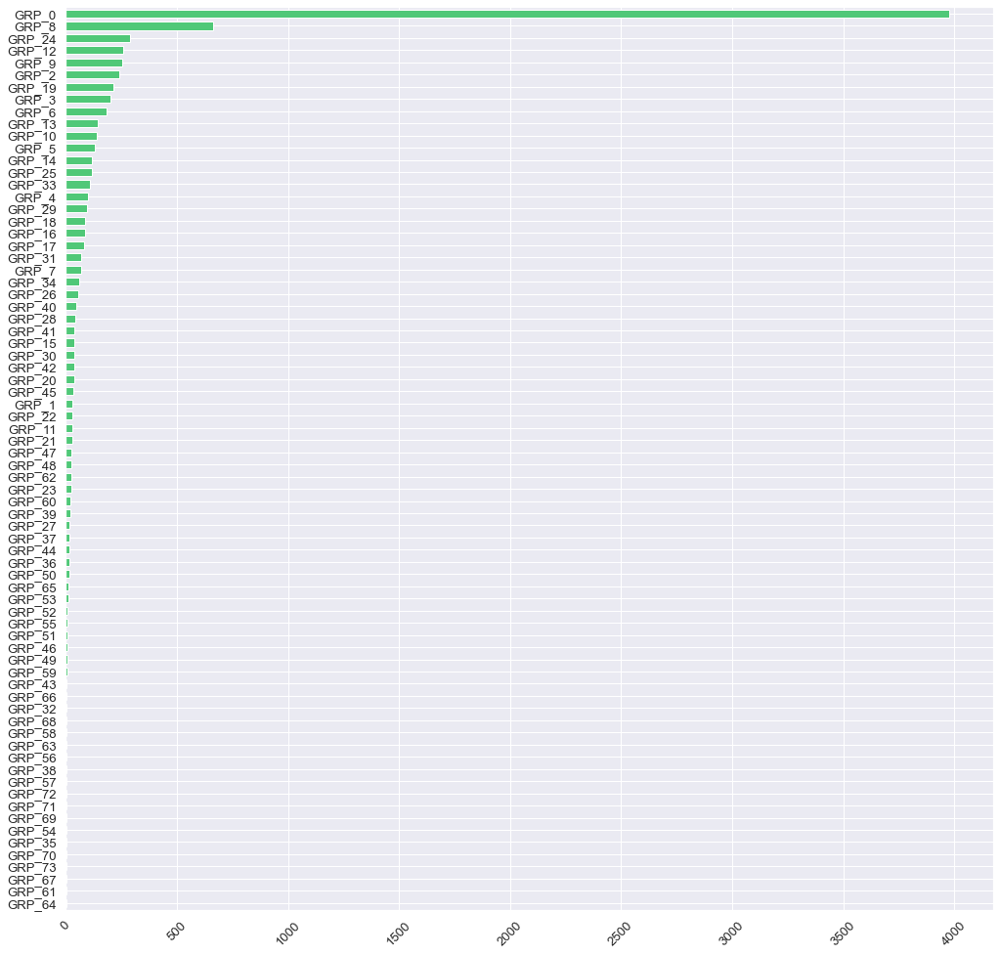

In [ ]:
sns.set(font_scale=1.2)  # scale up font size
dataset.group.value_counts().sort_values(ascending=True).plot(kind='barh', width=0.65, figsize=(17, 17), color=config['green_rgb'])
plt.xticks(rotation=45)
plt.show()

In [ ]:
dataset.group.value_counts().sort_values(ascending=False).tail(30)  # few classes with only single-digit datapoints

GRP_36    15
GRP_44    15
GRP_50    14
GRP_65    11
GRP_53    11
GRP_52     9
GRP_55     8
GRP_51     8
GRP_59     6
GRP_46     6
GRP_49     6
GRP_43     5
GRP_32     4
GRP_66     4
GRP_68     3
GRP_58     3
GRP_63     3
GRP_56     3
GRP_38     3
GRP_57     2
GRP_72     2
GRP_71     2
GRP_69     2
GRP_54     2
GRP_61     1
GRP_67     1
GRP_35     1
GRP_70     1
GRP_73     1
GRP_64     1
Name: group, dtype: int64

In [ ]:
dataset[dataset.group == 'GRP_70']  # small groups have to merged into a separate "Others" category
dataset[dataset.group == 'GRP_70'].description.tolist()[0]

'an e-mail from  it training has email hints and tips #1.  under "create signature" it has a link "company formatheywting standard" that i am forbidden to see.\n615'

<h5><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>The target class distribution is heavily imbalanced as most calls are assinged to Group 0 and exluding this as well, we find an imabalanced dataset for the rest of the groups.
 </span></ul></h5>

In [ ]:
temp = dataset.copy(deep=True)
temp.loc[temp["group"] != 'GRP_0', 'group'] = 'Other'
temp.loc[temp["group"] == 'GRP_0', "group"] = 'Group 0'

In [ ]:
temp.group.value_counts()

Other      4524
Group 0    3976
Name: group, dtype: int64

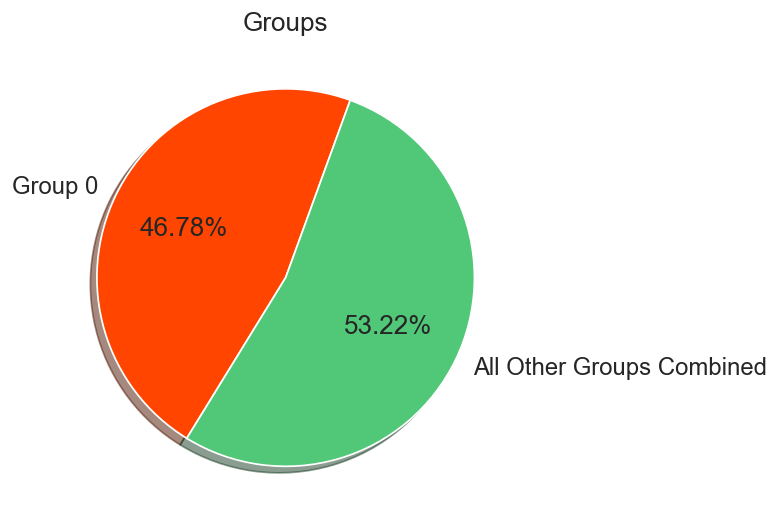

In [ ]:
sns.set(font_scale=1.25)  # scale up font size

plt.figure(figsize=(5, 5), dpi=125)
group_0 = len(temp[temp['group'] == 'Group 0'])
others = len(temp[temp['group'] == 'Other'])

plt.pie(x=[group_0, others],
        explode=(0, 0),
        labels=['Group 0', 'All Other Groups Combined'],
        autopct='%1.2f%%',
        shadow=True,
        startangle=70,
        colors=[config['red_rgb'], config['green_rgb']])

fig = plt.gcf()
fig.set_size_inches(5, 5)
plt.title('Groups')
plt.show()

* This is a multi-class classification problem, where the machine learning model will try to predict if each row is one of the 74 possibilities.
* The majority class is GRP_0, which occurs in 46.78% of the observations.

* The most common metrics for a multi-class classification problem are AUC, F1-score and accuracy.
* Accuracy is not suitable for an imbalanced classification problem. (Note that a model that always predicts GRP_0, will get an accuracy of 46.78%)
* We would choose F1-score if the majority class is more important than the smaller classes.
* We would choose AUC if we also care about the smaller classes.

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Outlier Analysis</span></strong></li>
</ul></h3>

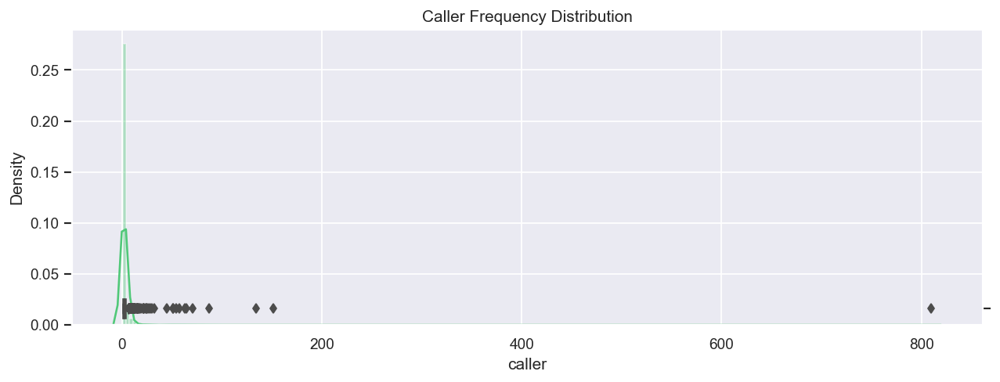

In [ ]:
# plotting caller frequency counts
sns.set()
plt.figure(figsize=(12, 4), dpi=125)
ax = sns.distplot(dataset.caller.value_counts(), bins=250, kde=True, color=config['green_rgb'])
ax_ = ax.twinx()
sns.boxplot(dataset.caller.value_counts(), color=config['red_rgb'])
ax_.set(ylim=(-.7, 12))
plt.title('Caller Frequency Distribution')
plt.show()

In [ ]:
dataset[dataset.caller == 'bpctwhsn kzqsbmtp'].group.value_counts()  # most frequent caller

GRP_8     362
GRP_9     153
GRP_5      96
GRP_6      89
GRP_10     60
GRP_60     16
GRP_12      8
GRP_45      7
GRP_1       6
GRP_13      4
GRP_18      3
GRP_47      2
GRP_57      1
GRP_44      1
GRP_14      1
GRP_29      1
Name: group, dtype: int64

In [ ]:
dataset[dataset.caller == 'bpctwhsn kzqsbmtp']  # job failure alerts

,short_description,description,caller,group
47,job Job_1424 failed in job_scheduler at: 10/31...,received from: monitoring_tool@company.com_x00...,bpctwhsn kzqsbmtp,GRP_6
50,job mm_zscr0099_dly_merktc3 failed in job_sche...,received from: monitoring_tool@company.com_x00...,bpctwhsn kzqsbmtp,GRP_8
59,job mm_zscr0099_dly_merktc2 failed in job_sche...,received from: monitoring_tool@company.com_x00...,bpctwhsn kzqsbmtp,GRP_8
60,job Job_3181 failed in job_scheduler at: 10/31...,received from: monitoring_tool@company.com_x00...,bpctwhsn kzqsbmtp,GRP_8
67,job Job_1338 failed in job_scheduler at: 10/31...,received from: monitoring_tool@company.com_x00...,bpctwhsn kzqsbmtp,GRP_9
...,...,...,...,...
7053,job Job_1387 failed in job_scheduler at: 08/18...,received from: monitoring_tool@company.com_x00...,bpctwhsn kzqsbmtp,GRP_9
7059,job Job_2063b failed in job_scheduler at: 08/1...,received from: monitoring_tool@company.com_x00...,bpctwhsn kzqsbmtp,GRP_6
7074,job HostName_1019fail failed in job_scheduler ...,received from: monitoring_tool@company.com_x00...,bpctwhsn kzqsbmtp,GRP_8
7076,job HostName_1019fail failed in job_scheduler ...,received from: monitoring_tool@company.com_x00...,bpctwhsn kzqsbmtp,GRP_8


In [ ]:
def get_length(row):
    try:
        row['char_length'] = len(row.description)
        row['word_length'] = len(row.description.split())
        row['short_char_length'] = len(row.short_description)
        row['short_word_length'] = len(row.short_description.split())
    except Exception:  # assign 0 length to missing rows if any
        row['char_length'] = 0
        row['word_length'] = 0
        row['short_char_length'] = 0
        row['short_word_length'] = 0
    return row

dataset = dataset.progress_apply(get_length, axis=1)

100%|██████████| 8500/8500 [00:20<00:00, 424.08it/s]


In [ ]:
dataset.sample(7)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
5380,unable to connect to web,"unable to connect to web ,and check download f...",bearzclk xnvqipcz,GRP_0,51,9,25,5
8315,abended job in job_scheduler: bkwin_HostName_7...,received from: monitoring_tool@company.com_x00...,ZkBogxib QsEJzdZO,GRP_8,132,12,52,5
4596,computer can't started,computer can't started,zyblacuk mvjqwgzn,GRP_31,23,3,23,3
6866,job Job_511 failed in job_scheduler at: 08/21/...,received from: monitoring_tool@company.com_x00...,bpctwhsn kzqsbmtp,GRP_8,117,12,61,8
2732,ir posting error_urgently,_x000D_\n_x000D_\nreceived from: tkjypfze.jxom...,ihfkwzjd erbxoyqk,GRP_10,156,19,25,3
6915,an intern has moved from the markhtyeting grou...,name:callie pollaurid\nlanguage:\nbrowser:micr...,xzupryaf vlbikhsm,GRP_0,288,37,60,10
7962,abended job in job_scheduler: SID_37hoti,received from: monitoring_tool@company.com_x00...,ZkBogxib QsEJzdZO,GRP_8,120,12,40,5


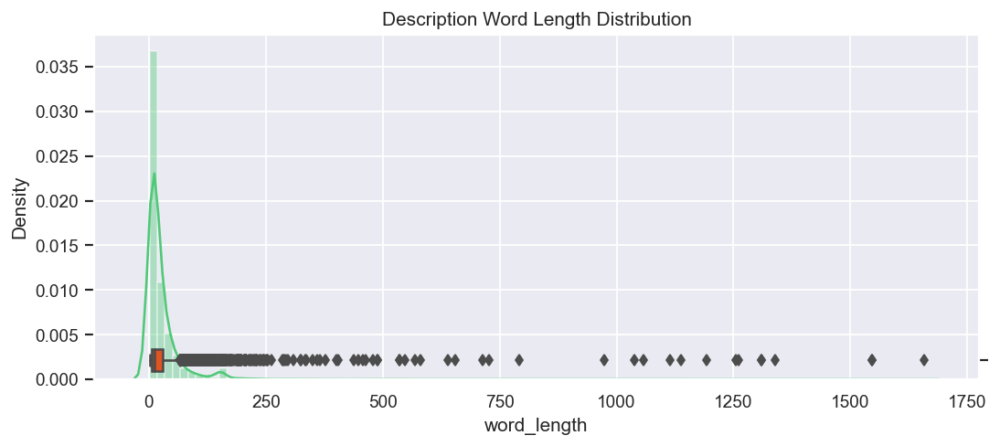

In [ ]:
sns.set()
plt.figure(figsize=(10, 4), dpi=125)
ax = sns.distplot(dataset.word_length, bins=100, kde=True, color=config['green_rgb'])
ax_ = ax.twinx()
sns.boxplot(dataset.word_length, color=config['red_rgb'])
ax_.set(ylim=(-.7, 12))
plt.title('Description Word Length Distribution')
plt.show()

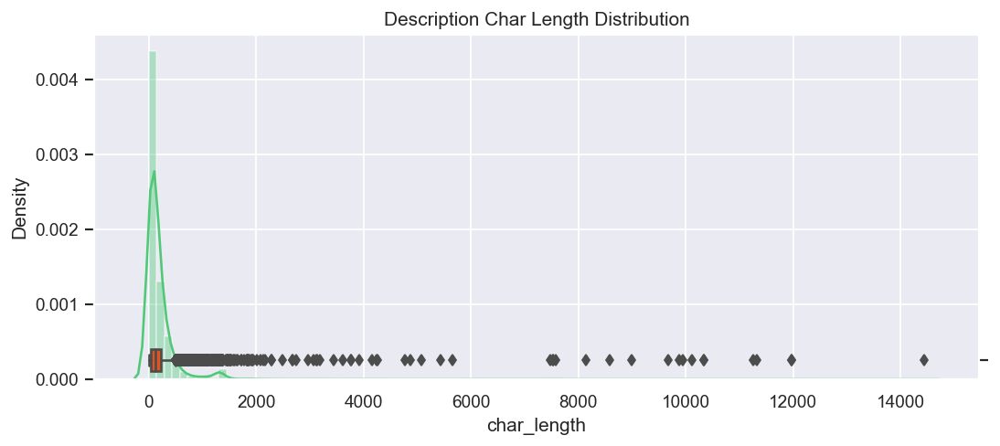

In [ ]:
sns.set()
plt.figure(figsize=(10, 4), dpi=125)
ax = sns.distplot(dataset.char_length, bins=100, kde=True, color=config['green_rgb'])
ax_ = ax.twinx()
sns.boxplot(dataset.char_length, color=config['red_rgb'])
ax_.set(ylim=(-.7, 12))
plt.title('Description Char Length Distribution')
plt.show()

In [ ]:
dataset[dataset.word_length == 0]  # empty description => imputing with the corresponding short_description

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length


In [ ]:
dataset.loc[dataset.word_length == 0, 'description'] = dataset.loc[dataset.word_length == 0]['short_description']
dataset = dataset.progress_apply(get_length, axis=1)

100%|██████████| 8500/8500 [00:01<00:00, 6596.83it/s]


In [ ]:
dataset[dataset.word_length == 0]  # cleaned

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length


In [ ]:
dataset[dataset.char_length < 4]  # description 'the' holds no information => imputed with short_description

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
1049,reset passwords for soldfnbq uhnbsvqd using pa...,the,soldfnbq uhnbsvqd,GRP_17,3,1,84,9
1054,reset passwords for fygrwuna gomcekzi using pa...,the,fygrwuna gomcekzi,GRP_17,3,1,84,9
1144,reset passwords for wvdxnkhf jirecvta using pa...,the,wvdxnkhf jirecvta,GRP_17,3,1,84,9
1184,reset passwords for pxvjczdt kizsjfpq using pa...,the,pxvjczdt kizsjfpq,GRP_17,3,1,84,9
1292,reset passwords for cubdsrml znewqgop using pa...,the,cubdsrml znewqgop,GRP_17,3,1,84,9
1476,reset passwords for bnoupaki cpeioxdz using pa...,the,bnoupaki cpeioxdz,GRP_17,3,1,84,9
1558,reset passwords for usa feathers using passwor...,the,lmqysdec ljvbnpqw,GRP_17,3,1,79,9
1693,reset passwords for eglavnhx uprodleq using pa...,the,eglavnhx uprodleq,GRP_17,3,1,84,9
1834,reset passwords for hybiaxlk lawptzir using pa...,the,hybiaxlk lawptzir,GRP_17,3,1,84,9
1850,reset passwords for fylrosuk kedgmiul using pa...,the,fylrosuk kedgmiul,GRP_17,3,1,84,9


In [ ]:
dataset[dataset.description == 's']  # holds no actual information with just one letter, has to be dropped

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
1860,s,s,gzjtweph mnslwfqv,GRP_0,1,1,1,1


In [ ]:
# drop row with description: 's'
dataset.drop(dataset[dataset.description == 's'].index, inplace=True)
dataset = dataset.progress_apply(get_length, axis=1)

100%|██████████| 8499/8499 [00:01<00:00, 7720.37it/s]


In [ ]:
# description 'the' holds no information => imputed with corresponding short_description
dataset.loc[dataset.description == 'the', 'description'] = dataset.loc[dataset.description == 'the']['short_description']
dataset = dataset.progress_apply(get_length, axis=1)

100%|██████████| 8499/8499 [00:01<00:00, 6884.99it/s]


In [ ]:
# Single Word descriptions
dataset[dataset.word_length == 1].shape

(41, 8)

In [ ]:
dataset[dataset.word_length == 1].sample(20)  # these have to be cleaned up and imputed later on

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
1954,ç¬”è®°æœ¬é‡æ–°è£…ä¸‹ç³»ç»Ÿ,æŠŠæˆ‘çš„ç¬”è®°æœ¬é‡æ–°è£…ä¸‹ç³»ç»Ÿ,xjvubmlq vyamhjip,GRP_30,36,1,27,1
5146,walkmeåŠ è½½æ•…éšœ,walkmeä¸‹è½½å®‰è£…åŽï¼ŒæŒ‰é’®ä¸èƒ½åœ¨æµè§ˆå...,whflryeb fatgdzhq,GRP_48,60,1,18,2
4503,ç”¨å‹å®šæœŸå¤‡ä»½ä¸æˆåŠŸ,æœåŠ¡å™¨ç«¯ç”¨å‹ç³»ç»Ÿæœ€è¿‘åŠä¸ªæœˆæ—¥å¤‡ä...,igdnsjhz awnftgev,GRP_48,54,1,27,1
415,reset passwords for prgewfly ndtfvple using pa...,complete,prgewfly ndtfvple,GRP_17,8,1,84,9
7302,skypeä¼šè®®æ—¶ä¸åŽ»,skypeä¼šè®®ä»Žé‚®ç®±é‡Œçš„é“¾æŽ¥è¿›ä¸åŽ»ã€‚,rekpvblc ufysatml,GRP_30,44,1,20,1
4501,åˆ¶ç²‰ä¸‰æ¥¼æŽ§åˆ¶å®¤ç”µè„‘æ•…éšœ,åˆ¶ç²‰ä¸‰æ¥¼æŽ§åˆ¶å®¤ç”µè„‘ä¸èƒ½å¼€å¯ï¼Œç”µæ...,agyvbnwz mxsonkdc,GRP_48,72,1,33,1
6253,in the inbox always show there are several ema...,+86,mqbxwpfn uclrqfxa,GRP_0,5,1,94,19
416,reset the password for prgewfly ndtfvple on er...,completed,prgewfly ndtfvple,GRP_0,9,1,67,12
8266,erpæ— æ³•è¿›è¡Œé‡‡è´­ï¼ˆè½¬ç»™è´ºæ­£å¹³ï¼‰,"è¿›è¡Œé‡‡è´­æ—¶æ˜¾ç¤º""æ‰¾ä¸åˆ°å‘˜å·¥111115483...",kyagjxdh dmtjpbnz,GRP_30,84,1,42,2
5761,ä¸»æœºä¸èƒ½å¼€å¯,ä¸»æœºä¸èƒ½å¼€å¯ï¼Œç”µæºç¯æ­£å¸¸ï¼Œä¸»æœºé...,cpdilmjx jwsqpiac,GRP_48,71,1,18,1


In [ ]:
dataset[dataset.word_length == 2].sample(20)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
2683,ticket update,ticket update,pbhmwqtz wqlbudjx,GRP_0,14,2,14,2
393,password reset,password reset,pwvtoemq ugnxwfoe,GRP_0,15,2,15,2
7378,password reset,password reset,kauozcir jlyqxise,GRP_0,14,2,14,2
420,password reset,password reset,lrbjqcmh jbiwtzqr,GRP_0,14,2,14,2
4487,vpn è¿žæŽ¥åŽè‡ªåŠ¨æ–­å¼€ã€‚,vpn è¿žæŽ¥åŽè‡ªåŠ¨æ–­å¼€ï¼Œæç¤ºè°ƒåˆ¶è§£è°ƒ...,tmufgokq qtzavows,GRP_31,61,2,28,2
8396,formatar micro,formatar micro,zuyimtsf qjtimdsp,GRP_62,14,2,14,2
2980,hp2çƒ­åŽ‹ç‚‰æ•°æ®ä¼ è¾“å¡ï¼Œæ•°æ®æ›´æ–°ä¸å...,hp2çƒ­åŽ‹ç‚‰æ•°æ®ä¼ è¾“å¡ï¼Œæ•°æ®æ›´æ–°ä¸å...,basqoyjx frvwhbse,GRP_30,75,2,75,2
6366,email queries,email queries,zfliqpxm dgfvaqlh,GRP_0,13,2,13,2
4332,vpn doesnt check for antivirus or company doma...,refer screenshot,akisjtzm uvbmysgc,GRP_2,16,2,86,13
4042,vpn ä¸èƒ½è¿žæŽ¥,vpn ä¸èƒ½è¿žæŽ¥,fcvqezmn frzyjknu,GRP_31,16,2,16,2


In [ ]:
dataset[dataset.short_word_length == 0]  # all have short descriptions

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length


In [ ]:
dataset[dataset.short_char_length < 3]

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
3529,PR,create a purchase requisition with purchasing ...,ejvkzobl yijgokrn,GRP_29,219,33,2,1


In [ ]:
dataset[dataset.char_length < 4]  

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
3432,dds,dss,onctqhsg cpahzsle,GRP_0,3,1,3,1


In [ ]:
dataset[dataset.word_length > 800]  # security incident logs

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
3530,security incidents - ( #in33944691 ) : possibl...,source ip: 195.272.28.222\nsource port: 80\nso...,gzhapcld fdigznbk,GRP_2,7524,974,111,17
3965,security incidents - ( #in33809307 ) : possibl...,source ip :195.22.28.222 \nsystem name :androi...,gzhapcld fdigznbk,GRP_2,8988,1255,116,17
4087,security incidents - ( sw #in33895560 ) : mage...,"source ip : 172.20.10.37 , 208.211.136.158\nsy...",ugyothfz ugrmkdhx,GRP_39,11968,1547,63,11
4089,security incidents - ( sw #in33895560 ) : mage...,"source ip : 172.20.10.37 , 208.211.136.158\nsy...",ugyothfz ugrmkdhx,GRP_2,11968,1547,63,11
5092,security incidents - ( #in33578632) : suspicio...,source ip: 29.26.13.3095_x000D_\nsource hostna...,gzhapcld fdigznbk,GRP_3,10119,1115,92,11
5433,security incidents - ( #in33765965 ) : possibl...,source ip :10.40.6.221\nsystem name :rqxl85172...,gzhapcld fdigznbk,GRP_2,8575,1057,83,13
7345,security incidents - ( sw #in33501789 ) : broa...,we are seeing activity indicating the host at ...,ugyothfz ugrmkdhx,GRP_2,14441,1657,102,14
7647,security incidents - ( #in33578632) : suspicio...,source ip :_x000D_\nsystem name :_x000D_\nuser...,gzhapcld fdigznbk,GRP_2,9945,1038,92,11
7982,security incidents - ( dsw #in33390850 ) : sus...,source ip : 78.83.16.293\nsystem name : HostNa...,ugyothfz ugrmkdhx,GRP_2,9881,1137,118,17
7984,security incidents - ( dsw #in33390850 ) : sus...,source ip : 78.83.16.293_x000D_\nsystem name :...,ugyothfz ugrmkdhx,GRP_12,11253,1193,118,17


In [ ]:
dataset[dataset.word_length > 200][dataset.word_length < 800]

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
162,access to bex,_x000D_\n_x000D_\nreceived from: yfqoaepn.xnez...,yfqoaepn xnezhsit,GRP_0,1587,207,13,3
238,erp pi and msd crm connectivity issue- serirtc...,hi all\n\nwe have a connectivity issue between...,kgytujhe bonhwzrx,GRP_14,2007,349,67,10
239,printer problem / issue information,please complete all required questions below. ...,dzjxrkae grqczsmx,GRP_3,1294,216,35,5
981,employment status - new non-employee ycgkinov ...,*page down to ensure that all required data fi...,lfikjasz tjbqcmvl,GRP_2,1324,206,75,11
1175,bitte das iphone-6 001 freischalten fÃ¼r mail-...,\n\nreceived from: rtnyumbg.yzemkhbq@gmail.com...,rtnyumbg yzemkhbq,GRP_0,1828,218,54,7
...,...,...,...,...,...,...,...,...
7991,as per inc1530161::security incidents - ( in33...,_x000D_\nfrom: gzhapcld fdigznbk _x000D_\nsent...,gzhapcld fdigznbk,GRP_2,5651,581,115,14
7996,security incidents - ( in33490582 ) : suspicio...,source ip : 29.26.13.3095_x000D_\nsystem name ...,gzhapcld fdigznbk,GRP_12,8147,791,96,12
8160,release of device,_x000D_\n_x000D_\nreceived from: qpixeudn.rjlz...,qpixeudn rjlziysd,GRP_0,3445,447,17,3
8232,stepfhryhan needs access to below collaboratio...,stepfhryhan needs access to below collaboratio...,nizholae bjnqikym,GRP_0,3116,286,64,7


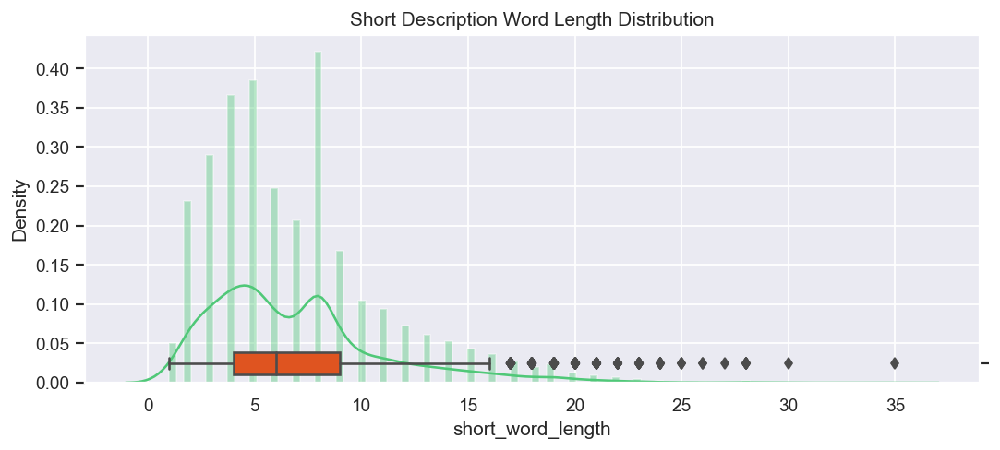

In [ ]:
sns.set()
plt.figure(figsize=(10, 4), dpi=125)
ax = sns.distplot(dataset.short_word_length, bins=100, kde=True, color=config['green_rgb'])
ax_ = ax.twinx()
sns.boxplot(dataset.short_word_length, color=config['red_rgb'])
ax_.set(ylim=(-.7, 12))
plt.title('Short Description Word Length Distribution')
plt.show()

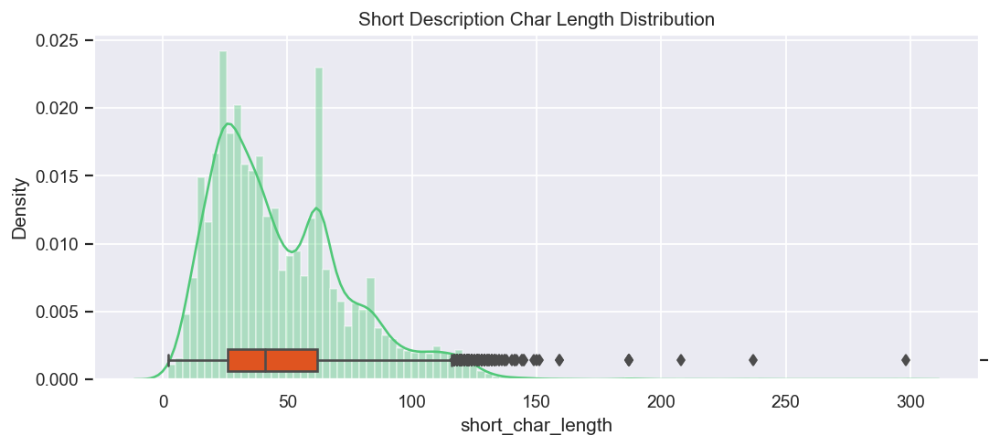

In [ ]:
sns.set()
plt.figure(figsize=(10, 4), dpi=125)
ax = sns.distplot(dataset.short_char_length, bins=100, kde=True, color=config['green_rgb'])
ax_ = ax.twinx()
sns.boxplot(dataset.short_char_length, color=config['red_rgb'])
ax_.set(ylim=(-.7, 12))
plt.title('Short Description Char Length Distribution')
plt.show()

In [ ]:
dataset.describe()

,char_length,word_length,short_char_length,short_word_length
count,8499.000000,8499.000000,8499.00000,8499.000000
mean,220.695494,28.786681,47.41499,6.953877
std,555.128258,66.992031,27.47360,4.167192
min,3.000000,1.000000,2.00000,1.000000
25%,42.000000,6.000000,26.00000,4.000000
50%,118.000000,12.000000,41.00000,6.000000
75%,224.000000,30.000000,62.00000,9.000000
max,14441.000000,1657.000000,298.00000,35.000000


In [ ]:
def clean_nonsensible_outliers():
    # impute the zero length description with corresponding short description
    dataset.loc[dataset.word_length == 0, 'description'] = dataset.loc[dataset.word_length == 0]['short_description']
     # drop row with description: 's'
    dataset.drop(dataset[dataset.description == 's'].index, inplace=True)
    # description 'the' holds no information => imputed with corresponding short_description
    dataset.loc[dataset.description == 'the', 'description'] = dataset.loc[dataset.description == 'the']['short_description']

# clean_nonsensible_outliers()

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Fix Text Encoding</span></strong></li>
</ul></h3>

In [ ]:
dataset[dataset.word_length == 1].sample(20)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
3315,ç”µè„‘ç³»ç»Ÿå¯åŠ¨è“å±ã€‚,ç”µè„‘ç³»ç»Ÿå¯åŠ¨è“å±ã€‚æ°´ä¸å°å¿ƒæ´’åˆ°ç...,hdungfsc znuhyjkx,GRP_31,60,1,27,1
5149,å¼€ä¸äº†æœº,å¼€ä¸äº†æœºï¼Œæ˜¾ç¤ºç³»ç»Ÿåäº†ã€‚,kclhqspo xvugztyc,GRP_30,36,1,12,1
5303,æŠ¥ç¨Žç”µè„‘ä¸èƒ½è”ç½‘ï¼Œè®©è´ºæ­£å¹³ä¼‘ã€‚,æŠ¥ç¨Žç”µè„‘ä¸èƒ½è”ç½‘ï¼Œè®©è´ºæ­£å¹³ä¼‘ã€‚,hlrmufzx qcdzierm,GRP_30,45,1,45,1
2915,websites not loading on company center,companycenter.company.com,qcfmxgid jvxanwre,GRP_0,25,1,38,6
3432,dds,dss,onctqhsg cpahzsle,GRP_0,3,1,3,1
5491,"é›»è…¦å‡ºç¾è—å±,ç„¡æ³•é–‹æ©Ÿ","é€£vpnæ™‚,ç„¡æ³•é€£ä¸Šå¾Œ,é‡è©¦å¾Œ,çªç„¶å‡ºç...",zhpwcdea cboefuis,GRP_31,67,1,31,1
3120,ç”µè„‘ç¡¬ç›˜æ•…éšœï¼Œè¯·æ±‚ç»´ä¿®ã€‚,ç”µè„‘ç¡¬ç›˜æ•…éšœï¼Œè¯·æ±‚ç»´ä¿®ã€‚,ruhbyzpv vlksnjti,GRP_30,36,1,36,1
5761,ä¸»æœºä¸èƒ½å¼€å¯,ä¸»æœºä¸èƒ½å¼€å¯ï¼Œç”µæºç¯æ­£å¸¸ï¼Œä¸»æœºé...,cpdilmjx jwsqpiac,GRP_48,71,1,18,1
5833,new cpp id can not request initiative. see im...,cphlme01_x000D_\n,pfzxecbo ptygkvzl,GRP_21,16,1,58,10
8266,erpæ— æ³•è¿›è¡Œé‡‡è´­ï¼ˆè½¬ç»™è´ºæ­£å¹³ï¼‰,"è¿›è¡Œé‡‡è´­æ—¶æ˜¾ç¤º""æ‰¾ä¸åˆ°å‘˜å·¥111115483...",kyagjxdh dmtjpbnz,GRP_30,84,1,42,2


In [ ]:
def fix_text_encoding(row):
    row['description'] = fix_text(row.description)
    row['short_description'] = fix_text(row.short_description)
    return row

dataset = dataset.progress_apply(fix_text_encoding, axis=1)
dataset[dataset.word_length == 1].sample(20)  # translated to proper unicode text in chineese

100%|██████████| 8499/8499 [00:02<00:00, 3121.09it/s]


,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length
5491,"電腦出現藍屏,無法開機","連vpn時,無法連上後,重試後,突然出現藍屏,無法開機",zhpwcdea cboefuis,GRP_31,67,1,31,1
3432,dds,dss,onctqhsg cpahzsle,GRP_0,3,1,3,1
4098,"电脑意外进水,帮助处理!请交小贺,谢谢","电脑意外进水,帮助处理!请交小贺,谢谢",pvfclkmn gebyipwr,GRP_30,57,1,57,1
5147,电脑开机故障,"原材料仓库电脑开机蓝屏,主机面板3、4指示灯报警",ycjxrsba ehftdorm,GRP_48,68,1,18,1
1955,有一个链接文件打不开,"有一链接文件打不开,提示版本低",qsfcxzel quwykhno,GRP_30,45,1,30,1
3120,"电脑硬盘故障,请求维修。","电脑硬盘故障,请求维修。",ruhbyzpv vlksnjti,GRP_30,36,1,36,1
5762,打开office 2013显示是未经授权产品,"打开outlook、ppt显示是未经授权产品,望解决。",hbvwqine eakqyovu,GRP_48,59,1,44,2
416,reset the password for prgewfly ndtfvple on er...,completed,prgewfly ndtfvple,GRP_0,9,1,67,12
6106,电脑不能开机,早上上班电脑打不开。,mzerdtop xnlytczj,GRP_30,30,1,18,1
618,outlook打不开,"打开outlook时,显示outlook.ost文件错误,程序自动关闭。",qayozbcd vwglmpjq,GRP_0,72,1,16,1


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Word Frequency Distributions & WordClouds</span></strong></li>
</ul></h3>

In [ ]:
# top 50 most frequent words in text
top_N = config['top_n']

words = (dataset.description.str.cat(sep=' ').split())
rslt = pd.DataFrame(Counter(words).most_common(top_N),
                    columns=['Word', 'Frequency']).set_index('Word')

In [ ]:
rslt[:top_N].transpose()

Word,_x000D_,to,the,in,is,from:,and,received,i,on,...,at,can,we,as,access,when,site,account,am,ticket
Frequency,12371,6294,6253,3172,2670,2499,2384,2354,2244,1976,...,691,684,669,665,658,656,654,625,607,605


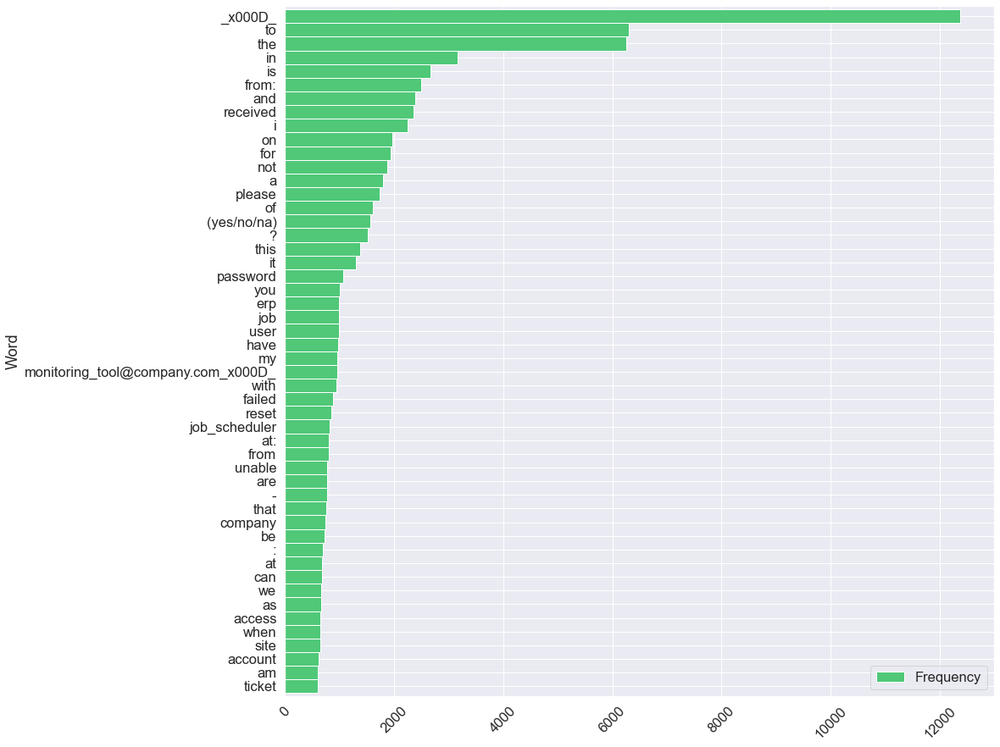

In [ ]:
sns.set(font_scale=1.5)  # scale up font size
rslt.sort_values(by='Frequency', ascending=True).plot(kind='barh', width=1, figsize=(15, 15), color=config['green_rgb'])
plt.xticks(rotation=45)
plt.show()

In [ ]:
pprint(rslt.index.tolist(), compact=True)

['_x000D_', 'to', 'the', 'in', 'is', 'from:', 'and', 'received', 'i', 'on',
 'for', 'not', 'a', 'please', 'of', '(yes/no/na)', '?', 'this', 'it',
 'password', 'you', 'erp', 'job', 'user', 'have', 'my',
 'monitoring_tool@company.com_x000D_', 'with', 'failed', 'reset',
 'job_scheduler', 'at:', 'from', 'unable', 'are', '-', 'that', 'company', 'be',
 ':', 'at', 'can', 'we', 'as', 'access', 'when', 'site', 'account', 'am',
 'ticket']


<h5><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Stopwords and Anchor words like 'From:', 'Recieved' have to be stripped out
 </span></ul></h5>

In [ ]:
# top 50 most frequent words in text
top_N = config['top_n']

words = (dataset.short_description.str.cat(sep=' ').split())
rslt = pd.DataFrame(Counter(words).most_common(top_N),
                    columns=['Word', 'Frequency']).set_index('Word')

In [ ]:
rslt[:top_N].transpose()

Word,to,in,not,job,on,is,password,erp,failed,job_scheduler,...,with,i,my,crm,ticket,windows,/,am,password_management_tool,network
Frequency,2167,1737,981,976,917,856,847,822,822,811,...,193,191,187,185,182,177,177,168,161,155


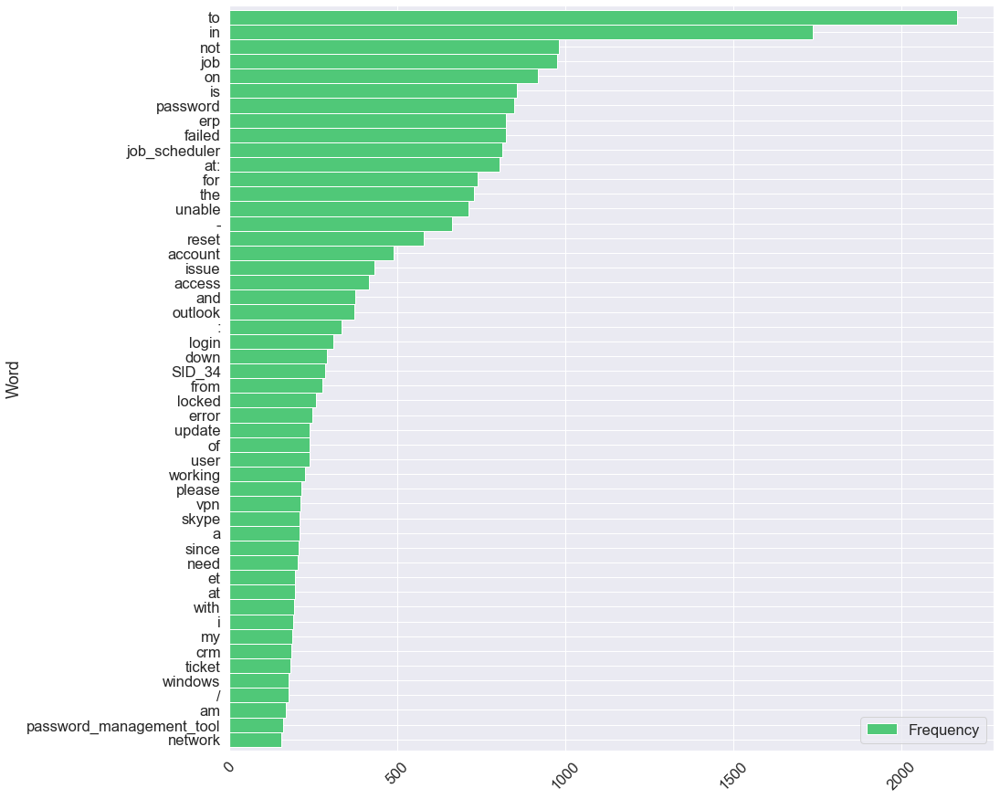

In [ ]:
sns.set(font_scale=1.5)  # scale up font size
rslt.sort_values(by='Frequency', ascending=True).plot(kind='barh', width=1, figsize=(15, 15), color=config['green_rgb'])
plt.xticks(rotation=45)
plt.show()

In [ ]:
pprint(rslt.index.tolist(), compact=True)

['to', 'in', 'not', 'job', 'on', 'is', 'password', 'erp', 'failed',
 'job_scheduler', 'at:', 'for', 'the', 'unable', '-', 'reset', 'account',
 'issue', 'access', 'and', 'outlook', ':', 'login', 'down', 'SID_34', 'from',
 'locked', 'error', 'update', 'of', 'user', 'working', 'please', 'vpn', 'skype',
 'a', 'since', 'need', 'et', 'at', 'with', 'i', 'my', 'crm', 'ticket',
 'windows', '/', 'am', 'password_management_tool', 'network']


<h5><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Many stopwords are occuring most frequently in the dataset. We might need to use stopword removal in our pre-processing if it improves the model performance.
 </span></ul></h5>

In [ ]:
descr_string = ""
for description in dataset['description']:
    descr_string += description
    descr_string += " "

short_descr_string = ""
for description in dataset['short_description']:
    short_descr_string += description
    short_descr_string += " "

grp0_string = ""
for description in temp.loc[temp.group == 'Group 0', 'description']:
    grp0_string += description
    grp0_string += " "

other_string = ""
for description in temp.loc[temp.group == 'Other', 'description']:
    other_string += description
    other_string += " "

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Descriptions WordCloud</span></strong></li>
</ul></h4>

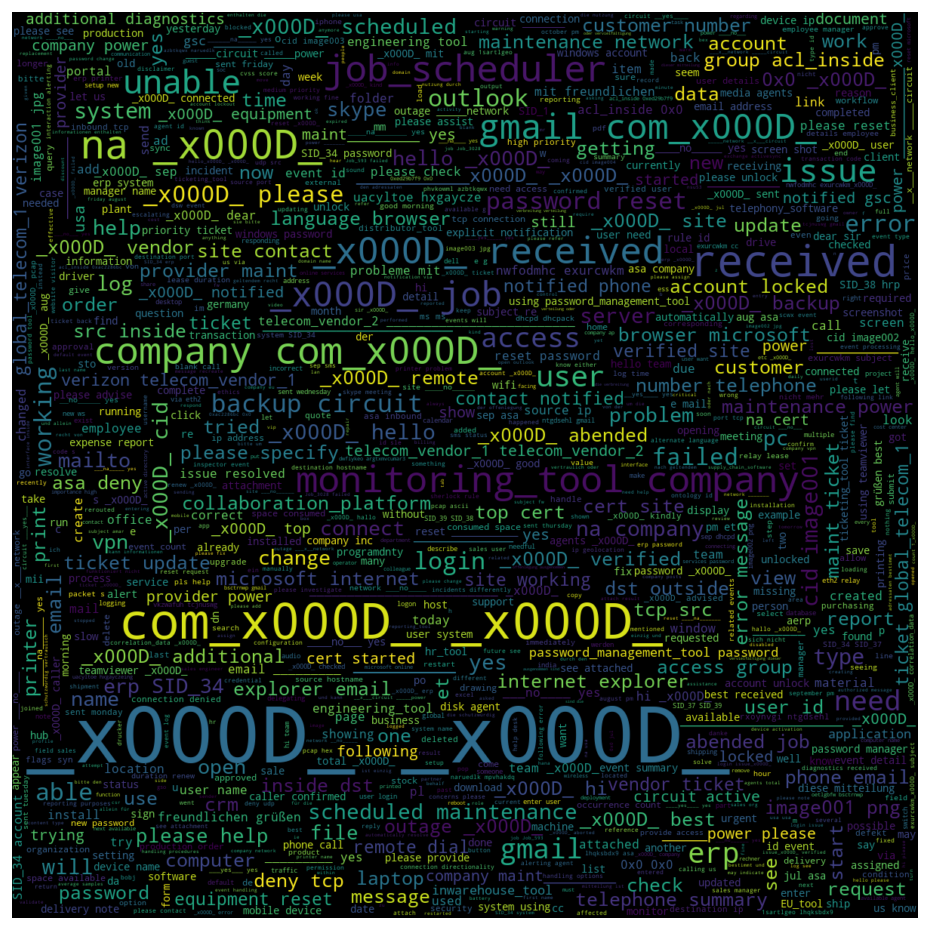

In [ ]:
plt.figure(figsize=(10,10), dpi=120)
WC = WordCloud(width=1200, height=1200, max_words=1000, min_font_size=5)
plt.imshow(WC.generate(descr_string), interpolation='bilinear')
plt.axis("off")
plt.show()

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Short Descriptions WordCloud</span></strong></li>
</ul></h4>

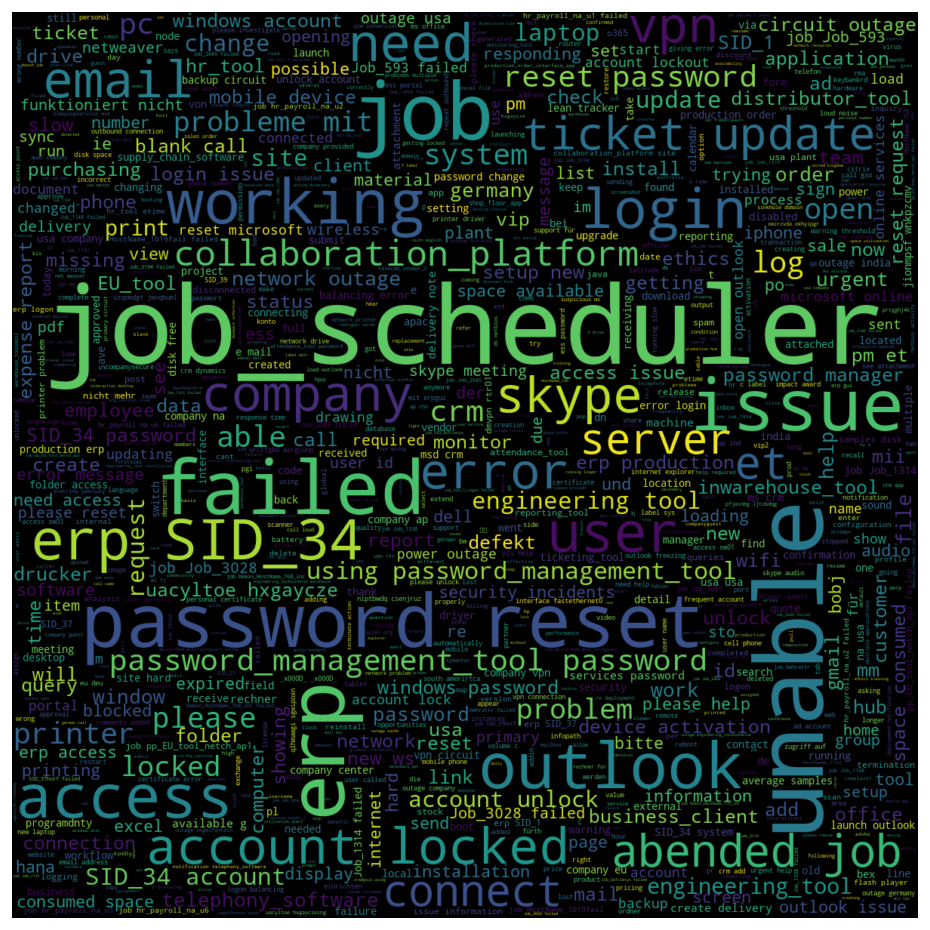

In [ ]:
# Non-Sarcastic descriptions wordcloud
plt.figure(figsize=(10,10), dpi=120)
WC = WordCloud(width=1200, height=1200, max_words=1000, min_font_size=5)
plt.imshow(WC.generate(short_descr_string), interpolation='bilinear')
plt.axis("off")
plt.show()

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Group 0 Descriptions WordCloud</span></strong></li>
</ul></h4>

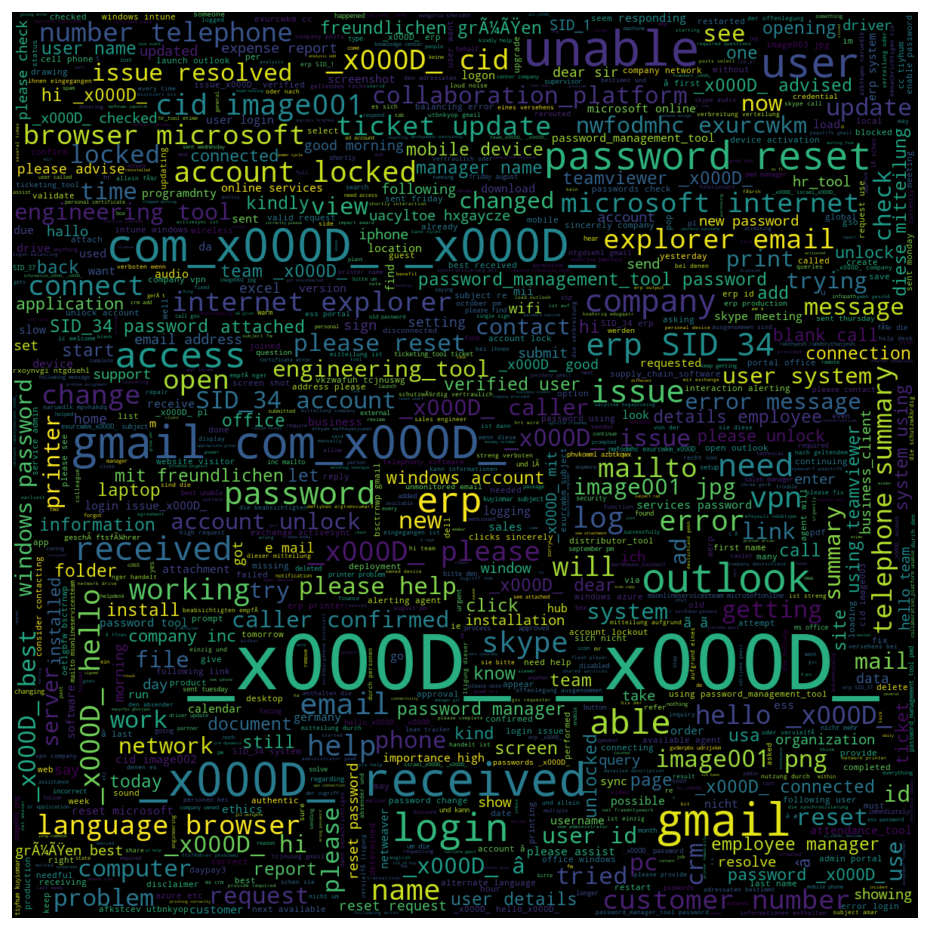

In [ ]:
# Non-Sarcastic descriptions wordcloud
plt.figure(figsize=(10,10), dpi=120)
WC = WordCloud(width=1200, height=1200, max_words=1000, min_font_size=5)
plt.imshow(WC.generate(grp0_string), interpolation='bilinear')
plt.axis("off")
plt.show()

<h4><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Other Groups Descriptions WordCloud</span></strong></li>
</ul></h4>

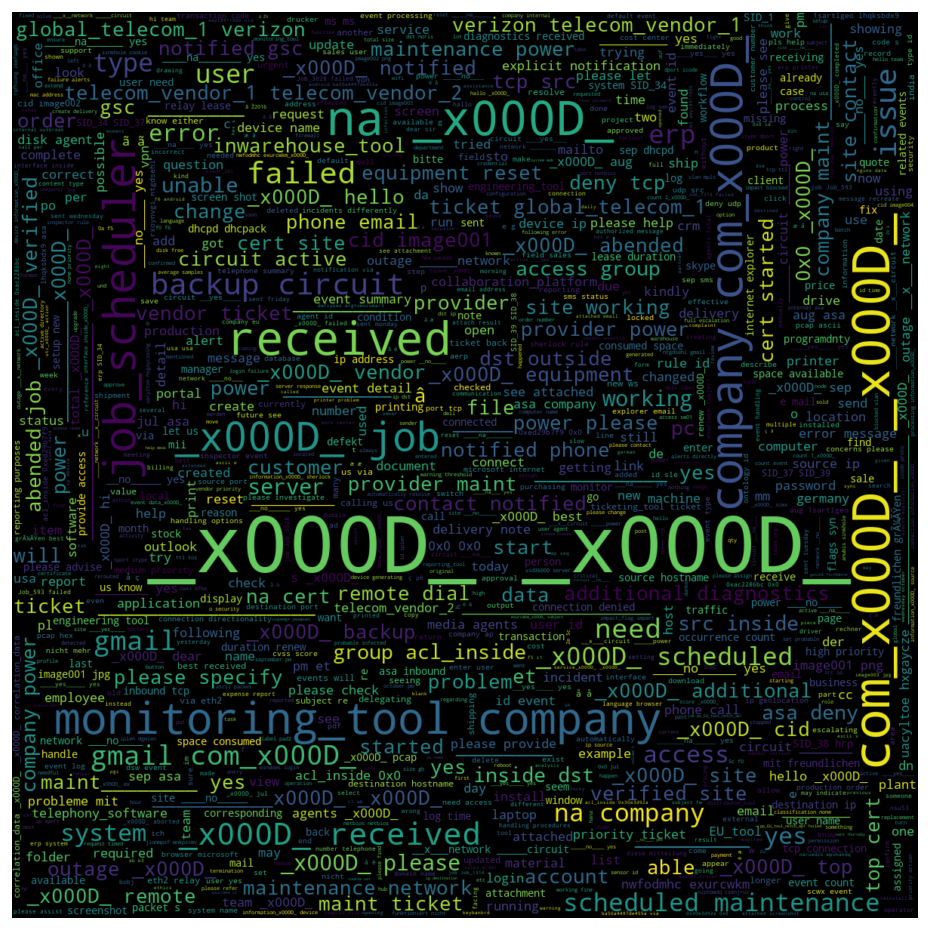

In [ ]:
# Non-Sarcastic descriptions wordcloud
plt.figure(figsize=(10,10), dpi=120)
WC = WordCloud(width=1200, height=1200, max_words=1000, min_font_size=5)
plt.imshow(WC.generate(other_string), interpolation='bilinear')
plt.axis("off")
plt.show()

<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Short Descriptions
 </span></ul></h4>

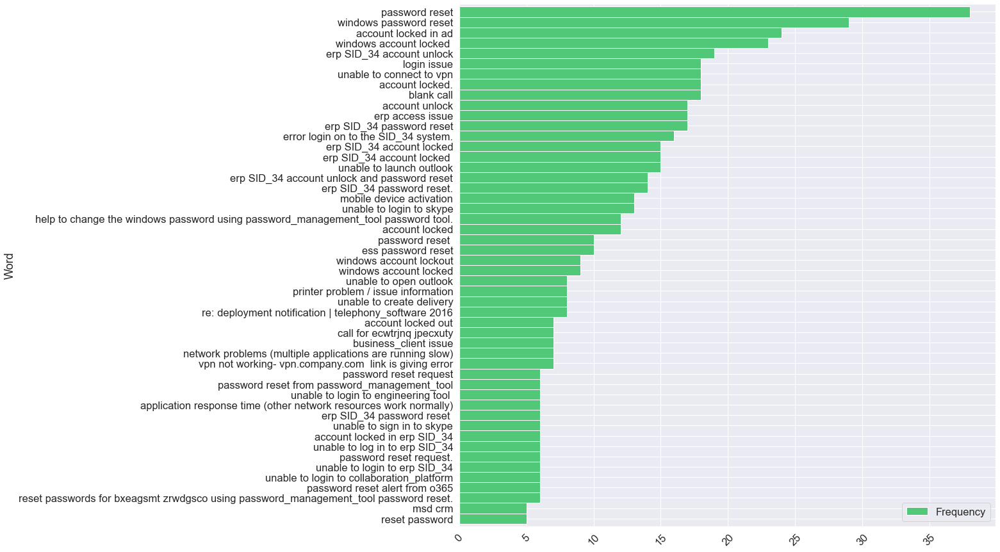

In [ ]:
top_N = config['top_n']
rslt = pd.DataFrame(Counter(dataset.short_description.tolist()).most_common(top_N),
                    columns=['Word', 'Frequency']).set_index('Word')
sns.set(font_scale=1.5)  # scale up font size
rslt.sort_values(by='Frequency', ascending=True).plot(kind='barh', width=1, figsize=(15, 15), color=config['green_rgb'])
plt.xticks(rotation=45)
plt.show()

<h4><ul>
<span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">
    <li>Descriptions
 </span></ul></h4>

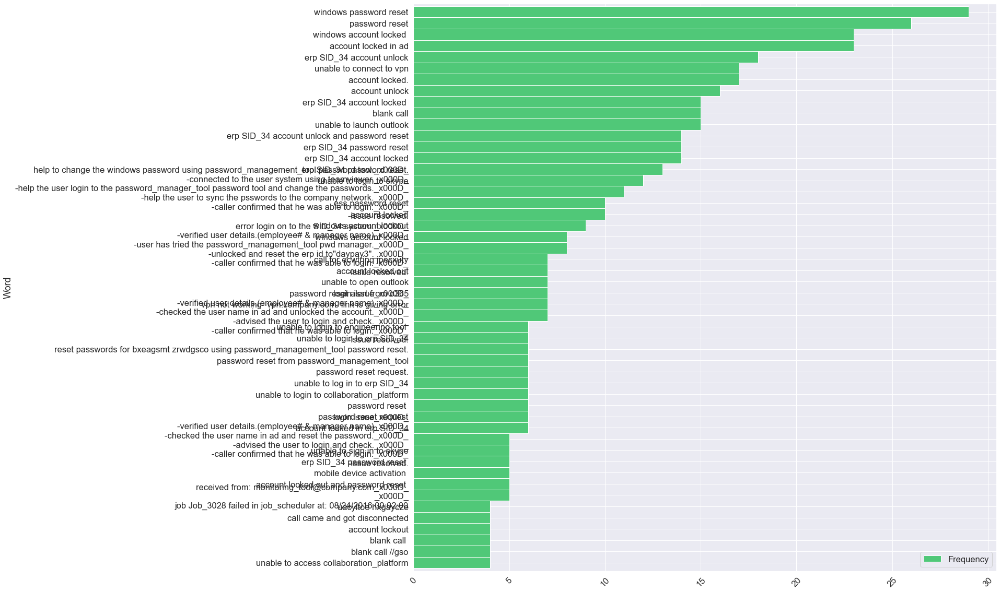

In [ ]:
top_N = config['top_n']
rslt = pd.DataFrame(Counter(dataset.description.tolist()).most_common(top_N),
                    columns=['Word', 'Frequency']).set_index('Word')
sns.set(font_scale=1.5)  # scale up font size
rslt.sort_values(by='Frequency', ascending=True).plot(kind='barh', width=1, figsize=(20, 20), color=config['green_rgb'])
plt.xticks(rotation=45)
plt.show()

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Description Lengths vs. Functional Group</span></strong></li>
</ul></h3>

In [ ]:
le = LabelEncoder()
dataset['group_code'] = le.fit_transform(dataset.group)
dataset.sample(7)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,group_code
6834,vvthuenka,\n\nreceived from: aksthyuhath.shettythruy@com...,badnzyue nxuqmdwl,GRP_0,269,36,9,1,0
8255,abended job in job_scheduler: Job_481,received from: monitoring_tool@company.com_x00...,ZkBogxib QsEJzdZO,GRP_5,117,12,37,5,45
7179,usa - robot (server cabinet) pc lhnw8222138 is...,usa - robot (server cabinet) pc lhnw8222138 is...,dkmcfreg anwmfvlg,GRP_8,77,13,77,13,72
78,"power outage:UK al, 1st and 5th ave sites hard...",what type of outage: _____network _____ci...,mnlazfsr mtqrkhnx,GRP_8,1353,155,82,17,72
454,support für fa.thrydsss-funke \laeusvjo fvaihgpx,support für fa.thrydsss-funke \laeusvjo fvaihgpx,laeusvjo fvaihgpx,GRP_24,49,5,49,5,17
1131,unable to open outlook,unable to open outlook,yiramjqc qtrcepsa,GRP_0,22,4,22,4,0
5347,network outage: turkey turkey - site hard down...,what type of outage: __x___network _____c...,spxqmiry zpwgoqju,GRP_8,1313,152,81,16,72


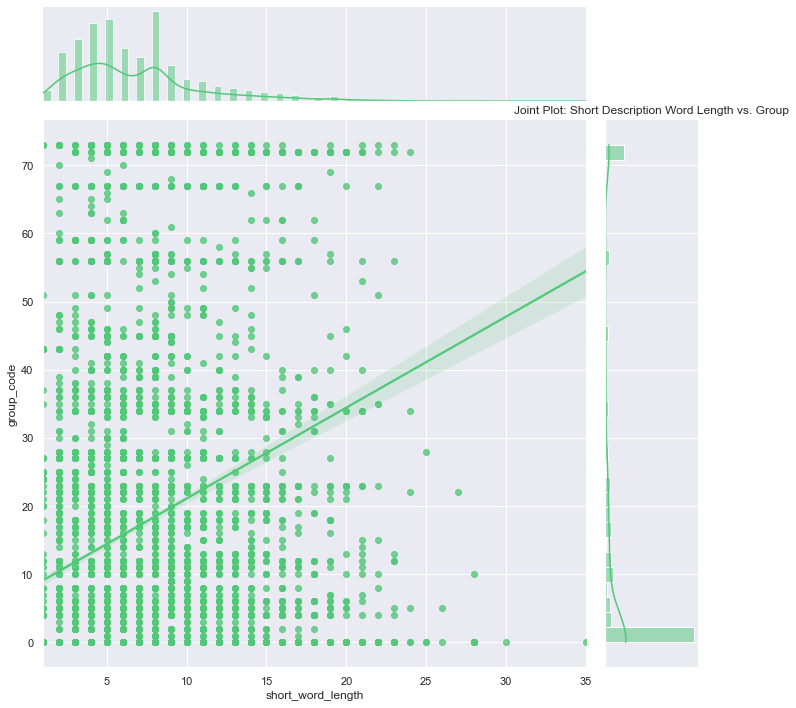

In [ ]:
sns.set()
sns.jointplot(dataset.short_word_length, dataset.group_code, 
              kind='reg', color=config['green_rgb'], height=10)
plt.title('Joint Plot: Short Description Word Length vs. Group')
plt.show()

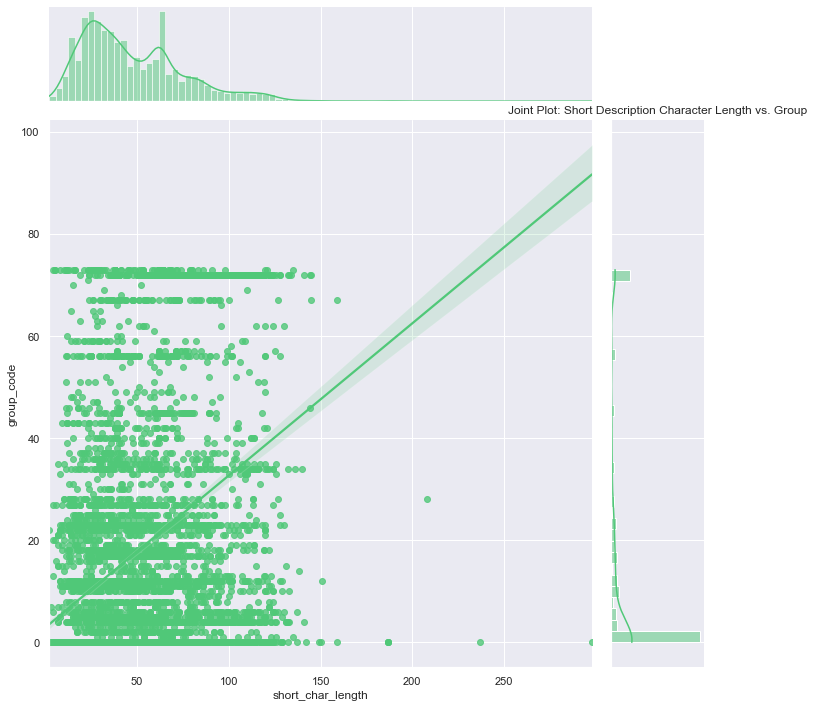

In [ ]:
sns.set()
sns.jointplot(dataset.short_char_length, dataset.group_code, 
              kind='reg', color=config['green_rgb'], height=10)
plt.title('Joint Plot: Short Description Character Length vs. Group')
plt.show()

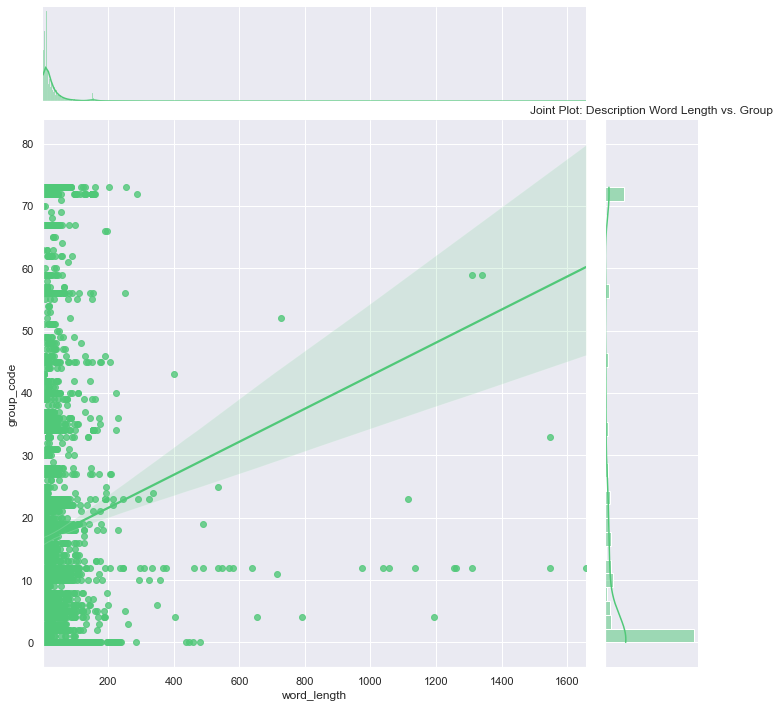

In [ ]:
sns.set()
sns.jointplot(dataset.word_length, dataset.group_code, 
              kind='reg', color=config['green_rgb'], height=10)
plt.title('Joint Plot: Description Word Length vs. Group')
plt.show()

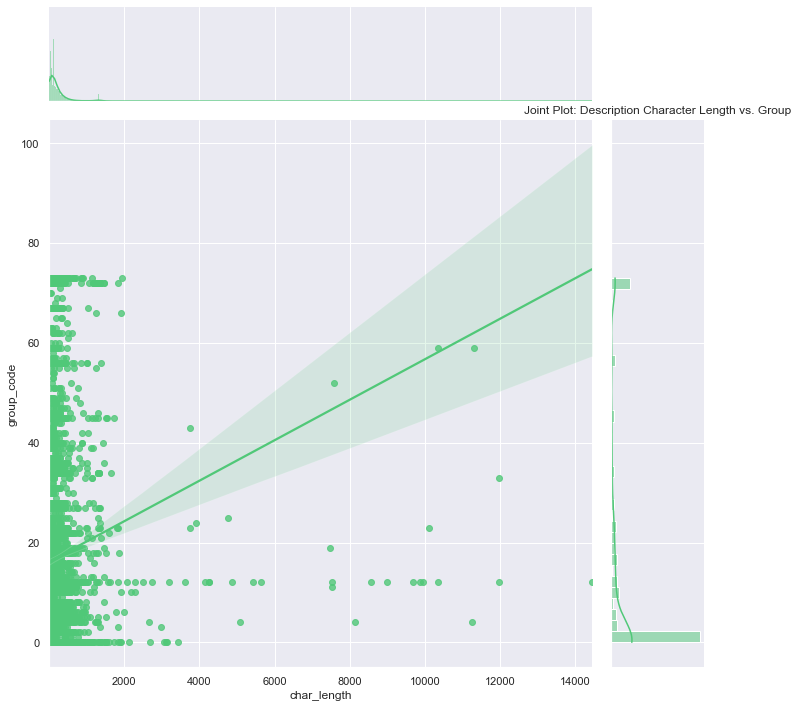

In [ ]:
sns.set()
sns.jointplot(dataset.char_length, dataset.group_code, 
              kind='reg', color=config['green_rgb'], height=10)
plt.title('Joint Plot: Description Character Length vs. Group')
plt.show()

In [ ]:
# binning the lengths

NUM_BINS = 100
breaks = jenkspy.jenks_breaks(dataset['char_length'], nb_class=NUM_BINS)
labels = list(range(len(breaks) - 1))
pprint(breaks, compact=True)

[3.0, 19.0, 27.0, 33.0, 39.0, 46.0, 53.0, 61.0, 69.0, 78.0, 89.0, 101.0, 112.0,
 122.0, 130.0, 139.0, 150.0, 161.0, 172.0, 184.0, 196.0, 209.0, 221.0, 234.0,
 247.0, 259.0, 271.0, 282.0, 294.0, 308.0, 324.0, 340.0, 356.0, 372.0, 391.0,
 411.0, 432.0, 452.0, 471.0, 489.0, 511.0, 539.0, 572.0, 604.0, 630.0, 662.0,
 698.0, 736.0, 774.0, 812.0, 853.0, 902.0, 936.0, 985.0, 1030.0, 1063.0, 1119.0,
 1176.0, 1227.0, 1282.0, 1312.0, 1330.0, 1353.0, 1387.0, 1483.0, 1567.0, 1659.0,
 1780.0, 1877.0, 1952.0, 2079.0, 2172.0, 2293.0, 2494.0, 2744.0, 2972.0, 3116.0,
 3187.0, 3445.0, 3620.0, 3763.0, 3919.0, 4156.0, 4256.0, 4769.0, 4868.0, 5084.0,
 5432.0, 5651.0, 7467.0, 7577.0, 8147.0, 8575.0, 8988.0, 9678.0, 9945.0,
 10119.0, 10340.0, 11316.0, 11968.0, 14441.0]


In [ ]:
dataset['char_length_bins'] = pd.cut(dataset['char_length'] ,bins=breaks, labels=labels, include_lowest=True)

In [ ]:
dataset

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,group_code,char_length_bins
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,230,33,11,2,0,22
1,outlook,_x000D_\n_x000D_\nreceived from: hmjdrvpb.komu...,hmjdrvpb komuaywn,GRP_0,242,30,7,1,0,23
2,cant log in to vpn,_x000D_\n_x000D_\nreceived from: eylqgodm.ybqk...,eylqgodm ybqkwiam,GRP_0,135,16,18,5,0,14
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,29,5,29,5,0,2
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,12,2,12,2,0,0
...,...,...,...,...,...,...,...,...,...,...
8495,emails not coming in from zz mail,_x000D_\n_x000D_\nreceived from: avglmrts.vhqm...,avglmrts vhqmtiua,GRP_29,189,23,33,7,22,19
8496,telephony_software issue,telephony_software issue,rbozivdq gmlhrtvp,GRP_0,24,2,24,2,0,1
8497,vip2: windows password reset for tifpdchb pedx...,vip2: windows password reset for tifpdchb pedx...,oybwdsgx oxyhwrfz,GRP_0,50,7,50,7,0,5
8498,machine não está funcionando,i am unable to access the machine utilities to...,ufawcgob aowhxjky,GRP_62,109,17,30,4,59,11


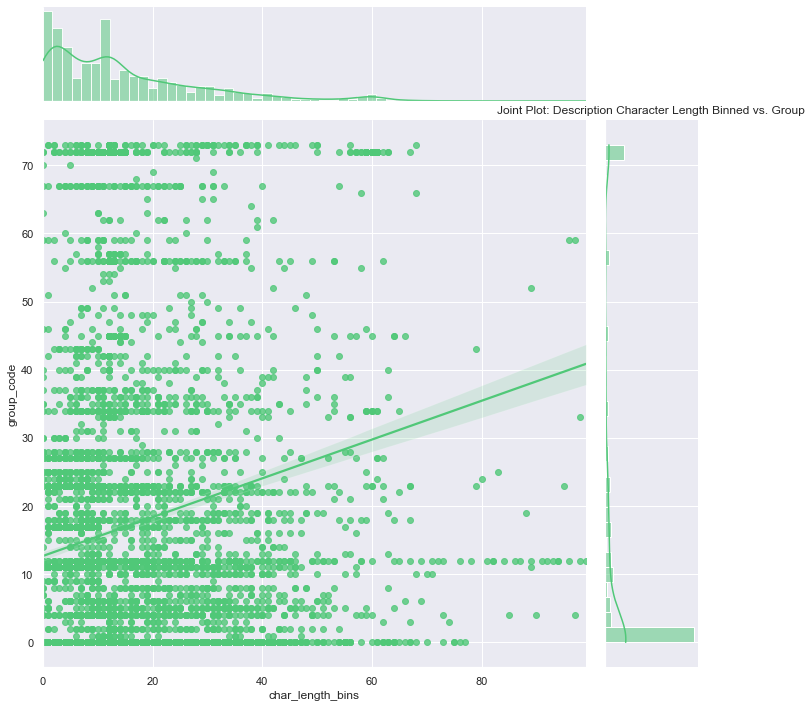

In [ ]:
sns.set()
sns.jointplot(dataset.char_length_bins.astype(int), dataset.group_code, 
              kind='reg', color=config['green_rgb'], height=10)
plt.title('Joint Plot: Description Character Length Binned vs. Group')
plt.show()

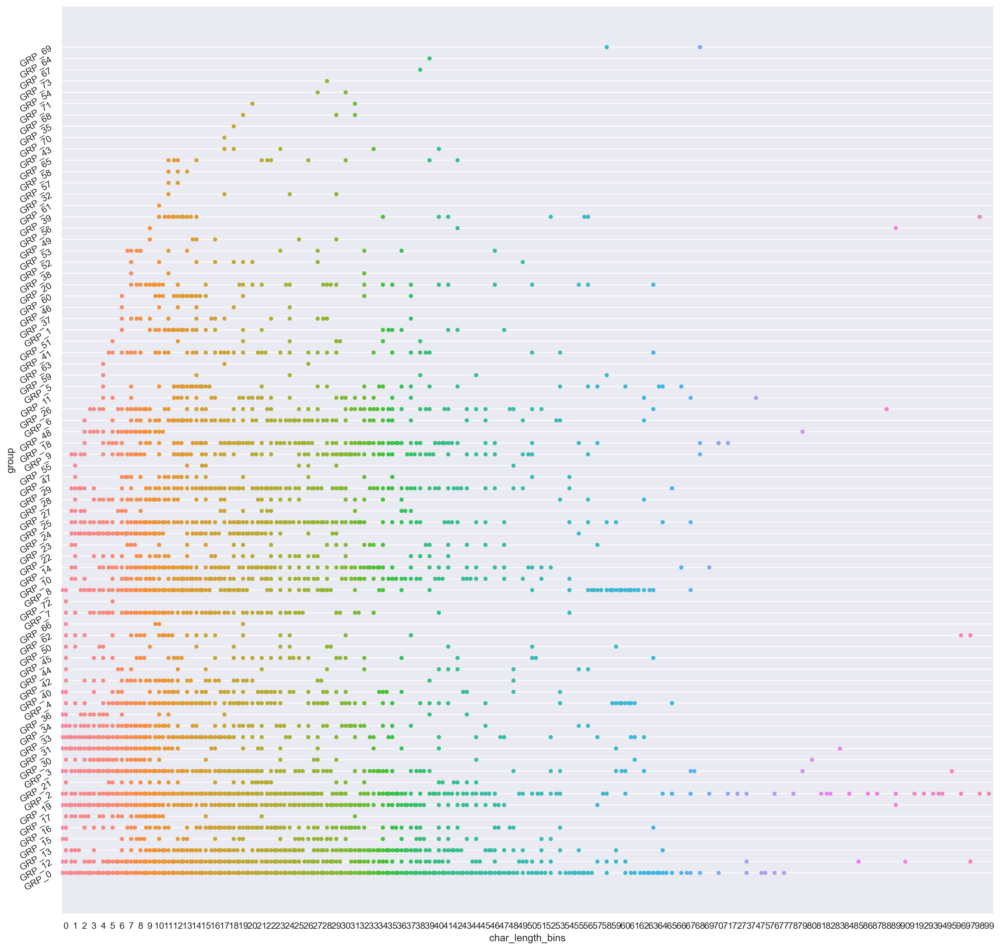

In [ ]:
sns.set()
plt.figure(figsize=(20,20), dpi=300)
sns.swarmplot(x="char_length_bins", y="group", data=dataset)
plt.yticks(rotation=30)
plt.show()

In [ ]:
data_crosstab = pd.crosstab(dataset['caller'],
                            dataset['group'],
                            margins=True,
                            margins_name="Total")
data_crosstab

group,GRP_0,GRP_1,GRP_10,GRP_11,GRP_12,GRP_13,GRP_14,GRP_15,GRP_16,GRP_17,...,GRP_68,GRP_69,GRP_7,GRP_70,GRP_71,GRP_72,GRP_73,GRP_8,GRP_9,Total
caller,,,,,,,,,,,,,,,,,,,,,
DEsowkrH sciejzNE,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2
HdOuWxAt qfKdlJMx,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
ZkBogxib QsEJzdZO,0,1,2,0,0,0,2,0,0,0,...,0,0,0,0,0,0,0,54,31,151
abiuclvj brziktno,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
abtknpew ifcekjdb,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
zylwdbig wdkbztjp,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
zymdwqsi jzvbthil,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
zywoxerf paqxtrfk,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,9


In [ ]:
# significance level
alpha = 0.05

# Calcualtion of Chisquare test statistics
chi_square = 0
rows = dataset['caller'].unique()
columns = dataset ['group'].unique()
for i in columns:
    for j in rows:
        O = data_crosstab[i][j]
        E = data_crosstab[i]['Total'] * data_crosstab['Total'][j] / data_crosstab['Total']['Total']
        chi_square += (O-E)**2/E

# The p-value approach
print("Approach 1: The p-value approach to hypothesis testing in the decision rule")
p_value = 1 - stats.norm.cdf(chi_square, (len(rows)-1)*(len(columns)-1))
conclusion = "Failed to reject the null hypothesis."
if p_value <= alpha:
    conclusion = "Null Hypothesis is rejected."
        
print("chisquare-score is:", chi_square, " and p value is:", p_value)
print(conclusion)

Approach 1: The p-value approach to hypothesis testing in the decision rule
chisquare-score is: 268747.2241233948  and p value is: 0.0
Null Hypothesis is rejected.


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Language Detection</span></strong></li>
</ul></h3>

In [ ]:
DetectorFactory.seed = config['seed']

# detect the languages in the dataset
languages = []
errs = []
lang_samples = defaultdict(list)
for text in tqdm(dataset.description):
    try:
        lang = detect_langs(text)
        clean_lang = str(lang).split(':')[0][1:]
        lang_samples[clean_lang].append(text)
        languages.append(clean_lang)
    except LangDetectException as e:
        errs.append(text)
        print('text: ', text)
        print(e)

 74%|███████▎  | 6262/8499 [01:18<00:19, 112.92it/s]

text:  +86  
No features in text.


100%|██████████| 8499/8499 [01:45<00:00, 80.39it/s] 


In [ ]:
print("Unique languages in the descriptions: "
      f"{np.unique(languages)}")

Unique languages in the descriptions: ['af' 'ca' 'cs' 'cy' 'da' 'de' 'en' 'es' 'et' 'fi' 'fr' 'hr' 'hu' 'id'
 'it' 'ja' 'ko' 'lt' 'lv' 'nl' 'no' 'pl' 'pt' 'ro' 'sk' 'sl' 'so' 'sq'
 'sv' 'tl' 'tr' 'vi' 'zh-cn']


In [ ]:
lang_freqs = {i: len(lang_samples[i]) for i in lang_samples}
freq_df = pd.DataFrame({'Language': lang_freqs.keys(), 'Frequency': lang_freqs.values()},
                      columns=['Language', 'Frequency']).set_index('Language')
freq_df.T

Language,en,no,es,it,af,sv,ca,nl,de,fr,...,vi,sq,ko,lt,ja,sk,tr,lv,cs,hu
Frequency,7052,64,65,143,264,37,45,48,426,110,...,5,6,16,4,2,1,1,2,1,1


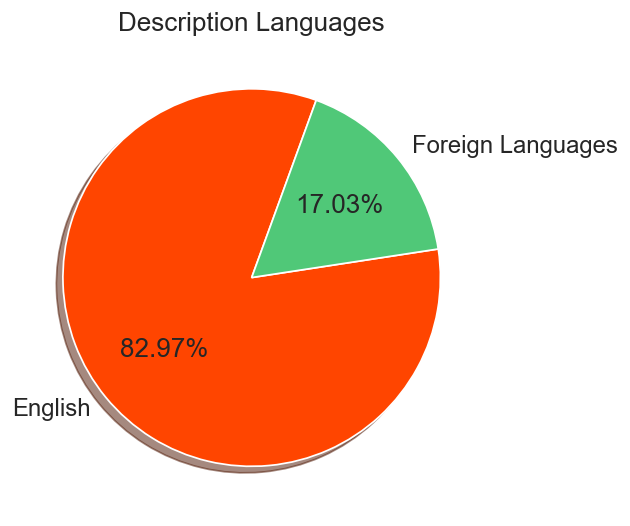

In [ ]:
sns.set(font_scale=1.25)  # scale up font size

plt.figure(figsize=(5, 5), dpi=125)
eng = freq_df.loc['en'].tolist()[0]
foreign_lang = len(dataset) - freq_df.loc['en'].tolist()[0]

plt.pie(x=[eng, foreign_lang],
        explode=(0, 0),
        labels=['English', 'Foreign Languages'],
        autopct='%1.2f%%',
        shadow=True,
        startangle=70,
        colors=[config['red_rgb'], config['green_rgb']])

fig = plt.gcf()
fig.set_size_inches(5, 5)
plt.title('Description Languages')
plt.show()

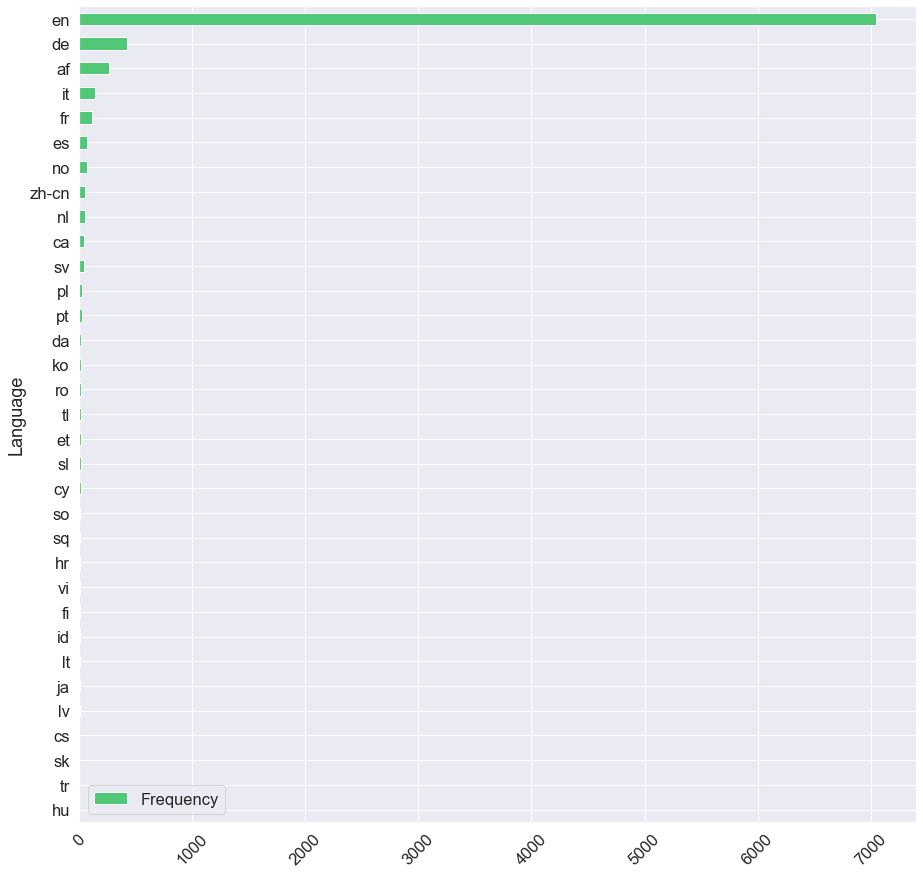

In [ ]:
sns.set(font_scale=1.5)  # scale up font size
freq_df.sort_values(by='Frequency', ascending=True).plot(kind='barh', width=0.5, figsize=(15, 15), color=config['green_rgb'])
plt.xticks(rotation=45)
plt.show()

In [ ]:
# detect the languages in the dataset
languages = []
lang_samples = defaultdict(list)
for text in tqdm(dataset.short_description):
    try:
        lang = detect_langs(text)
        clean_lang = str(lang).split(':')[0][1:]
        lang_samples[clean_lang].append(text)
        languages.append(clean_lang)
    except LangDetectException as e:
        errs.append(text)
        print('text: ', text)
        print(e)

 22%|██▏       | 1837/8499 [00:29<02:04, 53.48it/s] 

text:  bgflmyar.xgufkidq@gmail.com
No features in text.


 35%|███▌      | 2984/8499 [00:47<01:02, 87.71it/s]

text:  ???????????????????
No features in text.


100%|██████████| 8499/8499 [02:17<00:00, 61.91it/s] 


In [ ]:
print("Unique languages in the short descriptions: "
      f"{np.unique(languages)}")

Unique languages in the short descriptions: ['af' 'ca' 'cs' 'cy' 'da' 'de' 'en' 'es' 'et' 'fi' 'fr' 'hr' 'hu' 'id'
 'it' 'ko' 'lt' 'lv' 'nl' 'no' 'pl' 'pt' 'ro' 'sk' 'sl' 'so' 'sq' 'sv'
 'sw' 'tl' 'tr' 'vi' 'zh-cn']


In [ ]:
lang_freqs = {i: len(lang_samples[i]) for i in lang_samples}
freq_df = pd.DataFrame({'Language': lang_freqs.keys(), 'Frequency': lang_freqs.values()},
                       columns=['Language', 'Frequency']).set_index('Language')
freq_df.T

Language,en,et,no,es,it,nl,af,sv,ro,fr,...,vi,hr,pt,ko,lt,so,sw,lv,tr,hu
Frequency,6121,25,156,95,287,140,489,60,45,246,...,9,5,33,15,9,5,1,4,1,1


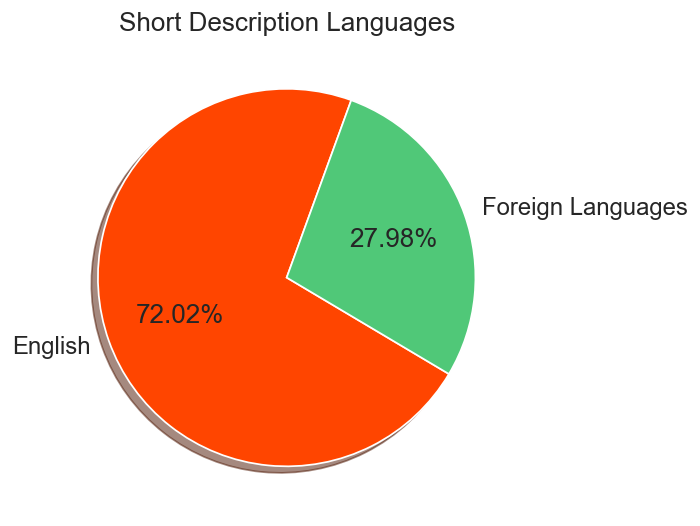

In [ ]:
sns.set(font_scale=1.25)  # scale up font size

plt.figure(figsize=(5, 5), dpi=125)
eng = freq_df.loc['en'].tolist()[0]
foreign_lang = len(dataset) - freq_df.loc['en'].tolist()[0]

plt.pie(x=[eng, foreign_lang],
        explode=(0, 0),
        labels=['English', 'Foreign Languages'],
        autopct='%1.2f%%',
        shadow=True,
        startangle=70,
        colors=[config['red_rgb'], config['green_rgb']])

fig = plt.gcf()
fig.set_size_inches(5, 5)
plt.title('Short Description Languages')
plt.show()

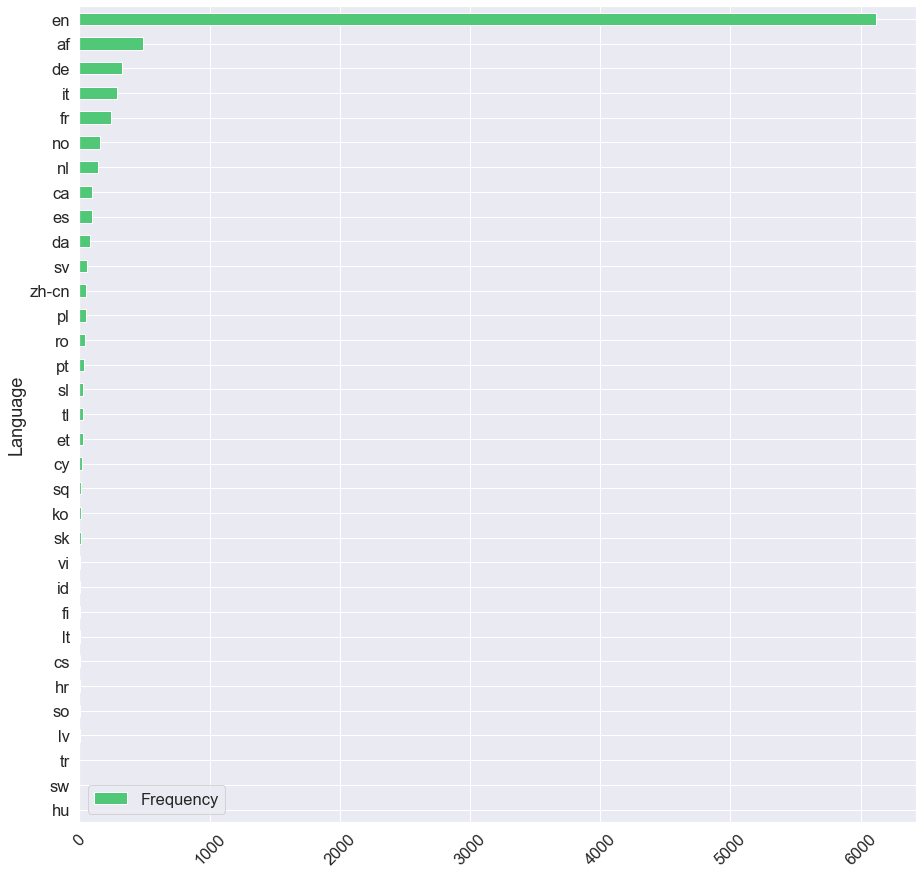

In [ ]:
sns.set(font_scale=1.5)  # scale up font size
freq_df.sort_values(by='Frequency', ascending=True).plot(kind='barh', width=0.5, figsize=(15, 15), color=config['green_rgb'])
plt.xticks(rotation=45)
plt.show()

In [ ]:
errs  # few errors where lang_detect failed, need to impute these irrelevant values

['+86  ', 'bgflmyar.xgufkidq@gmail.com', '???????????????????']

In [ ]:
dataset[dataset.description == errs[0]]

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,group_code,char_length_bins
6253,in the inbox always show there are several ema...,+86,mqbxwpfn uclrqfxa,GRP_0,5,1,94,19,0,0


In [ ]:
dataset.loc[dataset.description == errs[0], 'description'] = dataset[dataset.description == errs[0]].short_description

In [ ]:
dataset[dataset.short_description == errs[1]]

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,group_code,char_length_bins
1836,bgflmyar.xgufkidq@gmail.com,bgflmyar.xgufkidq@gmail.com wanted to check if...,olckhmvx pcqobjnd,GRP_0,83,13,27,1,0,9


In [ ]:
dataset.loc[dataset.short_description == errs[1], 'short_description'] = dataset[dataset.short_description == errs[1]].description

In [ ]:
dataset[dataset.short_description == errs[2]]

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,group_code,char_length_bins
2975,???????????????????,_x000D_\n_x000D_\nreceived from: yzbjhmpw.vzru...,yzbjhmpw vzrulkog,GRP_0,1375,145,19,1,0,62


In [ ]:
dataset.loc[dataset.short_description == errs[2], 'short_description'] = dataset[dataset.short_description == errs[2]].description

In [ ]:
def clean_incosistencies():
    dataset.loc[dataset.description == errs[0], 'description'] = dataset[dataset.description == errs[0]].short_description
    dataset.loc[dataset.short_description == errs[1], 'short_description'] = dataset[dataset.short_description == errs[1]].description
    dataset.loc[dataset.short_description == errs[2], 'short_description'] = dataset[dataset.short_description == errs[2]].description

# clean_incosistencies()

<h1><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Pre-Processing</span></strong></li>
</ul></h1>

In [ ]:
dataset.sample(10)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,group_code,char_length_bins
7164,abended job in job_scheduler: Job_1379,received from: monitoring_tool@company.com_x00...,ZkBogxib QsEJzdZO,GRP_9,118,12,38,5,73,12
1991,job Job_2080 failed in job_scheduler at: 10/08...,received from: monitoring_tool@company.com_x00...,bpctwhsn kzqsbmtp,GRP_6,118,12,62,8,56,12
7529,netweaver bussiness client does not open.,netweaver bussiness client does not open.,fgejnhux fnkymoht,GRP_0,41,6,41,6,0,4
3634,requesting un-install and re-install of excel ...,"i am currently running into issues with my ""co...",ferxqvsm esmwxqlf,GRP_0,251,46,50,7,0,24
8089,eagw8111224 shows defective system files - rei...,eagw8111224 shows defective system files - rei...,jksgwdyi greuqxko,GRP_28,97,13,97,13,21,10
7186,email access to mobile device.,email access to mobile device.,zpsoifea wvhilrpz,GRP_0,30,5,30,5,0,2
3587,please provide permission to the files in m:\i...,please provide permission to the files in m:\i...,ytwmgpbk cpawsihk,GRP_12,69,9,69,9,4,7
7784,user wanted to reset internet explorer,user wanted to reset internet explorer,gwkjrobm wrsznjmx,GRP_0,39,6,39,6,0,3
301,windows password reset,windows password reset,rlhkfdqa fmhioqla,GRP_0,22,3,22,3,0,1
5206,install zebra \we_wu101 \pfjwinbg ljtzbdqg,install zebra \we_wu101 \pfjwinbg ljtzbdqg,pfjwinbg ljtzbdqg,GRP_24,42,5,42,5,17,4


### Pipeline
* fix text encoding usng ftfy.fix_text
* clean up outage questionnaires
* clean up security logs
* parse email messages to retain only subject and body
* clean up emails, links, website links, telephone numbers
* clean up anchor words like: 'Received from:', 'name:', 'hello', 'hello team' , 'cid' ...
* clean html tags if they exist
* clean /r /n characters
* strip caller names in descriptions
* translate accented characters (á -> a)
* convert unicode characters to ascii
* expand contractions (they're -> they are)
* clean stopwords & any custom stopwords
* clean up extra whitespaces & tokenize
* remove gibberish (after language translation)
* strip extra punctuation
* lemmatization
* handle other languages (translated after basic pre-processing is applied on english text)

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Outage Questionnaires</span></strong></li>
</ul></h3>

In [ ]:
outage_df = dataset.reset_index().loc[pd.Series(['outage' in i for i in  dataset.description.tolist()])]

In [ ]:
outage_df.group.value_counts()

GRP_8     139
GRP_4      16
GRP_0       8
GRP_16      1
Name: group, dtype: int64

In [ ]:
outage_df

,index,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,group_code,char_length_bins
78,78,"power outage:UK al, 1st and 5th ave sites hard...",what type of outage: _____network _____ci...,mnlazfsr mtqrkhnx,GRP_8,1353,155,82,17,72,61
79,79,"power outage : germany, mx: site is hard down ...",what type of outage: ___x__network _____c...,jyoqwxhz clhxsoqy,GRP_8,1312,152,74,14,72,59
189,189,network outage: india: site hard down since at...,what type of outage: __x___network _____c...,mnlazfsr mtqrkhnx,GRP_8,1319,153,86,16,72,60
215,215,network outage - warehouse: node company-ups-...,what type of outage: __x___network _____c...,jyoqwxhz clhxsoqy,GRP_8,1308,151,80,11,72,59
240,240,power outage :australia australia: site hard d...,what type of outage: __x___network _____c...,utyeofsk rdyzpwhi,GRP_8,1167,132,78,13,72,56
...,...,...,...,...,...,...,...,...,...,...,...
8097,8098,"network outage, russia ru, company-russia-vpn-...",what type of outage: _x____network _____c...,uxgrdjfc kqxdjeov,GRP_8,1328,153,123,16,72,60
8184,8185,"circuit outage: vogelfontein, south africa mpl...",what type of outage: _____network ___x__c...,jyoqwxhz clhxsoqy,GRP_8,1314,153,86,15,72,60
8272,8273,network outage : south amerirtca(argentina) si...,what type of outage: ____x_network _____c...,vbwszcqn nlbqsuyv,GRP_8,1304,152,88,14,72,59
8274,8275,network outage: usa site is hard down since 05...,what type of outage: _x____network _____c...,vbwszcqn nlbqsuyv,GRP_8,1308,153,65,13,72,59


In [ ]:
outage_df.group.value_counts()

GRP_8     139
GRP_4      16
GRP_0       8
GRP_16      1
Name: group, dtype: int64

In [ ]:
print(outage_df.description.tolist()[0])

what type of outage:  _____network     _____circuit     ___x__power (please specify what type of outage)_x000D_
_x000D_
1. top 23 cert site   ?    ___yes______     (yes/no/na) _x000D_
_x000D_
2. when did it start  ?   ________4:31 pm et on 10/30. ______________x000D_
_x000D_
3.  scheduled maintenance ( power) ? __yno_____    (yes/no/na)     company power  _________     provider power __________x000D_
                _x000D_
4.  scheduled maintenance ( network) ? ___no____    (yes/no/na)     company maint________ (yes/no)       provider maint/ticket #__________________    _x000D_
_x000D_
5. does site have a backup circuit ?  __yes____    (yes/no/na) _x000D_
_x000D_
6. backup circuit active ?   ___na_____     (yes/no/na) _x000D_
_x000D_
7. site contact notified (phone/email) ?  _________     (yes/no/na) _x000D_
_x000D_
8. remote dial-in ?   ____na_______   (yes/no/na) _x000D_
_x000D_
9. equipment reset ?    ____na_______    (yes/no/na) _x000D_
_x000D_
10. verified site working on backup 

In [ ]:
def clean_outageq(text: str) -> str:
    """cleans up outage questionaires"""
    if text.startswith('what type of outage'):
        text = ' '.join(text.splitlines())
        text=text.replace("phone",'')
        text=text.replace('email','')
        text=re.sub(r'\n+|\s\s+','',text)
        text=re.sub(r'(\_x000D\_)+','br',text)
        text=re.sub(r'(\(yes\/no\/na\))+|(\(yes\/no\))','br',text)
        temp=text.split('br')
        new=[]
        for x in temp:
            x=str(x)
            x=re.sub(r'\d\:\d+','',x)
            if 'yes'in x:
                x=re.sub(r'\?|(\_)+|\d\.','',x)
                x=re.sub('yes','',x)
            elif 'no' in x:
                x=re.sub(r'\?|(\_)+|\d\.','',x)
                x=re.sub('no','',x)
                x='no'+' '+x
            else:
                x=re.sub(r'\?|(\_)+|\d\.','',x)
                
            new.append(''.join(x))
        text=''.join(new)
        text = re.sub(r'[.,_"\'#-?:!;]', '', str(text))
        text=text.replace('yesnona','')
        text=text.replace('yesno','')
        text= " ".join(text.split())
        text=re.sub(r'what\stype\sof\soutage\:networkcircuitxpower\s\(please\sspecify\swhat\stype\sof\soutage\)','',text)
    return str(text.strip())

In [ ]:
print(clean_outageq(outage_df.description.tolist()[0]))

what type of outagenetworkcircuitxpower please specify what type of outage top cert site when did it start pm et on no scheduled maintenance power ycompany powerprovider power no scheduled maintenance network company maint provider maintticket does site have a backup circuit backup circuit active na no site contact tified remote dialin na equipment reset na verified site working on backup circuit na vendor ticket globaltelecom verizon telecomvendor telecomvendor globaltelecom no tifiedgsccert started no additional diagstics


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Security/Event Logs</span></strong></li>
</ul></h3>

In [ ]:
dataset.reset_index().loc[pd.Series(['source ip' in i for i in  dataset.description.tolist()])]  # all security incident logs

,index,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,group_code,char_length_bins
341,341,security incidents - ( #in33071122 ) :[ipbl]: ...,source ip :\nsystem name :lmsl9516338\nuser n...,gzhapcld fdigznbk,GRP_3,166,30,87,13,23,17
2977,2978,security incidents - ( #in33987594) : 29866 vi...,source ip :_x000D_\nsystem name :_x000D_\nuser...,gzhapcld fdigznbk,GRP_3,3759,324,115,17,23,79
3096,3097,security incidents - ( #in33976733) : suspicio...,source ip: 10.16.90.249_x000D_\nsource hostnam...,gzhapcld fdigznbk,GRP_56,7577,728,104,11,52,89
3097,3098,security incidents - ( #in33984033) : internal...,source ip :_x000D_\nsystem name :_x000D_\nuser...,gzhapcld fdigznbk,GRP_19,7534,714,96,13,11,89
3529,3530,security incidents - ( #in33944691 ) : possibl...,source ip: 195.272.28.222\nsource port: 80\nso...,gzhapcld fdigznbk,GRP_2,7524,974,111,17,12,89
3531,3532,security incidents - ( #in33944327) :possible ...,source ip :_x000D_\nsystem name :_x000D_\nuser...,gzhapcld fdigznbk,GRP_2,4156,463,109,15,12,81
3704,3705,security incidents - ( #in33932723 ) : possibl...,source ip: 10.44.63.52_x000D_\nsource hostname...,gzhapcld fdigznbk,GRP_48,3763,400,105,14,43,79
3705,3706,security incidents - ( #in33924718 ) : possibl...,source ip :195.22.28.222_x000D_\ndestination i...,gzhapcld fdigznbk,GRP_2,4868,548,116,17,12,84
3960,3961,security incidents - ( #in33805815) : possible...,=========================_x000D_\nevent data_x...,gzhapcld fdigznbk,GRP_2,4256,489,110,16,12,82
3964,3965,security incidents - ( #in33809307 ) : possibl...,source ip :195.22.28.222 \nsystem name :androi...,gzhapcld fdigznbk,GRP_2,8988,1255,116,17,12,92


In [ ]:
dataset.reset_index().loc[pd.Series(['source ip' in i for i in  dataset.description.tolist()])].group.value_counts()  # groups

GRP_2     26
GRP_39     4
GRP_3      4
GRP_12     4
GRP_62     2
GRP_0      1
GRP_48     1
GRP_31     1
GRP_19     1
GRP_30     1
GRP_56     1
GRP_47     1
GRP_69     1
Name: group, dtype: int64

In [ ]:
dataset.reset_index().loc[pd.Series(['cyber' in i for i in  dataset.short_description.tolist()])]

,index,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,group_code,char_length_bins
491,491,october cyber security month - ransomware,october cyber security month - ransomware,pyrtfdxu nxfkqmoy,GRP_0,42,6,42,6,0,4
1729,1729,cyber security - phish uacyltoe hxgaycze repor...,cyber security - phish uacyltoe hxgaycze repor...,ugyothfz ugrmkdhx,GRP_2,60,9,60,9,12,6
5411,5412,cyber security - phish uacyltoe hxgaycze repor...,cyber security - phish uacyltoe hxgaycze repor...,ugyothfz ugrmkdhx,GRP_2,62,9,62,9,12,7


In [ ]:
def remove_duplicates(text: str) -> str:
    """Remove duplicates"""
    text = text.split(" ")
    for i in range(0, len(text)):
        text[i] = "".join(text[i])
    UniqW = Counter(text)
    text = " ".join(UniqW.keys())
    return str(text)

# remove_duplicates(text)

In [ ]:
log = dataset.reset_index().loc[pd.Series(['source ip' in i for i in  dataset.description.tolist()])].iloc[1].description
print(log)

source ip :_x000D_
system name :_x000D_
user  name:_x000D_
location :_x000D_
sep , sms status :_x000D_
field sales user ( yes / no) :  _x000D_
dsw event log:_x000D_
-------------------------------------------------------------------------------------------------------------------_x000D_
event detail(s):_x000D_
_x000D_
event_id 417013204:_x000D_
[**] [1:21130977:10] 29866 vid22518 bare http get executable from ip address (possible downloader trojan) [**]_x000D_
[classification: none] [priority: 2] [action: accept_passive] [impact_flag: 0] [impact: 0] [blocked: 2] [vlan: 0] [mpls label: 0] [pad2: 1]_x000D_
[sensor id: 602982][event id: 281895][time: 2585087487.272206]_x000D_
[xref => vid, 22518]_x000D_
[src ip: 10.1.43.79][dst ip: 94.102.53.238][sport/itype: 61007][dport/icode: 80][proto: 6]_x000D_
09/27/2016-11:39:36.272206 10.1.43.79:61007 -> 94.102.53.238:80_x000D_
tcp ttl:127 tos:0x0 id:16297 iplen:20 dgmlen:119 df_x000D_
***ap*** seq: 0xfbc9dc8c ack: 0xe57c9433 win: 0x102 tcplen: 20

In [ ]:
def clean_sec_logs(text: str) -> str:
    """Clean up security logs"""
    if text.startswith('source ip'):
        words = set(['source','ip','hostname', 'mac', 'events', 'yes / no'])
        word_cleanup = r'\b(?:{})\b'.format('|'.join(words))
        text = text.replace('\n', ' ').replace('\r', '')
        text = re.sub(r'((:)?\s?\d+(.|:)?)+', '', text)
        text = re.sub('(_x000D_|_x_|_x|x_)', '', text)
        text = re.sub(r'(\[|\]|(\-)+|(\=)+|\%|\,|\"|\:|\(|\))?','', text)
        text = re.sub(word_cleanup,'', text)
        text = remove_duplicates(text)
    return str(text)

clean_sec_logs(log)

" system name user location sep sms status field sales dsw event log details event_id ** vidbare http get executable from address possible downloader trojan classification none priority action accept_passive impact_flag impact blocked vlan mpls label pad sensor idevent idtime xref > vid src ipdst ipsport/itypedport/icodeproto> tcp ttltosidiplendgmlendf ***ap*** seqfbcc ackewintcplen pcap s zeawn'?afo^feeeeofbcdcedet /~yahoo/csrsv.exe http/hostconnection keepalive e ex http_uri http_hostname osecurity correlation_data sepdhcpd dhcpack onto cfelhql via ethrelayleasedurationrenew lowercaseurlcorrelation srcip urlcorrelation vendorreference foreseeconndirection outgoing refererproxycorrelationurl null foreseeexternalip eventtypeid unique_event_hash ontologyid foreseeinternalip urlpath srchostname lhql inspectorruleid inspectoreventid httpmethod netacuity_destination_organization ecatel ltd vendoreventid device_id foreseemaliciousprobability event_summary tcpflags agentid cvss foreseedstipg

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Clean up caller ids in description</span></strong></li>
</ul></h3>

In [ ]:
uniq_callers = set(dataset.caller.tolist())
len(uniq_callers)

2950

In [ ]:
callers_tokens = set(flatten([i.split() for i in uniq_callers]))
len(callers_tokens)

5900

In [ ]:
def clean_callers(text: str, callers_tokens=callers_tokens) -> str:
    """strips out caller ids from the descriptions"""
    return ' '.join([w for w in text.split()  if w.lower() not in callers_tokens])

test = """yfqoaepn xnezhsit
managing director
finance manager cee
"""

clean_callers(test)

'managing director finance manager cee'

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Clean Irrelevant Information</span></strong></li>
</ul></h3>

* Clean up Emails, Links, Dates, Telephone Numbers

In [ ]:
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\raaje\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\raaje\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
test = "Date: 12/2/2024" 
doc = nlp(test)
toks = [t.text for t in doc]
toks = [t.strip() for t in toks]
text = " ".join(toks)
tags = ['O']*len(doc)
tag = "DATE"
date_hdlr = DateHandler()
date_indices = date_hdlr.match_ref(text, toks, tags,
                                   entity=tag,
                                   verbose=True)
tags = ['DATE' if idx in date_indices else 'O'
        for idx in range(len(toks))]
print(text)
print(toks)
print(tags)
pprint(list(zip(toks, tags)), compact=True)


Final Matches DATE: ['12/2/2024']

Date : 12/2/2024
['Date', ':', '12/2/2024']
['O', 'O', 'DATE']
[('Date', 'O'), (':', 'O'), ('12/2/2024', 'DATE')]


In [ ]:
test = "mailto: john.doe@gmail.com from: jane.doe@outlook.com"
doc = nlp(test)
toks = [t.text for t in doc]
toks = [t.strip() for t in toks]
text = " ".join(toks)
tags = ['O']*len(doc)
tag = "MAIL"
email_hdlr = EmailHandler()
email_indices = email_hdlr.match_ref(text, toks, tags,
                                     entity=tag,
                                     verbose=True)
tags = [tag if idx in email_indices else 'O'
        for idx in range(len(toks))]
print(text)
print(toks)
print(tags)
pprint(list(zip(toks, tags)), compact=True)


Final Matches MAIL: ['john.doe@gmail.com', 'jane.doe@outlook.com']

mailto : john.doe@gmail.com from : jane.doe@outlook.com
['mailto', ':', 'john.doe@gmail.com', 'from', ':', 'jane.doe@outlook.com']
['O', 'O', 'MAIL', 'O', 'O', 'MAIL']
[('mailto', 'O'), (':', 'O'), ('john.doe@gmail.com', 'MAIL'), ('from', 'O'),
 (':', 'O'), ('jane.doe@outlook.com', 'MAIL')]


In [ ]:
test = "www.google.com/?search Search Results: ..." 
doc = nlp(test)
toks = [t.text for t in doc]
toks = [t.strip() for t in toks]
text = " ".join(toks)
tags = ['O']*len(doc)
tag = "LINK"
link_hdlr = LinkHandler()
link_indices = link_hdlr.match_ref(text, toks, tags,
                                   entity=tag,
                                   verbose=True)
tags = [tag if idx in link_indices else 'O'
        for idx in range(len(toks))]
print(text)
print(toks)
print(tags)
pprint(list(zip(toks, tags)), compact=True)


Final Matches LINK: ['www.google.com/?search']

www.google.com/?search Search Results : ...
['www.google.com/?search', 'Search', 'Results', ':', '...']
['LINK', 'O', 'O', 'O', 'O']
[('www.google.com/?search', 'LINK'), ('Search', 'O'), ('Results', 'O'),
 (':', 'O'), ('...', 'O')]


In [ ]:
test = "Tel +1 724 539 5257" 
doc = nlp(test)
toks = [t.text for t in doc]
toks = [t.strip() for t in toks]
text = " ".join(toks)
tags = ['O']*len(doc)
tag = "TEL"
tel_hdlr = TelHandler()
tel_indices = tel_hdlr.match_ref(text, toks, tags,
                                 entity=tag,
                                 verbose=True)
tags = [tag if idx in tel_indices else 'O'
        for idx in range(len(toks))]
print(text)
print(toks)
print(tags)
pprint(list(zip(toks, tags)), compact=True)


Final Matches TEL: ['Tel', '+1', '724', '539', '5257']

Tel +1 724 539 5257
['Tel', '+1', '724', '539', '5257']
['TEL', 'TEL', 'TEL', 'TEL', 'TEL']
[('Tel', 'TEL'), ('+1', 'TEL'), ('724', 'TEL'), ('539', 'TEL'), ('5257', 'TEL')]


In [ ]:
def clean_irrelevant_info(text: str) -> str:
    """strips out emails, dates, website links and telephone numbers in the text"""
    doc = nlp(text)
    toks = [t.text for t in doc]
    toks = [t.strip() for t in toks]
    text = " ".join(toks)
    tags = ['O']*len(doc)
    tel_indices = tel_hdlr.match_ref(text, toks, tags,
                                     entity='TEL',
                                     verbose=False)
    tags = ['TEL' if idx in tel_indices else 'O'
            for idx in range(len(toks))]
    link_indices = link_hdlr.match_ref(text, toks, tags,
                                       entity='LINK',
                                       verbose=False)
    tags = ['LINK' if idx in link_indices else tag
            for idx, tag in enumerate(tags)]
    date_indices = date_hdlr.match_ref(text, toks, tags,
                                       entity='DATE',
                                       verbose=False)
    tags = ['DATE' if idx in date_indices else tag
            for idx, tag in enumerate(tags)]
    email_indices = email_hdlr.match_ref(text, toks, tags,
                                         entity='MAIL',
                                         verbose=False)
    tags = ['MAIL' if idx in email_indices else tag
            for idx, tag in enumerate(tags)]
    # print(toks)
    # print(tags)
    # print([tok for tok, tag in zip(toks, tags) if tag == "O"])

    text = str(" ".join([tok for tok, tag in zip(toks, tags) if tag == "O"]))
    # Remove HTML special entities (e.g. &amp;)
    text = re.sub(r'\&\w*;', '', text)
    # Remove hyperlinks
    text = re.sub(r'https?:\/\/.*\/\w*', '', text)  
    return text

In [ ]:
%%time

test = "Tel +1 724 539 5257 www.google.com/?search Search Results: ... Date: 12/2/2024 mailto: john.doe@gmail.com from: jane.doe@outlook.com"
clean_irrelevant_info(test)

Wall time: 10.9 ms


'Search Results : ... Date : mailto : from :'

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Clean Anchors</span></strong></li>
</ul></h3>

In [ ]:
anchors = ['received from:', 'received from :', 'received from:',
           'from:', 'to:', 'from :', 'to :',
           'date:', 'date :', 'cid', 'gentles,',
           '^hi', '^hello', '^hello,', '^hello ,', '^dear team',
           'good morning', 'good morning,' '^hi there', '^hi there,',
           'received from:?', 'hello helpdesk', 'best$',
           'hello', 'hi', 'employee', 'manager', 'etc', 'meetings', 'welcome',
           'please', 'pls', 'sir','mam', 'regards', 'jpg', 'image', 'fyi',
           'good', 'afternoon', 'morning', 'greetings',
          ]

# to strip out larger anchors first
anchors = sorted(list(set(anchors)), key=len, reverse=True)
anchors = [re.compile(a) for a in anchors]

def clean_anchors(text: str, anchors=anchors) -> str:
    """strips out anchor words"""
    for anchor in anchors:
        text = re.sub(anchor, '', text.strip()).strip()
    return str(text.strip())

In [ ]:
%%time
test = """
hi there,

would you please help me unlock my supply_chain_software account and reset my supply_chain_software password? """
clean_anchors(test)

Wall time: 997 µs


'would you  help me unlock my supply_chain_software account and reset my supply_chain_software password?'

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Parse Emails</span></strong></li>
</ul></h3>

In [ ]:
test = """received from: hmjdrvpb.komuaywn@gmail.com

hello team,

my meetings/skype meetings etc are not appearing in my outlook calendar, can somebody please advise how to correct this?

kind """

In [ ]:
def parse_body(msg: str, encoding='utf-8'):
    b = email.message_from_string(msg)
    body = ""

    if b.is_multipart():
        for part in b.walk():
            ctype = part.get_content_type()
            cdispo = str(part.get('Content-Disposition'))

            # skip any text/plain (txt) attachments
            if ctype == 'text/plain' and 'attachment' not in cdispo:
                body = part.get_payload(decode=True)  # decode
                break

    # not multipart - i.e. plain text & no attachments
    else:
        # print('Plain Text')
        body = b.get_payload(decode=True)

    subject_matches =  re.findall('subject:.*\n', test)
    if subject_matches:
        subject = subject_matches[0]
    else:
        subject = b.get_all('subject')

    if not isinstance(subject, str):
        subject = ''
    
    # print("Subject: ", subject)
    # print("Body: ", body)

    body = str(from_bytes(body).best())
    # body = str(body, encoding)

    parsed_msg = str(subject + body)
    if is_blank(parsed_msg):
        # return original message if no payload is found after parsing
        return msg
    return parsed_msg

In [ ]:
def strip_headers(text: str) -> str:
    """strip headers in email messages like: "received from: xyz@gmail.com"""
    patterns = list()
    patterns.append(r'received from:?\s?' + email_regex)
    patterns.append(r'from:?\s?' + email_regex)
    patterns.append(r'email:?\s?' + email_regex)
    patterns.append(r'to:?\s?' + email_regex)
    patterns.append(r'to:\s')
    patterns.append(r'sent:\s.*[ap]m')
    patterns.append(r'customer number:')
    patterns.append(r'summary:')
    patterns.append(r'subject:')
    patterns.append(r'telephone:')
    patterns.append(r'regional controller')
    patterns.append(r'<mail>')
    patterns.append(r'help desk,')
    patterns.append(r'it team,')
    patterns.append(r'hello team\s?,?')
    patterns.append(r'global it team,')
    patterns.append(r'\nbest\n')
    patterns.append(r'\nregards\n')
    patterns.append(r'\[cid:?.*\]')  # attachments link
    
    # patterns.append(r'subject:?.*\b')
    patterns = [re.compile(p) for p in patterns]
    for pattern in patterns:
        text = re.sub(pattern, '', text.strip()).strip()
    return str(text.strip())

def parse_email(msg: str) -> str:
    """parses and cleans email messages"""
    doc = nlp(msg)
    toks = [t.text for t in doc]
    toks = [t.strip() for t in toks]
    text = " ".join(toks)
    tags = ['O']*len(doc)
    tag = "MAIL"
    email_indices = email_hdlr.match_ref(text, toks, tags,
                                         entity=tag,
                                         verbose=False)
    if email_indices:
        msg = parse_body(msg)
        msg = strip_headers(msg)
    return msg

def parse_email_row(row):
    descr = row.description
    short_descr = row.short_description
    # text_normalized = str(from_bytes(text.encode('utf-8')).best())
    row['cleaned_short_description'] = parse_email(short_descr)
    row['cleaned_description'] = parse_email(descr)
    return row

print(parse_email(test))

my meetings/skype meetings etc are not appearing in my outlook calendar, can somebody please advise how to correct this?

kind


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Gibberish Removal</span></strong></li>
</ul></h3>

In [ ]:
nltk.download('words')
vocab = set(nltk.corpus.words.words())

gib = set(['æ','¹','å','†ç','ï¼Œ','Ž','¥','Š','å','©','ç™','å½','ä','º','†','ã','€','æ','—','¶',"f³","‹","è","§",'¯åŠ¨å','¯åŠ¨å','Žé'])
gibb = r'\b(?:{})\b'.format('|'.join(gib))
def clean_gibberish(text: str) -> str:
    #gibb = r'\b(?:{})\b'.format('|'.join(gib))
    text=text.lower()
    # Remove hashtag while keeping hashtag text
    text = re.sub(r'#','', text)
    # replace '&' with 'and'
    text = re.sub(r'&;?', 'and', text)

    # Remove characters beyond Readable formart by Unicode:
    # text= ''.join(c for c in text if c <= '\uFFFF') 
    # text = text.strip()
    # Remove unreadable characters  (also extra spaces)
    text = ' '.join(re.sub("[^\u0030-\u0039\u0041-\u005a\u0061-\u007a]", " ", text).split())
    text = re.sub(r"\s+[a-zA-Z]\s+", ' ', text)
    text = re.sub(' +', ' ', text)
    text = re.sub('xd','',text)
    text = re.sub(gibb,'',text)
    return str(text.strip())


def clean_oov(text: str, vocab=vocab) -> str:
    """strips out words that are outside the given vocabulary
       (exclude out-of-vocab tokens)"""
    text = " ".join([i for i in text.split() if i.lower() in vocab])
    return str(text.strip())

[nltk_data] Downloading package words to
[nltk_data]     C:\Users\raaje\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Utility functions for Generic Pre-Processing</span></strong></li>
</ul></h3>

In [ ]:
# utility functions for text preprocesing

CUSTOM = True

stemmer = SnowballStemmer('english')
if CUSTOM:
    stop_words = set(nltk.corpus.stopwords.words('english'))
    # custom stopwords added from the most frequent words which are generic 
    # and might not relate to the sentiment of the review
    stop_words.update(['urllink', ])
else:
    stop_words = set(nltk.corpus.stopwords.words('english'))


def replace_accented_chars(text: str) -> str:
    """normalizes and replaces accented characters"""
    unaccented_text = unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8', 'ignore')
    return str(unaccented_text)


def strip_html_tags(text: str) -> str:
    """strips html tags like <h4> ..etc"""
    soup = BeautifulSoup(text, "html.parser")
    [s.extract() for s in soup(['iframe', 'script'])]
    stripped_text = soup.get_text()
    stripped_text = re.sub(r'[\r|\n|\r\n]+', '\n', stripped_text)
    return str(stripped_text)


def expand_contractions(text: str) -> str:
    text = contractions.fix(text)
    return str(text)


def remove_special_characters(text: str) -> str:
    """
    Remove special characters but preserve digits and excalamation marks
    as they indicate emotionally charged review """
    text = re.sub(r"[^A-Za-z0-9!?\'\`]", " ", text)
    return str(text)


def strip_stops(text: str, is_lower_case=False, stop_words=stop_words) -> str:
    """strip stopwrds"""
    tokens = text.split()
    tokens = [token.strip() for token in tokens]
    if is_lower_case:
        filtered_tokens = [token for token in tokens if token not in stop_words]
    else:
        filtered_tokens = [token for token in tokens if token.lower() not in stop_words]
    filtered_text = ' '.join(filtered_tokens)    
    return str(filtered_text)


def snowball_stem(text: str, stemmer=stemmer) -> str:
    """stemming using snowball stemmer"""
    words = text.split()
    stemmed_words = [stemmer.stem(word) for word in words]
    text = " ".join(stemmed_words)
    return str(text)


def tokenize(text: str) -> str:
    """tokenize using spaCy"""
    doc = nlp(text)
    return str(" ".join([t.text for t in doc]))


def lemmatize(text: str) -> str:
    """lemmatize using spaCy"""
    doc = nlp(text)
    return str(" ".join([t.lemma_ for t in doc]))

In [ ]:
def preprocess_text(text: str,
                    fix_encoding=config['fix_encoding'],
                    clean_security_logs=config['clean_security_logs'],
                    clean_emails=config['clean_emails'],
                    strip_irrelevant=config['strip_irrelevant'],
                    strip_anchors=config['strip_anchors'],
                    strip_callers=config['strip_callers'],
                    clean_html_tags=config['clean_html_tags'],
                    replace_accented=config['replace_accented'],
                    clean_contractions=config['clean_contractions'],
                    remove_special=config['remove_special'],
                    strip_stopwords=config['strip_stopwords'],
                    clean_whitespace=config['clean_whitespace'],
                    tokenize_text=config['tokenize_text'],
                    remove_gibberish=config['remove_gibberish'],
                    remove_oov=config['remove_oov'],
                    lower=config['lower'],
                    get_lemmas=config['get_lemmas'],
                    strip_numbers=config['strip_numbers']
                   )-> str:
    """performs all preprocessing techniques in the pipeline on a string to return a cleaned string"""

    if fix_encoding:
        text = fix_text(text)

    if clean_security_logs:
        text = clean_sec_logs(text)
        text = clean_outageq(text)

    if clean_emails:
        text = parse_email(text)

    if strip_irrelevant:
        text = clean_irrelevant_info(text)

    if strip_anchors:
        text = clean_anchors(text)

    if strip_callers:
        text = clean_callers(text)
    
    if clean_html_tags:
        text = strip_html_tags(text)
    
    if replace_accented:
        text = replace_accented_chars(text)

    if clean_contractions:
        text = expand_contractions(text)

    if remove_special:
        text = remove_special_characters(text)

    if strip_stopwords:
        text = strip_stops(text)
    
    if clean_whitespace:
        # remove extra whitespace between tokens
        text = ' '.join(text.split())
    
    if tokenize_text:
        text = tokenize(text)
    
    if remove_gibberish:
        text = clean_gibberish(text)
    
    if remove_oov:
        text = clean_oov(text)

    if lower:
        text = text.lower()

    if get_lemmas:
        text = lemmatize(text)

    if strip_numbers:
        text = ' '.join([re.sub(r'\d+', '', tok) for tok in text.split()])

    return str(text.strip())

In [ ]:
test = """
received from: phfduvwl.yqnaucep@gmail.com

hello
i failed to login my hpqc account and got below message.
could you please reset password for my hpqc account, i need it to do uacyltoe hxgaycze next week
my user id is zhudrs

[cid:image001.png@01SID_358c2.0b26f430]
"""

In [ ]:
test = """received from: tbvpkjoh.wnxzhqoa@gmail.com

i need access to the following path.  please see pmgzjikq potmrkxy for approval.



tbvpkjoh wnxzhqoa
company usa plant controller
tbvpkjoh.wnxzhqoa@gmail.com<tbvpkjoh.wnxzhqoa@gmail.com>

ticket update on inplant_872683
unable to login to collaboration_platform // password reset
all my calls to my ip phone are going to warehouse_toolmail, it is not even ringing. 
sales area selection on opportunities not filtering to those in which the account """
print(test)

received from: tbvpkjoh.wnxzhqoa@gmail.com

i need access to the following path.  please see pmgzjikq potmrkxy for approval.



tbvpkjoh wnxzhqoa
company usa plant controller
tbvpkjoh.wnxzhqoa@gmail.com<tbvpkjoh.wnxzhqoa@gmail.com>

ticket update on inplant_872683
unable to login to collaboration_platform // password reset
all my calls to my ip phone are going to warehouse_toolmail, it is not even ringing. 
sales area selection on opportunities not filtering to those in which the account 


In [ ]:
%%time

cleaned = preprocess_text(test)
pprint(cleaned, compact=True)

('need access follow path see pmgzjikq potmrkxy approval company usa plant '
 'controller ticket update inplant  unable login collaboration platform '
 'password reset call ip phone go warehouse toolmail even ring sale area '
 'selection opportunity filter wch account')
Wall time: 131 ms


In [ ]:
def preprocess_df(row):
    descr = row.description
    short_descr = row.short_description

    if isinstance(descr, str):
        descr = preprocess_text(descr)
    else:
        descr = np.nan
    row['cleaned_description'] = descr
    
    if isinstance(short_descr, str):
        short_descr = preprocess_text(short_descr)
    else:
        short_descr = np.nan
    row['cleaned_short_description'] = short_descr
    return row

In [ ]:
preprocessed_dataset = dataset.progress_apply(preprocess_df, axis=1)

100%|██████████| 8499/8499 [09:24<00:00, 15.07it/s]


In [ ]:
preprocessed_dataset.isna().sum()

short_description            0
description                  0
caller                       0
group                        0
char_length                  0
word_length                  0
short_char_length            0
short_word_length            0
group_code                   0
char_length_bins             0
cleaned_description          0
cleaned_short_description    0
dtype: int64

In [ ]:
# cleaned dataset
preprocessed_dataset.sample(10)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,group_code,char_length_bins,cleaned_description,cleaned_short_description
5615,reg: warehouse_tool communication tickets,\n\nreceived from: jvhqyamt.wodzrcjg@gmail.com...,jvhqyamt wodzrcjg,GRP_0,292,45,42,4,0,27,gso team assign critical warehouse tool ticket...,reg warehouse tool communication ticket
4782,job SID_36cold failed in job_scheduler at: 09/...,received from: monitoring_tool@company.com_x00...,bpctwhsn kzqsbmtp,GRP_5,123,11,67,7,45,13,xd xd job sid cold fail job scheduler,job sid cold fail job scheduler
4221,cannot syncronize outlook appointments to crm,_x000D_\n_x000D_\nreceived from: lzycofut.mzbo...,lzycofut mzbovhpd,GRP_0,351,38,45,6,0,31,xd xd xd xd dear help team xd xd xd xd synchro...,syncronize outlook appointments crm
763,"erp SID_34 response time too slow, transaction...",transactions are interrupted and erp connectio...,ljynoupq zwlxjens,GRP_0,69,9,109,16,0,7,transaction interrupt erp connection break con...,erp sid response time slow transaction interr...
6391,error on erp,error on erp,khufscza qoixpave,GRP_0,12,3,12,3,0,0,error erp,error erp
7321,abended job in job_scheduler: hr_tooldcvcgenratn,received from: monitoring_tool@company.com_x00...,ZkBogxib QsEJzdZO,GRP_6,128,12,48,5,56,13,xd xd abende job job scheduler hr tooldcvcgenratn,abende job job scheduler hr tooldcvcgenratn
7251,hp alm triggered not shown up in inbox,:\nsummary:actually the emails from hp alm tri...,nftpwqsl hgmkrtqv,GRP_0,75,13,39,8,0,8,summary actually email hp alm trigger show inbox,hp alm trigger show inbox
4270,change skirtylset percentages,change skirtylset percentages effective 9/19/2...,itylnjqw kqiurhbt,GRP_7,69,8,30,3,67,7,change skirtylset percentage effective see lis...,change skirtylset percentage
1191,no audio on ethics page,no audio on ethics page,vyluaepi dtwfaejr,GRP_0,23,5,23,5,0,1,audio etcs page,audio etcs page
6872,weekly reboot of csqe prod servers,weekly reboot of csqe prod servers _x000D_\n_x...,uvrbhlnt bjrmalzi,GRP_8,93,10,35,6,72,10,weekly reboot csqe prod server xd xd hostname ...,weekly reboot csqe prod server


In [ ]:
def get_length(row):
    try:
        row['char_length'] = len(row.description)
        row['word_length'] = len(row.description.split())
        row['short_char_length'] = len(row.short_description)
        row['short_word_length'] = len(row.short_description.split())
        row['cleaned_char_length'] = len(row.cleaned_description)
        row['cleaned_word_length'] = len(row.cleaned_description.split())
        row['cleaned_short_char_length'] = len(row.cleaned_short_description)
        row['cleaned_short_word_length'] = len(row.cleaned_short_description.split())
    except Exception:  # assign 0 length to missing rows, if any
        row['char_length'] = 0
        row['word_length'] = 0
        row['short_char_length'] = 0
        row['short_word_length'] = 0
        row['cleaned_char_length'] = 0
        row['cleaned_word_length'] = 0
        row['cleaned_short_char_length'] = 0
        row['cleaned_short_word_length'] = 0
    return row

preprocessed_dataset = preprocessed_dataset.progress_apply(get_length, axis=1)

100%|██████████| 8499/8499 [00:27<00:00, 304.52it/s]


In [ ]:
preprocessed_dataset.shape

(8499, 16)

In [ ]:
def merge_descriptions(row):
    """merge description columns to create a new derived feature
    intelligently by not repeating words if already present"""
    merged_descr = np.nan
    short_descr = str(row.cleaned_short_description)
    descr = str(row.cleaned_description)
    short_tokens = [i for i in short_descr.split()]

    if len(descr) == 0 and len(short_descr) == 0:
        merged_descr = str(row.short_description + " " + row.description)
        
    elif len(short_descr) == 0 and len(descr) > 0:
        merged_descr = descr

    elif len(descr) == 0 and len(short_descr) > 0:
        merged_descr = short_descr

    elif (row.cleaned_short_description == row.cleaned_description
          or str(row.description).startswith(short_descr)
          or short_descr in str(row.description)
         ):
        merged_descr = descr

    elif any(i for i in short_tokens if i in descr):
        short_tokens = [i for i in short_tokens if i not in descr]
        merged_descr = str(' '.join(short_tokens)).strip() + " " + descr

    else:
        merged_descr = short_descr + " " + descr
    row['merged_description'] = str(merged_descr).strip()
    return row

merged_dataset = preprocessed_dataset.progress_apply(merge_descriptions, axis=1)

100%|██████████| 8499/8499 [00:07<00:00, 1067.77it/s]


In [ ]:
merged_dataset[['cleaned_short_description', 'cleaned_description', 'merged_description']].sample(7)

,cleaned_short_description,cleaned_description,merged_description
3711,batch number appear pdf output engineering tool,dear bhughjdra ts enquiry agree batch number v...,appear pdf output engineering tool dear bhughj...
1129,password reset,password reset,password reset
1444,add lean event,launch add lean event icon collaboration platf...,launch add lean event icon collaboration platf...
1506,unable access ap remote eu remote wle na remot...,try access either one receive message ts page ...,unable ap remote eu remote wle na remote fjaqb...
8361,vitalyst icon desktop,xd xd help myhzrtsi rwnhqiyv download vitalyst...,xd xd help myhzrtsi rwnhqiyv download vitalyst...
2194,skype business work,xd xd xd xd xd xd need help xd xd skype busine...,xd xd xd xd xd xd need help xd xd skype busine...
3326,eagsm service security tool password stop disa...,eagsm service security tool password stop disa...,eagsm service security tool password stop disa...


In [ ]:
merged_dataset.shape

(8499, 17)

In [ ]:
merged_dataset.to_excel('merged_clean_data_with_chinese.xlsx', index=None)

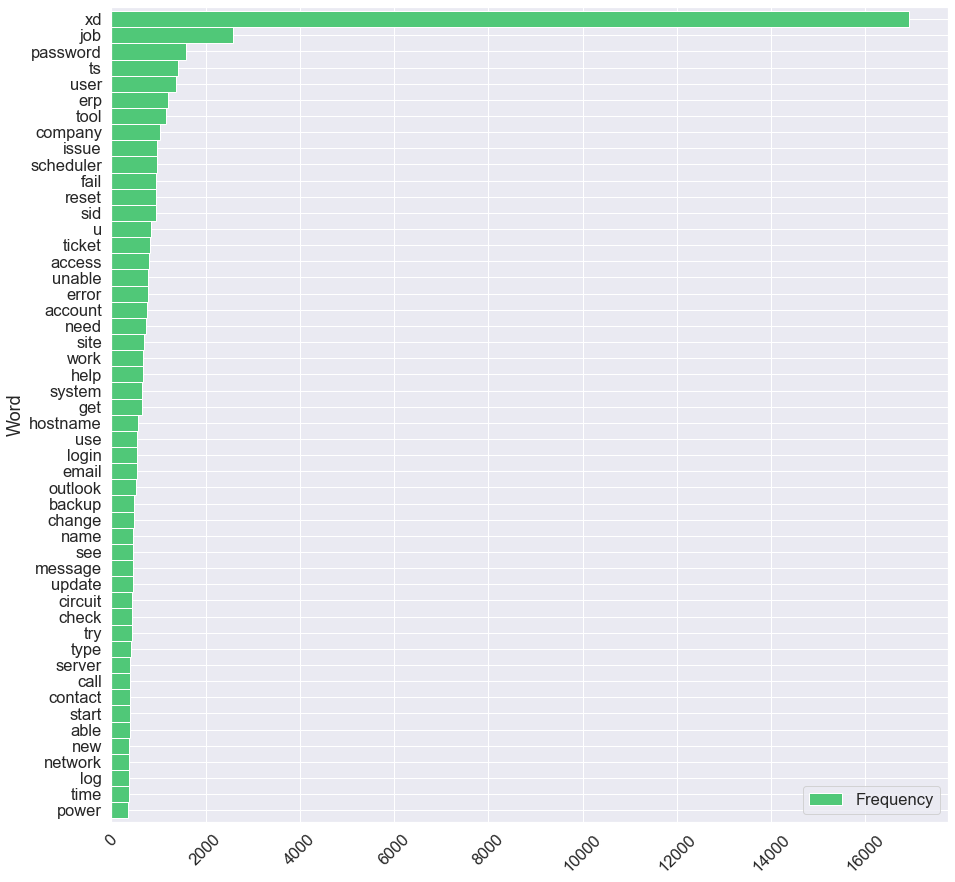

In [ ]:
# top 50 most frequent words in text
top_N = 50

words = (merged_dataset.cleaned_description.str.cat(sep=' ').split())
rslt = pd.DataFrame(Counter(words).most_common(top_N),
                    columns=['Word', 'Frequency']).set_index('Word')
rslt[:50].transpose()
sns.set(font_scale=1.5)  # scale up font size
rslt.sort_values(by='Frequency', ascending=True).plot(kind='barh', width=1, figsize=(15, 15), color=config['green_rgb'])
plt.xticks(rotation=45)
plt.savefig('dist_after_cleaning.png')
plt.show()

<h1><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Language Translation</span></strong></li>
</ul></h1>

* Objective:

Detect Foreign Languages in dataset and perform machine translation backed by Hugging Face models. The quality of machine translation via cloud services has come a very long way and produces high quality results. This notebook shows how the models from Hugging Face give developers a reasonable alternative for local machine translation.

In [ ]:
import re
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from pprint import pprint

tqdm.pandas()

In [ ]:
dataset = pd.read_excel('merged_clean_data_with_chinese.xlsx')

dataset.isna().sum()

short_description             0
description                   0
caller                        0
group                         0
char_length                   0
word_length                   0
short_char_length             0
short_word_length             0
group_code                    0
char_length_bins              0
cleaned_description          42
cleaned_short_description    50
cleaned_char_length           0
cleaned_word_length           0
cleaned_short_char_length     0
cleaned_short_word_length     0
merged_description            0
dtype: int64

In [ ]:
dataset.sample(7)

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,group_code,char_length_bins,cleaned_description,cleaned_short_description,cleaned_char_length,cleaned_word_length,cleaned_short_char_length,cleaned_short_word_length,merged_description
5064,erp SID_34 account unlock,erp SID_34 account unlock,gljkfidc kelctrpf,GRP_0,25,4,25,4,0,1,erp sid account unlock,erp sid account unlock,23,4,23,4,erp sid account unlock
5412,unable to connect to companysecure,unable to connect to companysecure,tmjxhlwf nacglwiu,GRP_0,34,5,34,5,0,3,unable connect companysecure,unable connect companysecure,28,3,28,3,unable connect companysecure
1335,inquiry on erp SID_34 maintenance,inquiry on erp SID_34 maintenance,rzckwufx vgysnlab,GRP_0,35,5,35,5,0,3,inquiry erp sid maintenance,inquiry erp sid maintenance,28,4,28,4,inquiry erp sid maintenance
4410,unable to install the gd&t font,name: ovxwqybe gevzkrlp\nemail: ovxwqybe.gevzk...,ovxwqybe gevzkrlp,GRP_3,104,11,31,6,23,11,name need gd font instal,unable install gd font,24,5,22,4,unable install name need gd font instal
443,unable to login to pc,misplaced username / password.,serckxqb mljnkgze,GRP_0,30,4,21,5,0,2,misplace username password,unable login pc,26,3,15,3,unable login pc misplace username password
8470,电脑开机开不出来,"to 小贺,早上电脑开机开不出来",xqyjztnm onfusvlz,GRP_30,16,2,8,1,24,4,NaN,NaN,0,0,0,0,"电脑开机开不出来 to 小贺,早上电脑开机开不出来"
2381,EU_tool ws ewew8323843 funktioniert nicht \jio...,EU_tool ws ewew8323843 funktioniert nicht \jio...,jionmpsf wnkpzcmv,GRP_24,60,7,60,7,17,6,eu tool ws ewew funktioniert nicht jionmpsf,eu tool ws ewew funktioniert nicht jionmpsf,43,7,43,7,eu tool ws ewew funktioniert nicht jionmpsf


<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Detect Languages in Merged Descriptions using <a href="https://fasttext.cc/docs/en/language-identification.html">fastText language identification model</a>
</ul></h3>

### Download pre-trained language detection model

linux
!wget -O models/lid.176.bin https://dl.fbaipublicfiles.com/fasttext/supervised-models/lid.176.bin

 windows
 !curl -o models/lid.176.bin https://dl.fbaipublicfiles.com/fasttext/supervised-models/lid.176.bin

In [ ]:
# !pip -q install fasttext
import fasttext

# monkey-patch to suppress 'load_model warning from fasttext'
fasttext.FastText.eprint = lambda x: None

In [ ]:
# fastText pre-trained language identification model
# (less latency & more accurate)


# lid (Language identification modeel which can recognize 176 languages)
path_to_pretrained_model = 'C:\\Users\\raaje\Documents\\capstone project\\New Model\\models\\lid.176.bin'
lang_model = fasttext.load_model(path_to_pretrained_model)
test = ["+86 Hi there", "c'est", "bitte", "+81"]
pred = lang_model.predict(test)
pprint(test)
pprint([i[0] for i in pred[0]], compact=True)
pprint([i[0] for i in pred[1]], compact=True)

['+86 Hi there', "c'est", 'bitte', '+81']
['__label__en', '__label__fr', '__label__de', '__label__zh']
[0.72783333, 1.0000362, 0.9995301, 0.18863995]


In [ ]:
descriptions = dataset.merged_description.tolist()
len(descriptions)

8499

In [ ]:
pred_descriptions = lang_model.predict(descriptions)
lang_descriptions = [re.sub("__label__", "", i[0]) for i in pred_descriptions[0]]
lang_descriptions_conf = [i[0] for i in pred_descriptions[1]]

In [ ]:
# detected languages with various confidences
pprint({i[0] for i in pred_descriptions[0]}, compact=True)

{'__label__ca', '__label__cs', '__label__da', '__label__de', '__label__en',
 '__label__eo', '__label__es', '__label__fa', '__label__fi', '__label__fr',
 '__label__hi', '__label__hr', '__label__hu', '__label__id', '__label__it',
 '__label__ja', '__label__jv', '__label__kn', '__label__ko', '__label__mk',
 '__label__ml', '__label__nl', '__label__no', '__label__pl', '__label__pt',
 '__label__ru', '__label__sh', '__label__sl', '__label__sv', '__label__th',
 '__label__tl', '__label__tr', '__label__ur', '__label__zh'}


In [ ]:
dataset['language'] = lang_descriptions
dataset['language_confidence'] = lang_descriptions_conf

# language predictions and associated confidence of prediction
dataset.sample(7)[['merged_description', 'language', 'language_confidence']]

,merged_description,language,language_confidence
1569,xd xd production order release cer active bus...,en,0.824666
2062,unable see workflow erp sid,en,0.761906
1565,nicht keine datenubertragung von pc auf mascne...,de,0.915367
2477,external site loading,en,0.535798
5142,phone email,en,0.495841
217,erp sid account unlock,en,0.645576
2993,unlock erp account user murakt,en,0.842299


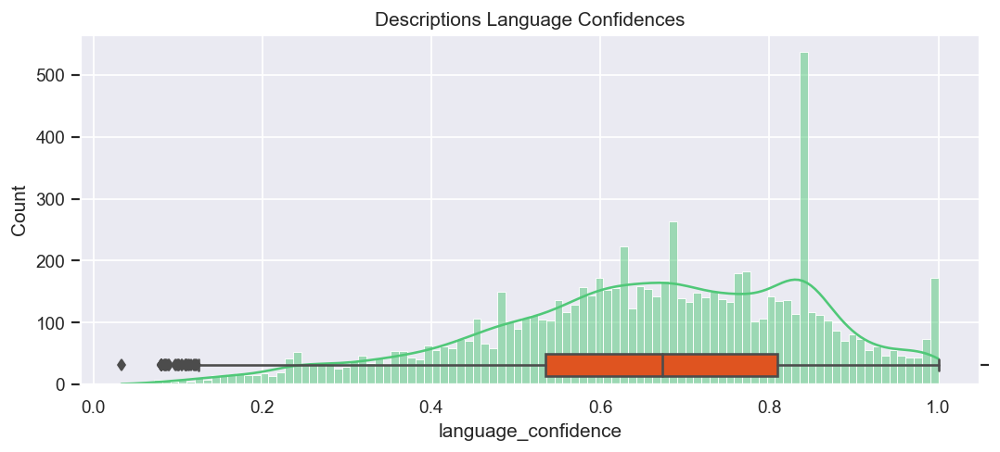

In [ ]:
sns.set()
plt.figure(figsize=(10, 4), dpi=125)
ax = sns.histplot(x=dataset.language_confidence, bins=100, kde=True, color='#50C878')
ax_ = ax.twinx()
sns.boxplot(x=dataset.language_confidence, color='#FF4500')
ax_.set(ylim=(-.7, 12))
plt.title('Descriptions Language Confidences')
plt.show()

In [ ]:
# check some predictions with less confidence
dataset[(dataset.language != 'en') & (dataset.language_confidence < 0.6)][['merged_description', 'language', 'language_confidence']]

,merged_description,language,language_confidence
4,skype error,ja,0.081046
12,unable login hr tool sgxqsuojr xwbesorf card,zh,0.104415
14,unable open payslip,fr,0.264625
20,unable check payslip,fr,0.172341
26,unable login hr tool check payslip,fr,0.151523
...,...,...,...
8413,langsamer rechner uberprufung niptbwdq,de,0.437996
8416,bluetooth keybankrd defekt dardabthyr,sv,0.245299
8426,new able login system user vvrtgwildj name joh...,de,0.547300
8435,bls bescchtungsleitstand germany error message...,de,0.505685


In [ ]:
# check some predictions with less confidence
dataset[(dataset.language != 'en') & (dataset.language_confidence > 0.6)][['merged_description', 'language', 'language_confidence']]

,merged_description,language,language_confidence
223,probleme bluescreen hallo es ist erneut passie...,de,0.997436
251,reset password bitte passwort fr mail zurckset...,de,0.861231
255,probleme mit laufwerk laeusvjo,de,0.992616
265,xd xd xd xd hallo xd xd netweaver funktioniert...,de,0.995725
270,neues passwort fur accountname tgryhu hgygrtui...,de,0.992012
...,...,...,...
8424,kann setzten ich wei mein erp passwort nicht m...,de,0.998999
8438,fur die up lapel druckt nicht richtig der druc...,de,0.999573
8466,xd send friday xd nwfodmhc exurcwkm xd subje...,de,0.957366
8470,"电脑开机开不出来 to 小贺,早上电脑开机开不出来",zh,0.924405


* We can clearly see that low confidence predictions are not right actually foreign-language but interpreted as such because of out of dictionary words and caller names present in the text. So, we overwrite predictions with confidence less than 0.6 back to english

In [ ]:
dataset.loc[(dataset.language != 'en') & (dataset.language_confidence < 0.6), 'language'] = 'en'

In [ ]:
dataset[(dataset.language != 'en') & (dataset.language_confidence < 0.6)]  # overwritten

,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,group_code,char_length_bins,cleaned_description,cleaned_short_description,cleaned_char_length,cleaned_word_length,cleaned_short_char_length,cleaned_short_word_length,merged_description,language,language_confidence


In [ ]:
dataset.language.value_counts()

en    7968
de     479
zh      32
pt       7
fr       3
fi       2
tl       2
es       2
ca       2
pl       1
it       1
Name: language, dtype: int64

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Translation using txtai pipelines which use <a href="https://huggingface.co/models?search=Helsinki-NLP%2Fopus-mt">hugging-face language translation models</a> as backend</span></strong>
</ul></h3>

In [ ]:
# Install `txtai` and all dependencies. Since this notebook is using optional pipelines
# we need to install the pipeline extras package.

# !pip -q install git+https://github.com/neuml/txtai#egg=txtai[pipeline]

In [ ]:
# The pipeline has logic to detect the input language,
# load the relevant model that handles translating from source to # target language and return results.
# The translation pipeline also has built-in logic to handle splitting large text
# blocks into smaller sections the models can handle.


from txtai.pipeline import Translation

# Create translation model
translate = Translation()

In [ ]:
# The translation quality overall is very high
# Machine translation has made giant leaps and strides the last couple of years
# These models are a solid alternative to cloud translation services if translating on local servers is preferred.

translation = translate("Bonjour, Ca va?", "en")

In [ ]:
translation

'Hello, are you okay?'

In [ ]:
def translate_foreign_langauges(row):
    original_descr = row.merged_description
    translated_descr = original_descr
    if row.language != 'en':
        if len(original_descr) > 512:
            # pre-trained models only support sequences of length < 512
            orinal_descr = original_descr[:512]
        translation = translate(original_descr, "en")
        if len(translation) > 0:
            translated_descr = translation

    row['translated_description'] = str(translated_descr.strip())
    return row

In [ ]:
translated_dataset = dataset.progress_apply(translate_foreign_langauges, axis=1)

100%|██████████| 8499/8499 [23:06<00:00,  6.13it/s]


In [ ]:
# sample translations
translated_dataset[translated_dataset.language == 'de'].sample(20)[['merged_description', 'translated_description']]

,merged_description,translated_description
5188,furth hallo unser netzwerkdrucker ag hort nich...,furth hello our network printer ag hort no lon...
4887,pc telefon buro kuffner wolfel einrichten auf ...,pc phone buro kuffner wolfel set up due to the...
1774,replizieren xd xd xd xd hallo xd xd leider rep...,replicate xd xd xd xd hello xd xd unfortunatel...
4981,rechner nach update startet nicht ewew cudgevmx,calculator after update does not start enew cu...
4962,lizenz let talk video kann nicht geoffnet werden,license let talk video can not be opened
7120,probleme mit lan ewew xwirzvda,problems with lan ewew xwirzvda
574,defekt pc der mascne r fahrt nicht mehr hoch,broken pc of the mascne r ride no longer high
7222,bitte die mascne precimat nr wieder freischa...,please unlock the mascne precimat nr xd yes un...
6796,probleme mit outlook dtlmbcrx,Problems with look dtlmbcrx
1143,redirect local document break das folgende wor...,direct local document break the following word...


In [ ]:
# sample translations
translated_dataset[translated_dataset.language == 'zh'].sample(20)[['merged_description', 'translated_description']]

,merged_description,translated_description
7316,"电脑故障 质控部拉力试验机控制电脑的操作系统启动非常缓慢,控制软件丢失。",Computer failure. Quality Control's pull-contr...
1700,"账户被锁定 用户忘记密码,导致账户锁定",The account was locked. The user forgot the pa...
6105,电脑不能开机 早上上班电脑打不开。,Computers can't turn on. Computers can't turn ...
1954,"有一个链接文件打不开 有一链接文件打不开,提示版本低",There's a link file that can't be opened. Ther...
7968,"客户提供的在线系统打不开 客户提供的在线送货单生成系统打不开,需尽快解决",The online system offered by the client cannot...
3902,"电脑无法连接公共盘,请帮我转给小贺 电脑无法连接公共盘,请帮我转给小贺","The computer can't connect to a public record,..."
5302,"报税电脑不能联网,让贺正平休。 报税电脑不能联网,让贺正平休。","Tax filing computers are not connected, so he ..."
1452,考勤系统进不去请处理谢谢! 考勤系统进不去请处理谢谢!,"If you can't get in the attendance system, ple..."
1711,"开机黑屏 电脑启动后黑屏,主机无报警",Turn on the black screen. When the computer's ...
4500,"制粉三楼控制室电脑故障 制粉三楼控制室电脑不能开启,电源指示灯桔色频闪。","The third floor control computer failed, the t..."


In [ ]:
translated_dataset.to_excel('clean_data_tranlsated.xlsx')

<h1><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Keyword Extraction</span></strong></li>
</ul></h1>

In [ ]:
import yake
import pandas as pd

dataset = pd.read_excel('clean_data_tranlsated.xlsx')

In [ ]:
language = "en"
max_ngram_size = 5
duplication_threshold = 0.9
numOfKeywords = 1

custom_kw_extractor = yake.KeywordExtractor(lan=language,
                                            n=max_ngram_size,
                                            dedupLim=duplication_threshold,
                                            top=numOfKeywords,
                                            features=None)

In [ ]:
def get_keywords(row):
    '''Keyword extraction on Keywords and Short Keywords'''
    description_keywords = custom_kw_extractor.extract_keywords(row.translated_description)
    if len(description_keywords) == 0:
        description_keywords = ''
    elif len(description_keywords) == 1:
        description_keywords = description_keywords[0][0]
    else:
        description_keywords = ' '.join([i[0] for i in description_keywords])
        # print(row)
    row['keywords'] = description_keywords

    return row

dataset = dataset.apply(get_keywords, axis=1)

In [ ]:
dataset.sample(20)

,Unnamed: 0,short_description,description,caller,group,char_length,word_length,short_char_length,short_word_length,group_code,...,cleaned_short_description,cleaned_char_length,cleaned_word_length,cleaned_short_char_length,cleaned_short_word_length,merged_description,language,language_confidence,translated_description,keywords
7270,7270,windows disk space utilization alert for :: H...,windows disk space utilization alert for :: H...,uxgrdjfc kqxdjeov,GRP_12,66,9,58,8,4,...,windows disk space utilization alert hostname,49,7,45,6,windows disk space utilization alert hostname xd,en,0.307107,windows disk space utilization alert hostname xd,windows disk space utilization alert
1586,1586,engineering_tool not working,engineering_tool not working,gpdywmbt pmxfiqkl,GRP_0,29,3,29,3,0,...,engineering tool work,21,3,21,3,engineering tool work,en,0.905497,engineering tool work,engineering tool work
1418,1418,need access to vpn,need access to vpn computer name-lcvl7406035,txjwyami fhlgpsim,GRP_34,44,6,19,4,28,...,need access vpn,34,6,15,3,need access vpn computer name lcvl,en,0.761162,need access vpn computer name lcvl,access vpn computer name lcvl
5510,5510,ess password reset,ess password reset,umkrenhp beldshqc,GRP_0,18,3,18,3,0,...,ess password reset,18,3,18,3,ess password reset,en,0.433673,ess password reset,ess password reset
5496,5496,doing engineering_tool advance search material...,i picked titanium tial 6 4v but then p5 materi...,kgqpwvzu rkexzwlh,GRP_25,191,38,92,15,18,...,engineering tool advance search material group...,113,19,65,9,engineering tool advance group select pick tit...,en,0.842578,engineering tool advance group select pick tit...,engineering tool advance group select
1699,1699,error login on to the mii system.,error login on to the mii system._x000D_\n-ver...,ikxrlnvu cujyriwh,GRP_0,217,30,33,7,0,...,error login mii system,122,22,22,4,error login mii system xd verify user detail n...,en,0.592368,error login mii system xd verify user detail n...,error login mii system
510,510,"usa file server, HostName_1326, has failed har...","usa file server, HostName_1326, has failed har...",xweclugf qmhbjsyi,GRP_12,53,8,53,8,4,...,usa file server hostname fail hard drive,41,7,41,7,usa file server hostname fail hard drive,en,0.503291,usa file server hostname fail hard drive,usa file server hostname fail
2960,2960,job Job_593 failed in job_scheduler at: 09/28/...,received from: monitoring_tool@company.com_x00...,bpctwhsn kzqsbmtp,GRP_8,117,12,61,8,72,...,job job fail job scheduler,33,7,27,5,xd xd job job fail job scheduler,en,0.840205,xd xd job job fail job scheduler,job job fail job scheduler
8254,8254,abended job in job_scheduler: Job_481,received from: monitoring_tool@company.com_x00...,ZkBogxib QsEJzdZO,GRP_5,117,12,37,5,45,...,abende job job scheduler job,34,7,28,5,xd xd abende job job scheduler job,en,0.688531,xd xd abende job job scheduler job,abende job job scheduler job
5541,5541,po - a4 4505633620,"hello it,_x000D_\n_x000D_\nthere are 3 item l...",bejcxvis anxmhwis,GRP_29,145,25,18,4,22,...,po a,63,12,4,2,xd xd item link finished material one time s...,en,0.546790,xd xd item link finished material one time s...,item link finished material


In [ ]:
dataset.columns

Index(['Unnamed: 0', 'short_description', 'description', 'caller', 'group',
       'char_length', 'word_length', 'short_char_length', 'short_word_length',
       'group_code', 'char_length_bins', 'cleaned_description',
       'cleaned_short_description', 'cleaned_char_length',
       'cleaned_word_length', 'cleaned_short_char_length',
       'cleaned_short_word_length', 'merged_description', 'language',
       'language_confidence', 'translated_description', 'keywords'],
      dtype='object')

In [ ]:
cols = ['translated_description', 'keywords',
       'short_description', 'description', 'group',
       'cleaned_description', 'cleaned_short_description', 'merged_description',
       'char_length', 'word_length', 'short_char_length', 'short_word_length',
       'language', 'language_confidence',]

In [ ]:
dataset.to_csv('preprocessed_data.csv', index=None, columns=cols)
dataset.to_excel('preprocessed_data.xlsx', index=None, columns=cols)

<h3><ul>
    <li><strong><span style="font-family: 'Trebuchet MS', Helvetica, sans-serif;">Import & Analyse the data.</span></strong></li>
</ul></h3>

In [ ]:
dataset = pd.read_excel('preprocessed_data.xlsx')
dataset.sample(10)

,translated_description,keywords,short_description,description,group,cleaned_description,cleaned_short_description,merged_description,char_length,word_length,short_char_length,short_word_length,language,language_confidence
8403,xd xd xd xd look pathryu etasthon skype type n...,hhnght name beside xd nvamcrpq,skype,_x000D_\n_x000D_\nreceived from: lpoebzsc.grkn...,GRP_0,xd xd xd xd look pathryu etasthon skype type n...,skype,xd xd xd xd look pathryu etasthon skype type n...,520,80,5,1,en,0.693415
7869,use connection intermittent use desk call skyp...,desk call skype cell phone,"when using phone, connection is intermittent. ...",my cell phone is \nother people at jc have com...,GRP_4,cell phone people jc complain tng,use phone connection intermittent use desk pho...,use connection intermittent use desk call skyp...,74,14,98,15,en,0.700994
28,unable login hr tool,unable login hr tool,unable to login to hr_tool,unable to login to hr_tool,GRP_0,unable login hr tool,unable login hr tool,unable login hr tool,26,5,26,5,en,0.212741
7388,issue attachment outlook,issue attachment outlook,issues with attachments on outlook,issues with attachments on outlook,GRP_0,issue attachment outlook,issue attachment outlook,issue attachment outlook,35,5,35,5,en,0.861928
2369,sale org germany office move main inwarehouse ...,dunning need clearly trace,update inwarehouse_tool documents from list fo...,with the germany office move the main inwareho...,GRP_13,germany office move main inwarehouse tool prin...,update inwarehouse tool document list sale org,sale org germany office move main inwarehouse ...,1526,250,80,12,en,0.757936
1376,help item add company center account ac...,acently delete order section restore,company center accounts added- help with a del...,please add to my company center accounts 81543...,GRP_21,add company center account account ace...,company center account add help delete item,help item add company center account ac...,184,21,55,9,en,0.865865
5942,recognize try enter hr tool site enter email a...,address change windows version upgrade,hr_tool site will not recognize email address ...,"tried entering into hr_tool site, but cannot e...",GRP_0,try enter hr tool site enter email address cha...,hr tool site recognize email address window u...,recognize try enter hr tool site enter email a...,142,24,73,11,en,0.827601
1945,dpozkmie vjuybcwz erp xd xd xd xd unlock accou...,dpozkmie vjuybcwz erp,dpozkmie vjuybcwz 27367 erp account locked,_x000D_\n_x000D_\nreceived from: boithdfa.tojw...,GRP_0,xd xd xd xd unlock account xd xd,dpozkmie vjuybcwz erp account lock,dpozkmie vjuybcwz erp xd xd xd xd unlock accou...,112,10,42,6,en,0.213037
6740,monitor orientation error,monitor orientation error,monitor orientation error,monitor orientation error,GRP_0,monitor orientation error,monitor orientation error,monitor orientation error,25,3,25,3,en,0.416276
5906,xd xd job job fail job scheduler,job job fail job scheduler,job Job_549 failed in job_scheduler at: 08/29/...,received from: monitoring_tool@company.com_x00...,GRP_8,xd xd job job fail job scheduler,job job fail job scheduler,xd xd job job fail job scheduler,117,12,61,8,en,0.840205


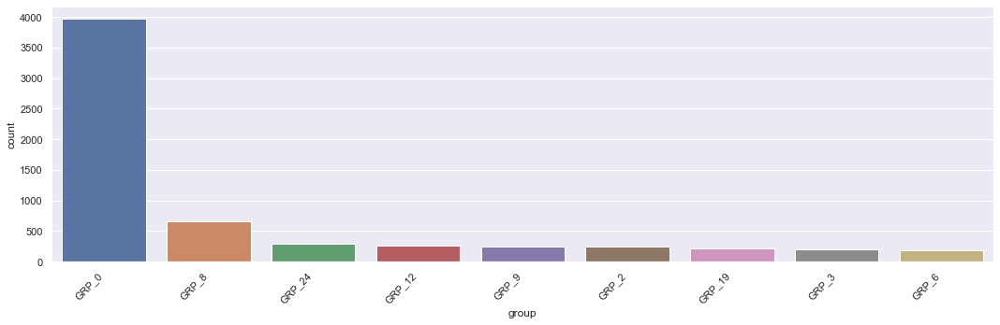

In [ ]:
descending_order = dataset['group'].value_counts().sort_values(ascending=False).head(9).index
plt.subplots(figsize=(15,5))
ax=sns.countplot(x='group', data=dataset,order=descending_order)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha="right")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
dataset = pd.read_excel('preprocessed_data.xlsx')
dataset.sample(5)

,translated_description,keywords,short_description,description,group,cleaned_description,cleaned_short_description,merged_description,char_length,word_length,short_char_length,short_word_length,language,language_confidence
2094,germany eu deu erkheim dmvpn rtr since type ou...,contact tifie remote dialin equipment,circuit outage:germany: company-eu-deu-erkheim...,what type of outage: _____network __x___c...,GRP_8,type outagenetworkxcircuitpower specify type o...,circuit outage germany company eu deu erkheim ...,germany eu deu erkheim dmvpn rtr since type ou...,1319,154,105,11,en,0.625221
7504,unable open outlook ess due bad password,unable open outlook ess due,unable to open outlook and ess due to bad pass...,unable to open outlook and ess due to bad pass...,GRP_0,unable open outlook ess due bad password,unable open outlook ess due bad password,unable open outlook ess due bad password,50,10,50,10,en,0.617220
6954,unable scroll ie page,unable scroll ie page,unable to scroll down ie pages,unable to scroll down ie pages,GRP_0,unable scroll ie page,unable scroll ie page,unable scroll ie page,30,6,30,6,en,0.548359
7999,xd xd abende job job scheduler bkbackup tool h...,scheduler bkbackup tool hostname prod,abended job in job_scheduler: bkbackup_tool_Ho...,received from: monitoring_tool@company.com_x00...,GRP_5,xd xd abende job job scheduler bkbackup tool h...,abende job job scheduler bkbackup tool hostnam...,xd xd abende job job scheduler bkbackup tool h...,145,12,65,5,en,0.531494
5004,account lock ad,account lock,account locked in ad,account locked in ad,GRP_0,account lock ad,account lock ad,account lock ad,20,4,20,4,en,0.690513


In [ ]:
df = dataset[['translated_description','group']].copy()
df.shape

(8499, 2)

## Target Class Balancing

In [ ]:
#Classes with atleast 3% rep
classes=[]
for val in df['group'].unique():
    if len(df[df['group'] == val]) >= (df.shape[0]*0.03):
        #print(val)
        classes.append(val)

major =df[df['group'].isin(classes)]
major['group'].value_counts()

GRP_0     3975
GRP_8      661
GRP_24     289
GRP_12     257
Name: group, dtype: int64

We have 4 groups out of 74, that have more than 3% distribution atleast.

In [ ]:
minor = df[~df['group'].isin(classes)]
minor['group'].value_counts()

GRP_9     252
GRP_2     241
GRP_19    215
GRP_3     200
GRP_6     184
         ... 
GRP_73      1
GRP_61      1
GRP_70      1
GRP_67      1
GRP_64      1
Name: group, Length: 70, dtype: int64

In [ ]:
#Getting the best match for minor classes & replacing with major group values
for ind in minor.index:
  res = process.extractOne(minor['translated_description'][ind],major['translated_description'] , scorer=fuzz.token_sort_ratio)
  minor.loc[minor.index==ind, 'group']=(major[major.index == res[2]]['group']).to_string(index=False)


In [ ]:
#Groups distribution right after Fuzzy method
minor['group'].value_counts()

 GRP_0     2347
 GRP_8      661
 GRP_12     230
 GRP_24      79
Name: group, dtype: int64

In [ ]:
Main_df = pd.concat([major, minor], ignore_index=True)
Main_df.replace(r"^ +| +$", r"", regex=True, inplace=True)
Main_df['group'].value_counts()

GRP_0     6322
GRP_8     1322
GRP_12     487
GRP_24     368
Name: group, dtype: int64

We have removed all leading, ending whitespaces in the dataframe
And final distribution with 4 as target classes.

In [ ]:
#Saving dataframe
Main_df.to_excel("preprocessed_data_withFuzzyWuzzy.xlsx")

Upsamling the least represented classes (the 2 from bottom)

In [ ]:
df_majority = Main_df.loc[(Main_df['group'] == 'GRP_0') | (Main_df['group'] == 'GRP_8')]
df_minority = Main_df.loc[(Main_df['group'] == 'GRP_12') | (Main_df['group'] == 'GRP_24')]

In [ ]:
# Treat the imbalnce in the original dataset by resampling to 661
from sklearn.utils import resample
df_minority_resampled = df_minority [0:0]
for grp in df_minority ['group'].unique():
    temp = df_minority[df_minority['group'] == grp]
    resampled = resample(temp, replace=True, n_samples=int(1322), random_state=7)
    df_minority_resampled = df_minority_resampled.append(resampled)

df_minority_resampled['group'].value_counts()


GRP_24    1322
GRP_12    1322
Name: group, dtype: int64

In [ ]:
# Combine majority class with upsampled minority class
df_upsampled = pd.concat([df_majority, df_minority_resampled])
df_upsampled['group'].value_counts()

GRP_0     6322
GRP_8     1322
GRP_12    1322
GRP_24    1322
Name: group, dtype: int64

In [ ]:
#df_upsampled.to_excel("preprocessed_upsampled_minorclasses.xlsx")
df_upsampled = pd.read_excel("preprocessed_upsampled_minorclasses.xlsx")

In [ ]:
from sklearn.preprocessing import LabelEncoder
lb = LabelEncoder()
df_upsampled['group'] = lb.fit_transform(df_upsampled['group'])

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from gensim.models import Word2Vec
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.layers import Dense, Input, LSTM, Embedding, Dropout, Activation, Flatten, Bidirectional, GlobalMaxPool1D,GRU,Conv1D,MaxPooling1D
from tensorflow.keras.models import Model, Sequential
import tensorflow as tf
from sklearn import metrics
from tensorflow.keras import backend as K
import matplotlib.pyplot as plt
from tensorflow.keras.utils import plot_model
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import Embedding
from sklearn.preprocessing import OneHotEncoder

# Traditional Modeling
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer, TfidfTransformer
from sklearn.svm import SVC, LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, classification_report, auc
from sklearn.metrics import roc_curve, accuracy_score, precision_recall_curve

In [ ]:
numWords=9000
tokenizer = Tokenizer(num_words=numWords, split=' ', lower=True) 
tokenizer.fit_on_texts(df_upsampled['translated_description'].values)
X = tokenizer.texts_to_sequences(df_upsampled['translated_description'].values)
X = pad_sequences(X)

Train - Test split

In [ ]:
y = df_upsampled['group']
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.4, random_state = 7)
dsModelSummary = pd.DataFrame(columns = ['Model Type', 'Train Acc', 'Test Acc','Train F1', 'Test F1'])

##### Traditional Machine Learning Models

LogisticRegression

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score

lr = LogisticRegression() # Define classifier
lr.fit(X_train, y_train) # Train model

# Make predictions
y_train_pred = lr.predict(X_train)
y_test_pred = lr.predict(X_test)

# Training set performance
train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set performance
test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

train_accuracy = float(np.round(train_accuracy, 2))
train_f1 = float(np.round(train_f1, 2))

test_accuracy = float(np.round(test_accuracy, 2))
test_f1 = float(np.round(test_f1, 2))

dsModelSummary = dsModelSummary.append({'Model Type' : 'LR', 'Train Acc' : train_accuracy,'Test Acc' : test_accuracy,'Train F1' : train_f1,'Test F1' : test_f1}, ignore_index = True)

KNeighborsClassifier

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score

knn = KNeighborsClassifier() # Define classifier
knn.fit(X_train, y_train) # Train model

# Make predictions
y_train_pred = knn.predict(X_train)
y_test_pred = knn.predict(X_test)

# Training set performance
train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set performance
test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

train_accuracy = float(np.round(train_accuracy, 2))
train_f1 = float(np.round(train_f1, 2))

test_accuracy = float(np.round(test_accuracy, 2))
test_f1 = float(np.round(test_f1, 2))

dsModelSummary = dsModelSummary.append({'Model Type' : 'KNN', 'Train Acc' : train_accuracy,'Test Acc' : test_accuracy,'Train F1' : train_f1,'Test F1' : test_f1}, ignore_index = True)

SVC

In [ ]:
from sklearn.svm import SVC

svm_rbf = SVC(gamma=2, C=1)
svm_rbf.fit(X_train, y_train)

# Make predictions
y_train_pred = svm_rbf.predict(X_train)
y_test_pred = svm_rbf.predict(X_test)

# Training set performance
train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set performance
test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

train_accuracy = float(np.round(train_accuracy, 2))
train_f1 = float(np.round(train_f1, 2))

test_accuracy = float(np.round(test_accuracy, 2))
test_f1 = float(np.round(test_f1, 2))

dsModelSummary = dsModelSummary.append({'Model Type' : 'SVM RBF', 'Train Acc' : train_accuracy,'Test Acc' : test_accuracy,'Train F1' : train_f1,'Test F1' : test_f1}, ignore_index = True)

DecisionTreeClassifier

In [ ]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(max_depth=25) # Define classifier
dt.fit(X_train, y_train) # Train model

# Make predictions
y_train_pred = dt.predict(X_train)
y_test_pred = dt.predict(X_test)

# Training set performance
train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set performance
test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

train_accuracy = float(np.round(train_accuracy, 2))
train_f1 = float(np.round(train_f1, 2))

test_accuracy = float(np.round(test_accuracy, 2))
test_f1 = float(np.round(test_f1, 2))

dsModelSummary = dsModelSummary.append({'Model Type' : 'DT', 'Train Acc' : train_accuracy,'Test Acc' : test_accuracy,'Train F1' : train_f1,'Test F1' : test_f1}, ignore_index = True)

RandomForestClassifier

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=10) # Define classifier
rf.fit(X_train, y_train) # Train model

# Make predictions
y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)

# Training set performance
train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set performance
test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

train_accuracy = float(np.round(train_accuracy, 2))
train_f1 = float(np.round(train_f1, 2))

test_accuracy = float(np.round(test_accuracy, 2))
test_f1 = float(np.round(test_f1, 2))

dsModelSummary = dsModelSummary.append({'Model Type' : 'RF', 'Train Acc' : train_accuracy,'Test Acc' : test_accuracy,'Train F1' : train_f1,'Test F1' : test_f1}, ignore_index = True)

xgboost 

In [ ]:
import xgboost as xgb
xgb = xgb.XGBClassifier() # Define classifier
xgb.fit(X_train, y_train) # Train model

# Make predictions
y_train_pred = xgb.predict(X_train)
y_test_pred = xgb.predict(X_test)

# Training set performance
train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set performance
test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

train_accuracy = float(np.round(train_accuracy, 2))
train_f1 = float(np.round(train_f1, 2))

test_accuracy = float(np.round(test_accuracy, 2))
test_f1 = float(np.round(test_f1, 2))

dsModelSummary = dsModelSummary.append({'Model Type' : 'XGBoost', 'Train Acc' : train_accuracy,'Test Acc' : test_accuracy,'Train F1' : train_f1,'Test F1' : test_f1}, ignore_index = True)

GradientBoostingClassifier

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

gb = GradientBoostingClassifier() # Define classifier
gb.fit(X_train, y_train) # Train model

# Make predictions
y_train_pred = gb.predict(X_train)
y_test_pred = gb.predict(X_test)

# Training set performance
train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set performance
test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

train_accuracy = float(np.round(train_accuracy, 2))
train_f1 = float(np.round(train_f1, 2))

test_accuracy = float(np.round(test_accuracy, 2))
test_f1 = float(np.round(test_f1, 2))

dsModelSummary = dsModelSummary.append({'Model Type' : 'GradientBoosting', 'Train Acc' : train_accuracy,'Test Acc' : test_accuracy,'Train F1' : train_f1,'Test F1' : test_f1}, ignore_index = True)

LGBMClassifier

In [ ]:
import lightgbm as lgb

lgb = lgb.LGBMClassifier() # Define classifier
lgb.fit(X_train, y_train) # Train model

# Make predictions
y_train_pred = lgb.predict(X_train)
y_test_pred = lgb.predict(X_test)

# Training set performance
train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set performance
test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

train_accuracy = float(np.round(train_accuracy, 2))
train_f1 = float(np.round(train_f1, 2))

test_accuracy = float(np.round(test_accuracy, 2))
test_f1 = float(np.round(test_f1, 2))

dsModelSummary = dsModelSummary.append({'Model Type' : 'LightGBM', 'Train Acc' : train_accuracy,'Test Acc' : test_accuracy,'Train F1' : train_f1,'Test F1' : test_f1}, ignore_index = True)

Scores summary

In [ ]:
dsModelSummary

,Model Type,Train Acc,Test Acc,Train F1,Test F1
0,LR,0.59,0.58,0.55,0.53
1,KNN,0.84,0.77,0.84,0.77
2,SVM RBF,1.00,0.92,1.00,0.91
3,DT,1.00,0.87,1.00,0.87
4,RF,0.99,0.92,0.99,0.92
5,XGBoost,0.84,0.83,0.83,0.81
6,GradientBoosting,0.89,0.86,0.89,0.85
7,LightGBM,0.99,0.93,0.99,0.93


StackingClassifier

In [ ]:
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

# Create Base Learners
base_learners = [
                 ('SVM', svm_rbf),
                 ('KNN', knn)             
                ]

# Initialize Stacking Classifier with the Meta Learner
clf = StackingClassifier(estimators=base_learners, final_estimator=LogisticRegression())

# Extract score
clf.fit(X_train, y_train)
print("Stacking - Single Layer")
print("Base Learners: KNN + SVM RBF")
print("Final estimator: LR")
print("*"*25)
print("Train score:",np.round(clf.score(X_train, y_train),2))
print("Test score:",np.round(clf.score(X_test, y_test),2))
print("*"*25)

Stacking - Single Layer
Base Learners: KNN + SVM RBF
Final estimator: LR
*************************
Train score: 0.98
Test score: 0.91
*************************


In [ ]:
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier


# Create Learners per layer
layer_one_estimators = [
                        ('KNN', knn),
                        ('SVM rbf', svm_rbf)             
                       ]
layer_two_estimators = [
                        ('dt', dt),
                        ('rf', rf)
                       ]
layer_two = StackingClassifier(estimators=layer_two_estimators, final_estimator=LogisticRegression())

# Create Final model by 
clf = StackingClassifier(estimators=layer_one_estimators, final_estimator=layer_two)

# Extract score
clf.fit(X_train, y_train)
print("Stacking - Multi Layer")
print("Base Learners: ")
print("Layer1: KNN + SVM RBF")
print("Layer2: DT + RF")
print("Final estimator: LR")
print("*"*25)
print("Train score:",np.round(clf.score(X_train, y_train),2))
print("Test score:",np.round(clf.score(X_test, y_test),2))
print("*"*25)

Stacking - Multi Layer
Base Learners: 
Layer1: KNN + SVM RBF
Layer2: DT + RF
Final estimator: LR
*************************
Train score: 0.87
Test score: 0.82
*************************


Using Cross-validation

In [ ]:
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from matplotlib import pyplot

In [ ]:
# get a list of models to evaluate
def get_models():
	models = dict()
	models['lr'] = LogisticRegression()
	models['knn'] = KNeighborsClassifier()
	models['DT'] = DecisionTreeClassifier()
	models['svm'] = SVC()
	models['bayes'] = GaussianNB()
	return models

>lr 0.590 (0.010)
>knn 0.798 (0.010)
>DT 0.896 (0.013)
>svm 0.713 (0.008)
>bayes 0.158 (0.004)


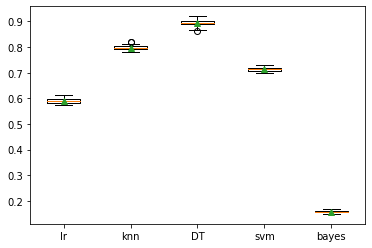

In [ ]:
# evaluate a given model using cross-validation
def evaluate_model(model, X, y):
	cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
	scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
	return scores
 
# get the models to evaluate
models = get_models()
# evaluate the models and store results
results, names = list(), list()
for name, model in models.items():
	scores = evaluate_model(model, X, y)
	results.append(scores)
	names.append(name)
	print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))
# plot model performance for comparison
pyplot.boxplot(results, labels=names, showmeans=True)
pyplot.show()

In [ ]:
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import StackingClassifier
from matplotlib import pyplot
 
# get a stacking ensemble of models
def get_stacking():
	# define the base models
	level0 = list()
	level0.append(('lr', LogisticRegression()))
	level0.append(('knn', KNeighborsClassifier()))
	level0.append(('cart', DecisionTreeClassifier()))
	level0.append(('svm', SVC()))
	level0.append(('bayes', GaussianNB()))
	# define meta learner model
	level1 = LogisticRegression()
	# define the stacking ensemble
	model = StackingClassifier(estimators=level0, final_estimator=level1, cv=5)
	return model

# get a list of models to evaluate
def get_models():
	models = dict()
	models['lr'] = LogisticRegression()
	models['knn'] = KNeighborsClassifier()
	models['dt'] = DecisionTreeClassifier()
	models['svm'] = SVC()
	models['bayes'] = GaussianNB()
	models['stacking'] = get_stacking()
	return models
 
# evaluate a give model using cross-validation
def evaluate_model(model, X, y):
	cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
	scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
	return scores

>lr 0.590 (0.010)
>knn 0.798 (0.010)
>dt 0.898 (0.014)
>svm 0.713 (0.008)
>bayes 0.158 (0.004)
>stacking 0.925 (0.009)


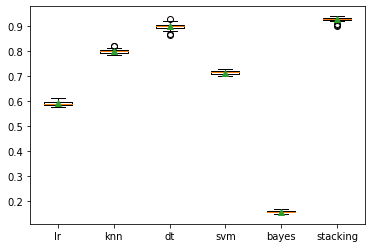

In [ ]:
models = get_models()
# evaluate the models and store results
results, names = list(), list()
for name, model in models.items():
	scores = evaluate_model(model, X, y)
	results.append(scores)
	names.append(name)
	print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))
# plot model performance for comparison
pyplot.boxplot(results, labels=names, showmeans=True)
pyplot.show()

In [ ]:
#Grid modules
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

### Hypertuning

In [ ]:
dsModelSummary = pd.DataFrame(columns = ['Model Type', 'Train Acc', 'Test Acc','Train F1', 'Test F1'])

LogisticRegression

In [ ]:
param_grid = {'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
             'penalty' : ['l1', 'l2'],
              'solver':['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']}
clf = GridSearchCV(LogisticRegression(), param_grid,verbose=True)

clf.fit(X_train, y_train)

Fitting 5 folds for each of 70 candidates, totalling 350 fits


GridSearchCV(estimator=LogisticRegression(),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
                         'penalty': ['l1', 'l2'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag',
                                    'saga']},
             verbose=True)

In [ ]:
clf.best_params_

{'C': 0.001, 'penalty': 'l2', 'solver': 'liblinear'}

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score

lr = LogisticRegression(C=0.001,penalty= 'l2', solver='liblinear') # Define classifier
lr.fit(X_train, y_train) # Train model

# Make predictions
y_train_pred = lr.predict(X_train)
y_test_pred = lr.predict(X_test)

# Training set performance
train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set performance
test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

train_accuracy = float(np.round(train_accuracy, 2))
train_f1 = float(np.round(train_f1, 2))

test_accuracy = float(np.round(test_accuracy, 2))
test_f1 = float(np.round(test_f1, 2))

dsModelSummary = dsModelSummary.append({'Model Type' : 'LR', 'Train Acc' : train_accuracy,'Test Acc' : test_accuracy,'Train F1' : train_f1,'Test F1' : test_f1}, ignore_index = True)

In [ ]:
dsModelSummary

,Model Type,Train Acc,Test Acc,Train F1,Test F1
0,LR,0.64,0.62,0.55,0.53


In [ ]:
from sklearn.metrics import classification_report
#print classification report
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       0.63      0.94      0.75      2542
           1       0.53      0.13      0.21       516
           2       0.42      0.13      0.20       513
           3       0.72      0.06      0.11       545

    accuracy                           0.62      4116
   macro avg       0.57      0.31      0.32      4116
weighted avg       0.60      0.62      0.53      4116



DecisionTreeClassifier

In [ ]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [2, 3, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'criterion': ["gini", "entropy"]
}
dt=DecisionTreeClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator=dt, 
                           param_grid=params, 
                           cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")
grid_search.fit(X_train, y_train)
grid_search.best_estimator_

Fitting 4 folds for each of 50 candidates, totalling 200 fits


DecisionTreeClassifier(max_depth=20, min_samples_leaf=5)

In [ ]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(criterion='entropy',max_depth=20,min_samples_leaf=5)
dt.fit(X_train, y_train) # Train model

# Make predictions
y_train_pred = dt.predict(X_train)
y_test_pred = dt.predict(X_test)

# Training set performance
train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set performance
test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

train_accuracy = float(np.round(train_accuracy, 2))
train_f1 = float(np.round(train_f1, 2))

test_accuracy = float(np.round(test_accuracy, 2))
test_f1 = float(np.round(test_f1, 2))

dsModelSummary = dsModelSummary.append({'Model Type' : 'DT', 'Train Acc' : train_accuracy,'Test Acc' : test_accuracy,'Train F1' : train_f1,'Test F1' : test_f1}, ignore_index = True)

In [ ]:
dsModelSummary

,Model Type,Train Acc,Test Acc,Train F1,Test F1
0,LR,0.64,0.62,0.55,0.53
1,DT,0.93,0.84,0.93,0.84


In [ ]:
from sklearn.metrics import classification_report
#print classification report
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       0.88      0.89      0.88      2542
           1       0.64      0.65      0.64       516
           2       0.77      0.79      0.78       513
           3       0.91      0.84      0.88       545

    accuracy                           0.84      4116
   macro avg       0.80      0.79      0.80      4116
weighted avg       0.84      0.84      0.84      4116



AdaBoost

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier

In [ ]:
param_grid = {"base_estimator__criterion" : ["gini", "entropy"],
              "base_estimator__splitter" :   ["best", "random"],
              "n_estimators": [1, 2]
             }


DTC = DecisionTreeClassifier(random_state = 7, max_features = "auto", class_weight = "balanced",max_depth = None)
ABC = AdaBoostClassifier(base_estimator = DTC)

# run grid search
grid_search_ABC = GridSearchCV(ABC, param_grid=param_grid, scoring = 'accuracy')
grid_search_ABC.fit(X_train, y_train)
grid_search_ABC.best_estimator_

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(class_weight='balanced',
                                                         criterion='entropy',
                                                         max_features='auto',
                                                         random_state=7),
                   n_estimators=2)

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

AdaBst = AdaBoostClassifier( base_estimator=DecisionTreeClassifier(class_weight='balanced',
                                                         criterion='entropy',
                                                         max_features='auto',
                                                         random_state=7,
                                                         splitter='random'),    
                            n_estimators=2,
                            learning_rate=1.0,
                            random_state=7)
AdaBst.fit(X_train, y_train) # Train model

# Make predictions
y_train_pred = AdaBst.predict(X_train)
y_test_pred = AdaBst.predict(X_test)

# Training set performance
train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set performance
test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

train_accuracy = float(np.round(train_accuracy, 2))
train_f1 = float(np.round(train_f1, 2))

test_accuracy = float(np.round(test_accuracy, 2))
test_f1 = float(np.round(test_f1, 2))

dsModelSummary = dsModelSummary.append({'Model Type' : 'AdaBoost', 'Train Acc' : train_accuracy,'Test Acc' : test_accuracy,'Train F1' : train_f1,'Test F1' : test_f1}, ignore_index = True)

In [ ]:
dsModelSummary 

,Model Type,Train Acc,Test Acc,Train F1,Test F1
0,LR,0.64,0.62,0.55,0.53
1,DT,0.93,0.84,0.93,0.84
2,AdaBoost,1.00,0.92,1.00,0.91


RandomForestClassifier

In [ ]:
from scipy.stats import randint as sp_randint
# specify parameters and distributions to sample from
param_dist = {"max_depth": [3,4,5],
              "n_estimators" : [5,10,15,20,30,40,50],
              "max_features": np.arange(1, 11),
              "min_samples_split": np.arange(2, 11),
              "min_samples_leaf": np.arange(1, 11),
              "bootstrap": [True, False],
              "criterion": ["gini", "entropy"]}
# build a classifier
clf = RandomForestClassifier(n_estimators=50)

# run randomized search
samples = 10  # number of random samples 
randomCV = GridSearchCV(clf, param_grid=param_dist, cv=5,scoring = "accuracy") #default cv = 3

randomCV.fit(X_train,y_train)

print(randomCV.best_params_)

{'bootstrap': False, 'criterion': 'entropy', 'max_depth': 5, 'max_features': 7, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 5}


In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(  n_estimators = 5,
                                    criterion='entropy',
                                    max_depth=5,
                                    min_samples_split=2,
                                    min_samples_leaf=2,                                
                                    max_features=7,
                                    bootstrap=False,
                                    ) # Define classifier
rf.fit(X_train, y_train) # Train model

# Make predictions
y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)

# Training set performance
train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set performance
test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

train_accuracy = float(np.round(train_accuracy, 2))
train_f1 = float(np.round(train_f1, 2))

test_accuracy = float(np.round(test_accuracy, 2))
test_f1 = float(np.round(test_f1, 2))

dsModelSummary = dsModelSummary.append({'Model Type' : 'RF', 'Train Acc' : train_accuracy,'Test Acc' : test_accuracy,'Train F1' : train_f1,'Test F1' : test_f1}, ignore_index = True)

In [ ]:
dsModelSummary

,Model Type,Train Acc,Test Acc,Train F1,Test F1
0,LR,0.64,0.62,0.55,0.53
1,DT,0.93,0.84,0.93,0.84
2,AdaBoost,1.00,0.92,1.00,0.91
3,RF,0.62,0.62,0.49,0.49


NeighborsClassifier

In [ ]:
#List Hyperparameters that we want to tune.
leaf_size = list(range(1,50))
n_neighbors = list(range(1,30))
p=[1,2]
#Convert to dictionary
hyperparameters = dict(leaf_size=leaf_size, n_neighbors=n_neighbors, p=p)
#Create new KNN object
KNN_2 = KNeighborsClassifier()
#Use GridSearch
clf = GridSearchCV(KNN_2, hyperparameters, cv=10)
#Fit the model
best_model = clf.fit(X_train, y_train)
#Print The value of best Hyperparameters
print('Best leaf_size:', best_model.best_estimator_.get_params()['leaf_size'])
print('Best p:', best_model.best_estimator_.get_params()['p'])
print('Best n_neighbors:', best_model.best_estimator_.get_params()['n_neighbors'])

Best leaf_size: 1
Best p: 1
Best n_neighbors: 1


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score

knn = KNeighborsClassifier(n_neighbors=3,p=1,leaf_size=1) # Define classifier
knn.fit(X_train, y_train) # Train model

# Make predictions
y_train_pred = knn.predict(X_train)
y_test_pred = knn.predict(X_test)

# Training set performance
train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set performance
test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

train_accuracy = float(np.round(train_accuracy, 2))
train_f1 = float(np.round(train_f1, 2))

test_accuracy = float(np.round(test_accuracy, 2))
test_f1 = float(np.round(test_f1, 2))

dsModelSummary = dsModelSummary.append({'Model Type' : 'KNN', 'Train Acc' : train_accuracy,'Test Acc' : test_accuracy,'Train F1' : train_f1,'Test F1' : test_f1}, ignore_index = True)

In [ ]:
dsModelSummary

,Model Type,Train Acc,Test Acc,Train F1,Test F1
0,LR,0.64,0.62,0.55,0.53
1,DT,0.93,0.84,0.93,0.84
2,AdaBoost,1.00,0.92,1.00,0.91
3,RF,0.62,0.62,0.49,0.49
4,KNN,0.90,0.82,0.90,0.82


In [ ]:
from sklearn.metrics import classification_report
#print classification report
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       0.88      0.84      0.86      2542
           1       0.64      0.65      0.64       516
           2       0.74      0.84      0.79       513
           3       0.78      0.82      0.80       545

    accuracy                           0.82      4116
   macro avg       0.76      0.79      0.77      4116
weighted avg       0.82      0.82      0.82      4116



GradientBoosting

In [ ]:
# grid searching key hyperparameters for gradient boosting
model = GradientBoostingClassifier()
# define the grid of values to search
grid = dict()
grid['n_estimators'] = [10, 20, 30, 40, 50]
grid['max_depth'] = [3, 7, 9]
# define the evaluation procedure
cv=3
# define the grid search procedure
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy')
# execute the grid search
grid_result = grid_search.fit(X_train, y_train)
# summarize the best score and configuration
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
# summarize all scores that were evaluated
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.917044 using {'max_depth': 9, 'n_estimators': 50}
0.762961 (0.007360) with: {'max_depth': 3, 'n_estimators': 10}
0.784671 (0.007773) with: {'max_depth': 3, 'n_estimators': 20}
0.798444 (0.003919) with: {'max_depth': 3, 'n_estimators': 30}
0.807193 (0.005040) with: {'max_depth': 3, 'n_estimators': 40}
0.818374 (0.002271) with: {'max_depth': 3, 'n_estimators': 50}
0.841543 (0.007908) with: {'max_depth': 7, 'n_estimators': 10}
0.877349 (0.002813) with: {'max_depth': 7, 'n_estimators': 20}
0.890310 (0.004412) with: {'max_depth': 7, 'n_estimators': 30}
0.901652 (0.002278) with: {'max_depth': 7, 'n_estimators': 40}
0.907971 (0.003936) with: {'max_depth': 7, 'n_estimators': 50}
0.873624 (0.005527) with: {'max_depth': 9, 'n_estimators': 10}
0.901814 (0.004898) with: {'max_depth': 9, 'n_estimators': 20}
0.907971 (0.004093) with: {'max_depth': 9, 'n_estimators': 30}
0.914128 (0.004971) with: {'max_depth': 9, 'n_estimators': 40}
0.917044 (0.003347) with: {'max_depth': 9, 'n_estimators': 5

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

gb = GradientBoostingClassifier(max_depth= 9, n_estimators=50) # Define classifier
gb.fit(X_train, y_train) # Train model

# Make predictions
y_train_pred = gb.predict(X_train)
y_test_pred = gb.predict(X_test)

# Training set performance
train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set performance
test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

train_accuracy = float(np.round(train_accuracy, 2))
train_f1 = float(np.round(train_f1, 2))

test_accuracy = float(np.round(test_accuracy, 2))
test_f1 = float(np.round(test_f1, 2))

dsModelSummary = dsModelSummary.append({'Model Type' : 'GradientBoosting', 'Train Acc' : train_accuracy,'Test Acc' : test_accuracy,'Train F1' : train_f1,'Test F1' : test_f1}, ignore_index = True)

In [ ]:
# print classification report
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       0.93      0.98      0.96      2542
           1       0.97      0.81      0.88       516
           2       0.94      0.93      0.93       513
           3       0.96      0.86      0.91       545

    accuracy                           0.94      4116
   macro avg       0.95      0.89      0.92      4116
weighted avg       0.94      0.94      0.94      4116



Scores summary

In [ ]:
dsModelSummary

,Model Type,Train Acc,Test Acc,Train F1,Test F1
0,LR,0.64,0.62,0.55,0.53
1,DT,0.93,0.84,0.93,0.84
2,AdaBoost,1.00,0.92,1.00,0.91
3,RF,0.62,0.62,0.49,0.49
4,KNN,0.90,0.82,0.90,0.82
5,GradientBoosting,1.00,0.94,1.00,0.94


## Deep Learning Models

In [ ]:
ModelSummary = pd.DataFrame(columns = ['Model Type', 'Train Acc', 'Test Acc','Epochs', 'Std Dev F1','ModelSize(MB)'])

## ANN

In [ ]:
from keras.models import Sequential
from keras import layers

input_dim = X_train.shape[1]  # Number of features

AnnBasic = Sequential()
AnnBasic.add(layers.Dense(10, input_dim=input_dim, activation='relu'))
AnnBasic.add(layers.Dense(1, activation='softmax'))

AnnBasic.compile(loss='categorical_crossentropy', optimizer='sgd',metrics=['accuracy'])
AnnBasic.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 10)                13770     
                                                                 
 dense_3 (Dense)             (None, 1)                 11        
                                                                 
Total params: 13,781
Trainable params: 13,781
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history = AnnBasic.fit(X_train, y_train,epochs=15,verbose=1,validation_data=(X_test, y_test),batch_size=10,validation_split=0.1,callbacks=[EarlyStopping(monitor='val_loss', patience=3, min_delta=0.0001)])

Epoch 1/15
556/556 [==============================] - 2s 2ms/step - loss: nan - accuracy: 0.3554 - val_loss: nan - val_accuracy: 0.6262
Epoch 2/15
556/556 [==============================] - 1s 1ms/step - loss: nan - accuracy: 0.6109 - val_loss: nan - val_accuracy: 0.6262
Epoch 3/15
556/556 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6109 - val_loss: nan - val_accuracy: 0.6262


In [ ]:
print("Test accuracy",(AnnBasic.evaluate(X_test, y_test,verbose=0)[1]))
print("Train accuracy",AnnBasic.evaluate(X_train, y_train,verbose=0)[1])

Test accuracy 0.6175898909568787
Train accuracy 0.6124432682991028


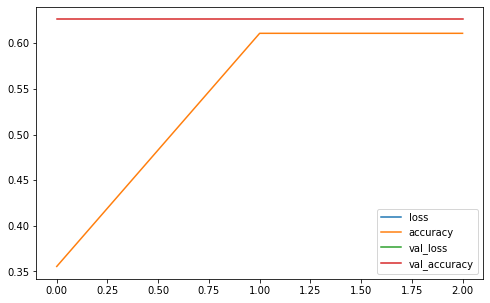

In [ ]:
pd.DataFrame(history.history).plot(figsize=(8,5))
plt.show()

In [ ]:
from keras.models import Sequential
from keras import layers
from keras.layers import Activation, Dense
input_dim = X_train.shape[1]  # Number of features

model = Sequential()
model.add(layers.Dense(10, input_dim=input_dim, activation='relu'))
model.add(Activation('relu'))
model.add(Dense(10))
model.add(Activation('relu'))
model.add(Dense(10))
model.add(Activation('relu'))
model.add(layers.Dense(1, activation='softmax'))

model.compile(optimizer = 'sgd', loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [ ]:
# Fit the model
history = model.fit(X_train, y_train, batch_size=32, epochs=15, validation_split=0.1,callbacks=[EarlyStopping(monitor='val_loss', patience=3, min_delta=0.0001)])

Epoch 1/15
174/174 [==============================] - 2s 5ms/step - loss: nan - accuracy: 0.6006 - val_loss: nan - val_accuracy: 0.6262
Epoch 2/15
174/174 [==============================] - 1s 4ms/step - loss: nan - accuracy: 0.6109 - val_loss: nan - val_accuracy: 0.6262
Epoch 3/15
174/174 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6109 - val_loss: nan - val_accuracy: 0.6262


In [ ]:
print("Test accuracy",(model.evaluate(X_test, y_test,verbose=0)[1]))
print("Train accuracy",model.evaluate(X_train, y_train,verbose=0)[1])

Test accuracy 0.6175898909568787
Train accuracy 0.6124432682991028


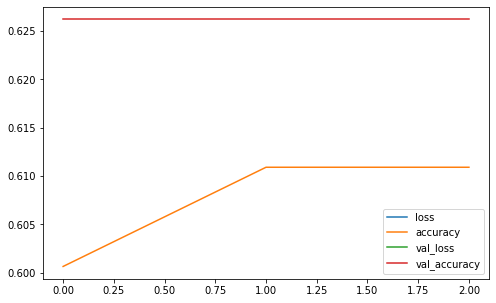

In [ ]:
pd.DataFrame(history.history).plot(figsize=(8,5))
plt.show()

In [ ]:
input_dim = X_train.shape[1]  # Number of features
def create_model():
    # create model
    model = Sequential()
    model.add(layers.Dense(10, input_dim=input_dim, activation='relu'))
    model.add(Activation('relu'))
    model.add(Dense(10))
    model.add(Activation('relu'))
    model.add(Dense(10))
    model.add(Activation('relu'))
    model.add(layers.Dense(4, activation='softmax'))

    model.compile(optimizer = 'sgd', loss = 'categorical_crossentropy', metrics = ['accuracy'])
    return model

# fix random seed for reproducibility
seed = 7
np.random.seed(seed)

# create model
model = KerasClassifier(build_fn=create_model, verbose=0)
# define the grid search parameters
batch_size = [10, 20, 40, 60, 80, 100]
epochs = [10, 50, 100]
param_grid = dict(batch_size=batch_size, epochs=epochs)
grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=3)
grid_result = grid.fit(X_train, y_train, validation_data=(X_test,y_test))
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.613903 using {'batch_size': 80, 'epochs': 50}
0.612445 (0.012478) with: {'batch_size': 10, 'epochs': 10}
0.612445 (0.012478) with: {'batch_size': 10, 'epochs': 50}
0.612445 (0.012478) with: {'batch_size': 10, 'epochs': 100}
0.612445 (0.012478) with: {'batch_size': 20, 'epochs': 10}
0.612445 (0.012478) with: {'batch_size': 20, 'epochs': 50}
0.611797 (0.012903) with: {'batch_size': 20, 'epochs': 100}
0.612445 (0.012478) with: {'batch_size': 40, 'epochs': 10}
0.612283 (0.012249) with: {'batch_size': 40, 'epochs': 50}
0.612445 (0.012478) with: {'batch_size': 40, 'epochs': 100}
0.612445 (0.012478) with: {'batch_size': 60, 'epochs': 10}
0.612445 (0.012478) with: {'batch_size': 60, 'epochs': 50}
0.612607 (0.013037) with: {'batch_size': 60, 'epochs': 100}
0.612283 (0.012608) with: {'batch_size': 80, 'epochs': 10}
0.613903 (0.011728) with: {'batch_size': 80, 'epochs': 50}
0.612769 (0.012285) with: {'batch_size': 80, 'epochs': 100}
0.611473 (0.013135) with: {'batch_size': 100, 'epochs': 

In [ ]:
from keras.models import Sequential
from keras import layers
from keras.layers import Activation, Dense
input_dim = X_train.shape[1]  # Number of features

model = Sequential()
model.add(layers.Dense(10, input_dim=input_dim, activation='relu'))
model.add(Activation('relu'))
model.add(Dense(10))
model.add(Activation('relu'))
model.add(Dense(10))
model.add(Activation('relu'))
model.add(layers.Dense(1, activation='softmax'))

model.compile(optimizer = 'sgd', loss = 'categorical_crossentropy', metrics = ['accuracy'])
# Fit the model
history = model.fit(X_train, y_train, batch_size=80, epochs=50, validation_split=0.1,callbacks=[EarlyStopping(monitor='val_loss', patience=3, min_delta=0.0001)])

Epoch 1/50
70/70 [==============================] - 1s 8ms/step - loss: nan - accuracy: 0.5828 - val_loss: nan - val_accuracy: 0.6262
Epoch 2/50
70/70 [==============================] - 0s 5ms/step - loss: nan - accuracy: 0.6109 - val_loss: nan - val_accuracy: 0.6262
Epoch 3/50
70/70 [==============================] - 0s 4ms/step - loss: nan - accuracy: 0.6109 - val_loss: nan - val_accuracy: 0.6262


In [ ]:
print("Test accuracy",(model.evaluate(X_test, y_test,verbose=0)[1]))
print("Train accuracy",model.evaluate(X_train, y_train,verbose=0)[1])

Test accuracy 0.6175898909568787
Train accuracy 0.6124432682991028


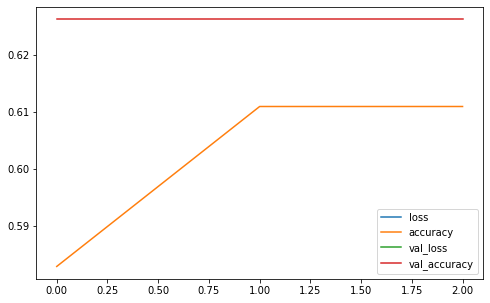

In [ ]:
pd.DataFrame(history.history).plot(figsize=(8,5))
plt.show()

There is absloute no change in score with Basic NN, complex NN & hypertuned NN models. Let us pad the text with fixed length & try the models.

In [ ]:
# The maximum number of words to be used. (most frequent)
MAX_NB_WORDS = 9000
# Max number of words in each complaint.
MAX_SEQUENCE_LENGTH = 250
# This is fixed.
EMBEDDING_DIM = 100

In [ ]:
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Dense, Embedding, LSTM, SpatialDropout1D

from keras.callbacks import EarlyStopping
from keras.layers import Dropout
from keras.models import Sequential
from keras import layers
from keras.layers import Activation, Dense

In [ ]:
tokenizer = Tokenizer(num_words=MAX_NB_WORDS, filters='!"#$%&()*+,-./:;<=>?@[\]^_`{|}~', lower=True)
tokenizer.fit_on_texts(df['translated_description'].values)
word_index = tokenizer.word_index
print('Found %s unique tokens.' % len(word_index))

Found 10742 unique tokens.


In [ ]:
X = tokenizer.texts_to_sequences(df['translated_description'].values)
X = pad_sequences(X, maxlen=MAX_SEQUENCE_LENGTH)
print('Shape of data tensor:', X.shape)

Shape of data tensor: (10288, 250)


In [ ]:
y = pd.get_dummies(df['group']).values
print('Shape of label tensor:', y.shape)

Shape of label tensor: (10288, 4)


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.4, random_state = 7,stratify = y)
print(X_train.shape,y_train.shape)
print(X_test.shape,y_test.shape)

(6172, 250) (6172, 4)
(4116, 250) (4116, 4)


In [ ]:
from keras.models import Sequential
from keras import layers

input_dim = X_train.shape[1]  # Number of features

AnnBasic = Sequential()
AnnBasic.add(layers.Dense(10, input_dim=input_dim, activation='relu'))
AnnBasic.add(layers.Dense(4, activation='softmax'))

AnnBasic.compile(loss='categorical_crossentropy', optimizer='sgd', metrics=['accuracy'])
AnnBasic.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10 (Dense)            (None, 10)                2510      
                                                                 
 dense_11 (Dense)            (None, 4)                 44        
                                                                 
Total params: 2,554
Trainable params: 2,554
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history = AnnBasic.fit(X_train, y_train,epochs=15,verbose=1,batch_size=10,validation_split=0.1,callbacks=[EarlyStopping(monitor='val_loss', patience=3, min_delta=0.0001)])

Epoch 1/15
556/556 [==============================] - 1s 2ms/step - loss: 188.2836 - accuracy: 0.6098 - val_loss: 1.0899 - val_accuracy: 0.6214
Epoch 2/15
556/556 [==============================] - 1s 1ms/step - loss: 1.0907 - accuracy: 0.6138 - val_loss: 1.0792 - val_accuracy: 0.6214
Epoch 3/15
556/556 [==============================] - 1s 1ms/step - loss: 1.0889 - accuracy: 0.6138 - val_loss: 1.0790 - val_accuracy: 0.6214
Epoch 4/15
556/556 [==============================] - 1s 1ms/step - loss: 1.0887 - accuracy: 0.6138 - val_loss: 1.0787 - val_accuracy: 0.6214
Epoch 5/15
556/556 [==============================] - 1s 1ms/step - loss: 1.0888 - accuracy: 0.6138 - val_loss: 1.0787 - val_accuracy: 0.6214
Epoch 6/15
556/556 [==============================] - 1s 1ms/step - loss: 1.0888 - accuracy: 0.6138 - val_loss: 1.0789 - val_accuracy: 0.6214
Epoch 7/15
556/556 [==============================] - 1s 1ms/step - loss: 1.0888 - accuracy: 0.6138 - val_loss: 1.0788 - val_accuracy: 0.6214


In [ ]:
print("Test accuracy",(AnnBasic.evaluate(X_test, y_test,verbose=0)[1]))
print("Train accuracy",AnnBasic.evaluate(X_train, y_train,verbose=0)[1])

Test accuracy 0.6175898909568787
Train accuracy 0.6124432682991028


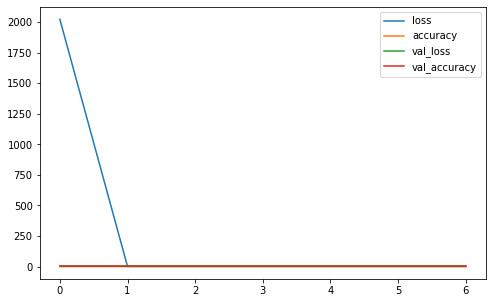

In [ ]:
pd.DataFrame(history.history).plot(figsize=(8,5))
plt.show()

In [ ]:
input_dim = X_train.shape[1] 
modelANN = Sequential()
modelANN.add(layers.Dense(10, input_dim=input_dim, activation='relu'))
modelANN.add(Activation('relu'))
modelANN.add(Dense(10))
modelANN.add(Activation('relu'))
modelANN.add(Dense(10))
modelANN.add(Activation('relu'))
modelANN.add(layers.Dense(4, activation='softmax'))

modelANN.compile(optimizer = 'sgd', loss = 'categorical_crossentropy', metrics = ['accuracy'])
modelANN.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12 (Dense)            (None, 10)                2510      
                                                                 
 activation_3 (Activation)   (None, 10)                0         
                                                                 
 dense_13 (Dense)            (None, 10)                110       
                                                                 
 activation_4 (Activation)   (None, 10)                0         
                                                                 
 dense_14 (Dense)            (None, 10)                110       
                                                                 
 activation_5 (Activation)   (None, 10)                0         
                                                                 
 dense_15 (Dense)            (None, 4)                

In [ ]:
history = modelANN.fit(X_train, y_train, epochs=15, batch_size=32,validation_split=0.1,callbacks=[EarlyStopping(monitor='val_loss', patience=3, min_delta=0.01)])

Epoch 1/15
174/174 [==============================] - 1s 3ms/step - loss: 2.3020 - accuracy: 0.6091 - val_loss: 1.1839 - val_accuracy: 0.6214
Epoch 2/15
174/174 [==============================] - 0s 2ms/step - loss: 1.1496 - accuracy: 0.6138 - val_loss: 1.1139 - val_accuracy: 0.6214
Epoch 3/15
174/174 [==============================] - 0s 2ms/step - loss: 1.1095 - accuracy: 0.6138 - val_loss: 1.0911 - val_accuracy: 0.6214
Epoch 4/15
174/174 [==============================] - 0s 2ms/step - loss: 1.0971 - accuracy: 0.6138 - val_loss: 1.0839 - val_accuracy: 0.6214
Epoch 5/15
174/174 [==============================] - 0s 2ms/step - loss: 1.0933 - accuracy: 0.6138 - val_loss: 1.0813 - val_accuracy: 0.6214
Epoch 6/15
174/174 [==============================] - 0s 2ms/step - loss: 1.0920 - accuracy: 0.6138 - val_loss: 1.0803 - val_accuracy: 0.6214
Epoch 7/15
174/174 [==============================] - 0s 2ms/step - loss: 1.0916 - accuracy: 0.6138 - val_loss: 1.0799 - val_accuracy: 0.6214
Epoch 

In [ ]:
print("Test accuracy",(modelANN.evaluate(X_test, y_test,verbose=0)[1]))
print("Train accuracy",modelANN.evaluate(X_train, y_train,verbose=0)[1])

Test accuracy 0.614188551902771
Train accuracy 0.6145495772361755


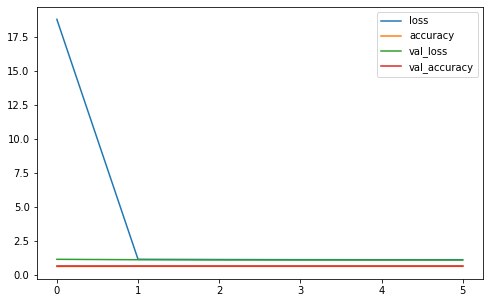

In [ ]:
pd.DataFrame(history.history).plot(figsize=(8,5))
plt.show()

In [ ]:
# loading library
import pickle
# create an iterator object with write permission - model.pkl
with open('modelANN_pkl', 'wb') as files:
    pickle.dump(modelANN, files)

INFO:tensorflow:Assets written to: ram://7818200b-a7fe-4e51-bf4b-aabb956b8ce3/assets


INFO:tensorflow:Assets written to: ram://7818200b-a7fe-4e51-bf4b-aabb956b8ce3/assets


In [ ]:
ModelSummary = ModelSummary.append({'Model Type' : 'ANN', 'Train Acc' : '61.75','Test Acc' : '61.14','Epochs' : '3','Std Dev F1' : '0.402','ModelSize(MB)':'0.15'}, ignore_index = True)
ModelSummary

,Model Type,Train Acc,Test Acc,Epochs,Std Dev F1,ModelSize(MB)
0,ANN,61.75,61.14,3,0.402,0.15


## LSTM

In [ ]:
lstm_basic = Sequential()
lstm_basic.add(Embedding(MAX_NB_WORDS, EMBEDDING_DIM, input_length=X.shape[1]))
lstm_basic.add(SpatialDropout1D(0.2))
lstm_basic.add(LSTM(100, dropout=0.2, recurrent_dropout=0.2))
lstm_basic.add(Dense(4, activation='softmax'))
lstm_basic.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [ ]:
lstm_basic.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 250, 100)          900000    
                                                                 
 spatial_dropout1d_1 (Spatia  (None, 250, 100)         0         
 lDropout1D)                                                     
                                                                 
 lstm_1 (LSTM)               (None, 100)               80400     
                                                                 
 dense_17 (Dense)            (None, 4)                 404       
                                                                 
Total params: 980,804
Trainable params: 980,804
Non-trainable params: 0
_________________________________________________________________


In [ ]:
history = lstm_basic.fit(X_train, y_train, epochs=15, batch_size=32,validation_split=0.1,callbacks=[EarlyStopping(monitor='val_loss', patience=3, min_delta=0.0001)])


Epoch 1/15
174/174 [==============================] - 91s 505ms/step - loss: 0.6348 - accuracy: 0.7758 - val_loss: 0.2489 - val_accuracy: 0.9110
Epoch 2/15
174/174 [==============================] - 88s 504ms/step - loss: 0.2057 - accuracy: 0.9373 - val_loss: 0.1773 - val_accuracy: 0.9385
Epoch 3/15
174/174 [==============================] - 87s 503ms/step - loss: 0.1186 - accuracy: 0.9649 - val_loss: 0.1744 - val_accuracy: 0.9369
Epoch 4/15
174/174 [==============================] - 87s 503ms/step - loss: 0.0757 - accuracy: 0.9798 - val_loss: 0.2071 - val_accuracy: 0.9466
Epoch 5/15
174/174 [==============================] - 88s 503ms/step - loss: 0.0574 - accuracy: 0.9861 - val_loss: 0.1894 - val_accuracy: 0.9434
Epoch 6/15
174/174 [==============================] - 88s 505ms/step - loss: 0.0441 - accuracy: 0.9894 - val_loss: 0.2131 - val_accuracy: 0.9515


In [ ]:
print("Test accuracy",(lstm_basic.evaluate(X_test, y_test,verbose=0)[1]))
print("Train accuracy",lstm_basic.evaluate(X_train, y_train,verbose=0)[1])

Test accuracy 0.9455782175064087
Train accuracy 0.989144504070282


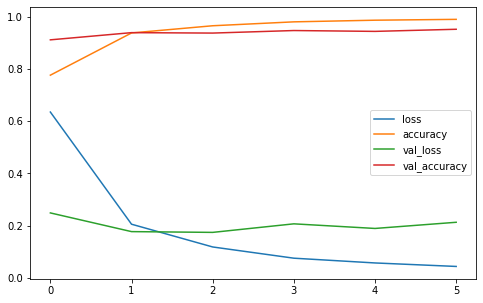

In [ ]:
pd.DataFrame(history.history).plot(figsize=(8,5))
plt.show()

In [ ]:
for i in range(0,5):
    y_pred=lstm_basic.predict(X_test)[i]
    print("Predicted label:", y_pred.argmax())
    print("Actual Label:", y_test[i])

Predicted label: 3
Actual Label: 3
Predicted label: 0
Actual Label: 0
Predicted label: 2
Actual Label: 2
Predicted label: 0
Actual Label: 0
Predicted label: 3
Actual Label: 3


In [ ]:
# Tools & Evaluation metrics
from sklearn.metrics import confusion_matrix, classification_report, auc
from sklearn.metrics import roc_curve, accuracy_score, precision_recall_curve
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import RandomOverSampler

In [ ]:
# predict from the claffier
y_pred = lstm_basic.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)
#y_test = np.argmax(y_test)


print('='*80)
print('Confusion matrix:\n %s' % (confusion_matrix(y_test, y_pred)))
print('='*80)
print('Classification report:\n %s' % (classification_report(y_test, y_pred)))


Confusion matrix:
 [[2431   71   16   11]
 [  52  464    0   13]
 [  18    0  511    0]
 [  24   18    1  486]]
Classification report:
               precision    recall  f1-score   support

           0       0.96      0.96      0.96      2529
           1       0.84      0.88      0.86       529
           2       0.97      0.97      0.97       529
           3       0.95      0.92      0.94       529

    accuracy                           0.95      4116
   macro avg       0.93      0.93      0.93      4116
weighted avg       0.95      0.95      0.95      4116



In [ ]:
# loading library
import pickle
# create an iterator object with write permission - model.pkl
with open('lstm_basic_pkl', 'wb') as files:
    pickle.dump(lstm_basic, files)

INFO:tensorflow:Assets written to: ram://4bf48f5f-80de-4663-bca8-fca06a4a75df/assets


In [ ]:
import statistics
sample = [0.96,0.86,0.97,0.94]
print("Standard Deviation of the sample is % s " %(statistics.stdev(sample)))

Standard Deviation of the sample is 0.04991659710623978 


In [ ]:
ModelSummary = ModelSummary.append({'Model Type' : 'LSTM', 'Train Acc' : '98.96','Test Acc' : '94.38','Epochs' : '9','Std Dev F1' : '0.045','ModelSize(MB)':'11'}, ignore_index = True)
ModelSummary

,Model Type,Train Acc,Test Acc,Epochs,Std Dev F1,ModelSize(MB)
0,ANN,61.75,61.14,3,0.402,0.15
1,LSTM,98.96,94.38,9,0.045,11


In [ ]:
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense
from keras.layers import BatchNormalization, Dropout
from keras.layers import Activation, Dense
from keras import optimizers
from keras.layers import Flatten
from sklearn.model_selection import GridSearchCV
from keras.wrappers.scikit_learn import KerasClassifier

#### Loading pre build word embeddings - Glove

In [ ]:
embeddings_index = {}
embedding_dim = 50
GLOVE_DIR = ""
f = open(os.path.join(GLOVE_DIR, './DataSet - glove.6B.50d.txt'), encoding = "utf-8")
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()

print('Found %s word vectors.' % len(embeddings_index))

Found 400000 word vectors.


In [ ]:
embedding_matrix = np.zeros((len(word_index) + 1, embedding_dim))
c = 0
for word, i in word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        c=c+1
        embedding_matrix[i] = embedding_vector
print(c)

5509


#### Build the embedding layer

In [ ]:
embedding_layer = Embedding(len(word_index) + 1,
                            embedding_dim,
                            weights=[embedding_matrix],
                            input_length=MAX_SEQUENCE_LENGTH,
                            trainable=False)

## Bidirectional LSTM model

In [ ]:
#Basic LSTM model
LSTM_Glove6B_50d = Sequential()
LSTM_Glove6B_50d.add(embedding_layer)
LSTM_Glove6B_50d.add(LSTM(64, dropout=0.2, recurrent_dropout=0.25))
LSTM_Glove6B_50d.add(Dense(4, activation='sigmoid'))

LSTM_Glove6B_50d.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

print('Summary of the built model...')
print(LSTM_Glove6B_50d.summary())

Summary of the built model...
Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 250, 50)           537150    
                                                                 
 lstm_4 (LSTM)               (None, 64)                29440     
                                                                 
 dense_20 (Dense)            (None, 4)                 260       
                                                                 
Total params: 566,850
Trainable params: 29,700
Non-trainable params: 537,150
_________________________________________________________________
None


In [ ]:
history = LSTM_Glove6B_50d.fit(X_train, y_train, batch_size=32, epochs=15, validation_split=0.1,callbacks=[EarlyStopping(monitor='val_loss', patience=3, min_delta=0.0001)], verbose=2)

Epoch 1/15
174/174 - 54s - loss: 0.2427 - accuracy: 0.9165 - val_loss: 0.2494 - val_accuracy: 0.8997 - 54s/epoch - 311ms/step
Epoch 2/15
174/174 - 52s - loss: 0.2288 - accuracy: 0.9190 - val_loss: 0.2619 - val_accuracy: 0.9061 - 52s/epoch - 300ms/step
Epoch 3/15
174/174 - 52s - loss: 0.2187 - accuracy: 0.9274 - val_loss: 0.2114 - val_accuracy: 0.9272 - 52s/epoch - 297ms/step
Epoch 4/15
174/174 - 52s - loss: 0.2049 - accuracy: 0.9285 - val_loss: 0.2043 - val_accuracy: 0.9304 - 52s/epoch - 297ms/step
Epoch 5/15
174/174 - 51s - loss: 0.1947 - accuracy: 0.9336 - val_loss: 0.2248 - val_accuracy: 0.9207 - 51s/epoch - 294ms/step
Epoch 6/15
174/174 - 51s - loss: 0.1827 - accuracy: 0.9372 - val_loss: 0.2406 - val_accuracy: 0.9159 - 51s/epoch - 294ms/step
Epoch 7/15
174/174 - 52s - loss: 0.1737 - accuracy: 0.9381 - val_loss: 0.1980 - val_accuracy: 0.9288 - 52s/epoch - 298ms/step
Epoch 8/15
174/174 - 51s - loss: 0.1747 - accuracy: 0.9417 - val_loss: 0.2180 - val_accuracy: 0.9304 - 51s/epoch - 295

In [ ]:
print("Test accuracy",(LSTM_Glove6B_50d.evaluate(X_test, y_test,verbose=0)[1]))
print("Train accuracy",LSTM_Glove6B_50d.evaluate(X_train, y_train,verbose=0)[1])

Test accuracy 0.9324586987495422
Train accuracy 0.9794232249259949


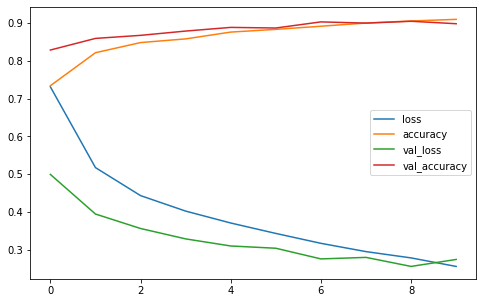

In [ ]:
pd.DataFrame(history.history).plot(figsize=(8,5))
plt.show()

In [ ]:
# predict from the claffier
y_pred1 = LSTM_Glove6B_50d.predict(X_test)
y_pred = np.argmax(y_pred1, axis=1)
y_test1 = np.argmax(y_test, axis=1)

print('='*80)
print('Confusion matrix:\n %s' % (confusion_matrix(y_test1, y_pred)))
print('='*80)
print('Classification report:\n %s' % (classification_report(y_test1, y_pred)))

Confusion matrix:
 [[2400   59   61    9]
 [  54  456    9   10]
 [  18    8  503    0]
 [  27   21    2  479]]
Classification report:
               precision    recall  f1-score   support

           0       0.96      0.95      0.95      2529
           1       0.84      0.86      0.85       529
           2       0.87      0.95      0.91       529
           3       0.96      0.91      0.93       529

    accuracy                           0.93      4116
   macro avg       0.91      0.92      0.91      4116
weighted avg       0.93      0.93      0.93      4116



In [ ]:
import pickle
# create an iterator object with write permission - model.pkl
with open('LSTM_Glove6B_50d_pkl', 'wb') as files:
    pickle.dump(LSTM_Glove6B_50d, files)

INFO:tensorflow:Assets written to: ram://f77aeb9a-f024-4977-8e91-5feafce6deea/assets


INFO:tensorflow:Assets written to: ram://f77aeb9a-f024-4977-8e91-5feafce6deea/assets


In [ ]:
import statistics
sample = [0.95,0.85,0.91,0.93]
print("Standard Deviation of the sample is % s " %(statistics.stdev(sample)))

Standard Deviation of the sample is 0.04320493798938574 


In [ ]:
ModelSummary = ModelSummary.append({'Model Type' : 'LSTM_Glove6B_50d', 'Train Acc' : '97.94','Test Acc' : '93.24','Epochs' : '15','Std Dev F1' : '0.043','ModelSize(MB)':'3'}, ignore_index = True)
ModelSummary

,Model Type,Train Acc,Test Acc,Epochs,Std Dev F1,ModelSize(MB)
0,ANN,61.75,61.14,3,0.402,0.15
1,LSTM,98.96,94.38,9,0.045,11
2,LSTM_Glove6B_50d,97.94,93.24,15,0.043,3


## Bidirectional GATED RECURRENT UNIT (GRU)

In [ ]:
import tensorflow as tf

#Building the GRU Model
model_gru = tf.keras.Sequential([
    tf.keras.layers.Embedding(len(word_index) + 1,embedding_dim,weights=[embedding_matrix],input_length=X.shape[1],trainable=False),
    tf.keras.layers.Bidirectional(tf.keras.layers.GRU(16)),
    tf.keras.layers.Dense(6, activation='relu'),
    tf.keras.layers.Dense(4, activation='sigmoid')
])

In [ ]:
model_gru.summary()

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_3 (Embedding)     (None, 250, 50)           537150    
                                                                 
 bidirectional (Bidirectiona  (None, 32)               6528      
 l)                                                              
                                                                 
 dense_21 (Dense)            (None, 6)                 198       
                                                                 
 dense_22 (Dense)            (None, 4)                 28        
                                                                 
Total params: 543,904
Trainable params: 6,754
Non-trainable params: 537,150
_________________________________________________________________


In [ ]:
model_gru.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
history = model_gru.fit(X_train, y_train, batch_size=32, epochs=25, validation_split=0.1,callbacks=[EarlyStopping(monitor='val_loss', patience=3, min_delta=0.001)], verbose=2)

Epoch 1/25
174/174 - 28s - loss: 1.0373 - accuracy: 0.5999 - val_loss: 0.8313 - val_accuracy: 0.7136 - 28s/epoch - 158ms/step
Epoch 2/25
174/174 - 23s - loss: 0.7784 - accuracy: 0.7310 - val_loss: 0.6315 - val_accuracy: 0.7896 - 23s/epoch - 130ms/step
Epoch 3/25
174/174 - 23s - loss: 0.6210 - accuracy: 0.7814 - val_loss: 0.5012 - val_accuracy: 0.8252 - 23s/epoch - 133ms/step
Epoch 4/25
174/174 - 23s - loss: 0.5229 - accuracy: 0.8095 - val_loss: 0.4376 - val_accuracy: 0.8447 - 23s/epoch - 130ms/step
Epoch 5/25
174/174 - 23s - loss: 0.4604 - accuracy: 0.8414 - val_loss: 0.3934 - val_accuracy: 0.8738 - 23s/epoch - 131ms/step
Epoch 6/25
174/174 - 23s - loss: 0.4112 - accuracy: 0.8570 - val_loss: 0.3691 - val_accuracy: 0.8738 - 23s/epoch - 130ms/step
Epoch 7/25
174/174 - 23s - loss: 0.3765 - accuracy: 0.8736 - val_loss: 0.3560 - val_accuracy: 0.8819 - 23s/epoch - 134ms/step
Epoch 8/25
174/174 - 22s - loss: 0.3546 - accuracy: 0.8857 - val_loss: 0.3425 - val_accuracy: 0.8851 - 22s/epoch - 128

In [ ]:
print("Test accuracy",(model_gru.evaluate(X_test, y_test,verbose=0)[1]))
print("Train accuracy",model_gru.evaluate(X_train, y_train,verbose=0)[1])

Test accuracy 0.8867833018302917
Train accuracy 0.9416720867156982


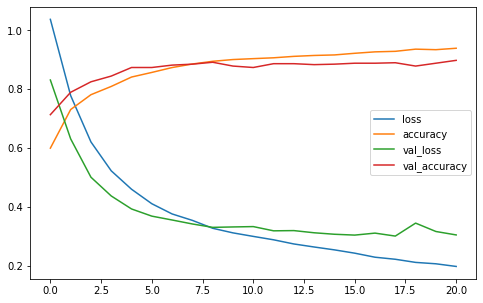

In [ ]:
pd.DataFrame(history.history).plot(figsize=(8,5))
plt.show()

In [ ]:
# predict from the claffier
y_pred1 = model_gru.predict(X_test)
y_pred = np.argmax(y_pred1, axis=1)
y_test1 = np.argmax(y_test, axis=1)



print('='*80)
print('Confusion matrix:\n %s' % (confusion_matrix(y_test1, y_pred)))
print('='*80)
print('Classification report:\n %s' % (classification_report(y_test1, y_pred)))

Confusion matrix:
 [[2337  124   64    4]
 [ 116  376   13   24]
 [  47    9  473    0]
 [  28   36    1  464]]
Classification report:
               precision    recall  f1-score   support

           0       0.92      0.92      0.92      2529
           1       0.69      0.71      0.70       529
           2       0.86      0.89      0.88       529
           3       0.94      0.88      0.91       529

    accuracy                           0.89      4116
   macro avg       0.85      0.85      0.85      4116
weighted avg       0.89      0.89      0.89      4116



In [ ]:
import statistics
sample = [0.92,0.70,0.88,0.91]
print("Standard Deviation of the sample is % s " %(statistics.stdev(sample)))

Standard Deviation of the sample is 0.10307764064044155 


In [ ]:
import pickle
# create an iterator object with write permission - model.pkl
with open('Bidirect_GRU_pkl', 'wb') as files:
    pickle.dump(model_gru, files)

INFO:tensorflow:Assets written to: ram://924b600b-8596-42d0-b1b5-7970d635f04f/assets


INFO:tensorflow:Assets written to: ram://924b600b-8596-42d0-b1b5-7970d635f04f/assets


In [ ]:
ModelSummary = ModelSummary.append({'Model Type' : 'Bidirect_GRU', 'Train Acc' : '94.16','Test Acc' : '88.67','Epochs' : '21','Std Dev F1' : '0.103','ModelSize(MB)':'4'}, ignore_index = True)
ModelSummary

,Model Type,Train Acc,Test Acc,Epochs,Std Dev F1,ModelSize(MB)
0,ANN,61.75,61.14,3,0.402,0.15
1,LSTM,98.96,94.38,9,0.045,11
2,LSTM_Glove6B_50d,97.94,93.24,15,0.043,3
3,Bidirect_GRU,94.16,88.67,21,0.103,4


## Stacked LSTM

In [ ]:
#Basic LSTM model
lstm_stack = Sequential()
lstm_stack.add(embedding_layer)
lstm_stack.add(LSTM(64, dropout=0.2, recurrent_dropout=0.25,return_sequences=True))
lstm_stack.add(LSTM(64,return_sequences=True))
lstm_stack.add(LSTM(64))
lstm_stack.add(Dense(4, activation='sigmoid'))

lstm_stack.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

print('Summary of the built model...')
print(lstm_stack.summary())

Summary of the built model...
Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 250, 50)           537150    
                                                                 
 lstm_5 (LSTM)               (None, 250, 64)           29440     
                                                                 
 lstm_6 (LSTM)               (None, 250, 64)           33024     
                                                                 
 lstm_7 (LSTM)               (None, 64)                33024     
                                                                 
 dense_23 (Dense)            (None, 4)                 260       
                                                                 
Total params: 632,898
Trainable params: 95,748
Non-trainable params: 537,150
_________________________________________________________________
None


In [ ]:
lstm_stack.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
history = lstm_stack.fit(X_train, y_train, batch_size=32, epochs=25,validation_split=0.1,callbacks=[EarlyStopping(monitor='val_loss', patience=3, min_delta=0.0001)], verbose=2)

Epoch 1/25
174/174 - 112s - loss: 0.7670 - accuracy: 0.7117 - val_loss: 0.5575 - val_accuracy: 0.7864 - 112s/epoch - 644ms/step
Epoch 2/25
174/174 - 104s - loss: 0.5224 - accuracy: 0.8142 - val_loss: 0.4345 - val_accuracy: 0.8317 - 104s/epoch - 596ms/step
Epoch 3/25
174/174 - 102s - loss: 0.4378 - accuracy: 0.8524 - val_loss: 0.3846 - val_accuracy: 0.8641 - 102s/epoch - 587ms/step
Epoch 4/25
174/174 - 102s - loss: 0.4007 - accuracy: 0.8682 - val_loss: 0.3774 - val_accuracy: 0.8576 - 102s/epoch - 587ms/step
Epoch 5/25
174/174 - 107s - loss: 0.3525 - accuracy: 0.8853 - val_loss: 0.3479 - val_accuracy: 0.8706 - 107s/epoch - 613ms/step
Epoch 6/25
174/174 - 123s - loss: 0.3306 - accuracy: 0.8911 - val_loss: 0.3241 - val_accuracy: 0.8900 - 123s/epoch - 709ms/step
Epoch 7/25
174/174 - 102s - loss: 0.3149 - accuracy: 0.8967 - val_loss: 0.3032 - val_accuracy: 0.8997 - 102s/epoch - 587ms/step
Epoch 8/25
174/174 - 102s - loss: 0.2848 - accuracy: 0.9013 - val_loss: 0.2804 - val_accuracy: 0.8964 - 

In [ ]:
print("Test accuracy",(lstm_stack.evaluate(X_test, y_test,verbose=0)[1]))
print("Train accuracy",(lstm_stack.evaluate(X_train, y_train,verbose=0)[1]))

Test accuracy 0.9373177886009216
Train accuracy 0.9813674688339233


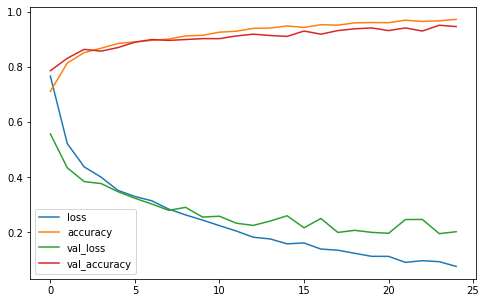

In [ ]:
pd.DataFrame(history.history).plot(figsize=(8,5))
plt.show()

In [ ]:
# predict from the claffier
y_pred1 = lstm_stack.predict(X_test)
y_pred = np.argmax(y_pred1, axis=1)
y_test1 = np.argmax(y_test, axis=1)



print('='*80)
print('Confusion matrix:\n %s' % (confusion_matrix(y_test1, y_pred)))
print('='*80)
print('Classification report:\n %s' % (classification_report(y_test1, y_pred)))

Confusion matrix:
 [[2454   50   16    9]
 [  56  456    1   16]
 [  54    5  470    0]
 [  31   20    0  478]]
Classification report:
               precision    recall  f1-score   support

           0       0.95      0.97      0.96      2529
           1       0.86      0.86      0.86       529
           2       0.97      0.89      0.93       529
           3       0.95      0.90      0.93       529

    accuracy                           0.94      4116
   macro avg       0.93      0.91      0.92      4116
weighted avg       0.94      0.94      0.94      4116



In [ ]:
import statistics
sample = [0.96,0.86,0.93,0.93]
print("Standard Deviation of the sample is % s " %(statistics.stdev(sample)))

Standard Deviation of the sample is 0.042426406871192854 


In [ ]:
import pickle
# create an iterator object with write permission - model.pkl
with open('lstm_stack_pkl', 'wb') as files:
    pickle.dump(lstm_stack, files)

INFO:tensorflow:Assets written to: ram://4c319716-c62c-4b09-8d68-daab1e1cda3b/assets


INFO:tensorflow:Assets written to: ram://4c319716-c62c-4b09-8d68-daab1e1cda3b/assets


In [ ]:
ModelSummary = ModelSummary.append({'Model Type' : 'lstm_stack', 'Train Acc' : '98.13','Test Acc' : '93.73','Epochs' : '25','Std Dev F1' : '0.042','ModelSize(MB)':'5'}, ignore_index = True)
ModelSummary

,Model Type,Train Acc,Test Acc,Epochs,Std Dev F1,ModelSize(MB)
0,ANN,61.75,61.14,3,0.402,0.15
1,LSTM,98.96,94.38,9,0.045,11
2,LSTM_Glove6B_50d,97.94,93.24,15,0.043,3
3,Bidirect_GRU,94.16,88.67,21,0.103,4
4,lstm_stack,98.13,93.73,25,0.042,5


## Deployment

In [2]:
!pip install streamlit

     |████████████████████████████████| 9.7 MB 7.4 MB/s 
     |████████████████████████████████| 4.3 MB 56.9 MB/s 
     |████████████████████████████████| 164 kB 42.4 MB/s 
     |████████████████████████████████| 76 kB 5.0 MB/s 
     |████████████████████████████████| 181 kB 46.8 MB/s 
     |████████████████████████████████| 111 kB 48.8 MB/s 
     |████████████████████████████████| 63 kB 1.4 MB/s 
     |████████████████████████████████| 128 kB 41.0 MB/s 
     |████████████████████████████████| 792 kB 45.7 MB/s 
     |████████████████████████████████| 380 kB 49.8 MB/s 
  Created wheel for blinker: filename=blinker-1.4-py3-none-any.whl size=13478 sha256=432b762f759a5ac88bf49431352b9f78cbe6be020b0c778a50c3a78c45eb2c5a
  Stored in directory: /root/.cache/pip/wheels/22/f5/18/df711b66eb25b21325c132757d4314db9ac5e8dabeaf196eab
Successfully built blinker
  Attempting uninstall: prompt-toolkit
    Found existing installation: prompt-toolkit 1.0.18
    Uninstalling prompt-toolkit-1.0.18:
      S

In [ ]:
import numpy as np
import pickle
import pandas as pd
import keras
import tensorflow
#from flasgger import Swagger
import streamlit as st 

from PIL import Image

#app=Flask(__name__)
#Swagger(app)

#pickle_in = open("lstm_stack.pkl","rb")
classifier=tensorflow.keras.models.load_model('lstm_pkl.h5')

#@app.route('/')
def welcome():
    return "Welcome All"

#@app.route('/predict',methods=["Get"])
def predict_note_authentication(translated_description):
    
    """Let's Authenticate the Banks Note 
    This is using docstrings for specifications.
    ---
    parameters:  
      - name: translated_description
        in: query
        type: text
        required: true
    responses:
        200:
            description: The output values
        
    """
   
    prediction=classifier.predict([[translated_description]])
    print(prediction)
    return prediction



def main():
    st.title("Automatic Ticket Assignment Prediction")
    html_temp = """
    <div style="background-color:tomato;padding:10px">
    <h2 style="color:white;text-align:center;">Streamlit Bank Authenticator ML App </h2>
    </div>
    """
    st.markdown(html_temp,unsafe_allow_html=True)
    translated_description = st.text_input("translated_description","Type Here")
    result=""
    if st.button("Predict"):
        result=predict_note_authentication(translated_description)
    st.success('The output is {}'.format(result))
    if st.button("About"):
        st.text("Lets LEarn")
        st.text("Built with Streamlit")

if __name__=='__main__':
    main()

(base) C:\Users\Arjun\GreatLeanring\Capstone Project\Deployement>streamlit run app1.py

  You can now view your Streamlit app in your browser.

  Local URL: http://localhost:8501
  Network URL: http://192.168.0.162:8501

#### End of Notebook ####